In [1]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.preprocessing import MinMaxScaler
import time
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from tensorflow.keras.optimizers import Adam
from tensorflow import keras
from tensorflow.keras import Sequential,layers,callbacks
from tensorflow.keras.layers import Dense,LSTM,Dropout,GRU,Bidirectional 
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.models import load_model

import warnings
warnings.filterwarnings('ignore')
%matplotlib inline

In [2]:
df = pd.read_excel('datasett_len.xlsx')
df.head()

,Temp,Size,Time,Moisture
0,338,1.5,0,1.0000
1,338,1.5,1,0.9096
2,338,1.5,2,0.8316
3,338,1.5,3,0.7648
4,338,1.5,4,0.7080


In [3]:
df.shape

(3852, 4)

In [4]:
X = df
y = df.loc[:,['Moisture']]
X_test = X[3531:3852]
y_test = y[3531:3852]
X_train = X[0:3531]
y_train =y[0:3531]

X_train.shape

(3531, 4)

In [5]:
X_test.shape

(321, 4)

In [6]:
y_test

,Moisture
3531,1.00000
3532,0.98245
3533,0.96480
3534,0.94705
3535,0.92920
...,...
3847,0.04000
3848,0.04000
3849,0.04000
3850,0.04000


In [7]:
X_test.tail()

,Temp,Size,Time,Moisture
3847,368,4.5,316,0.04
3848,368,4.5,317,0.04
3849,368,4.5,318,0.04
3850,368,4.5,319,0.04
3851,368,4.5,320,0.04


In [8]:
X_test.describe()

,Temp,Size,Time,Moisture
count,321.0,321.0,321.000000,321.000000
mean,368.0,4.5,160.000000,0.160498
std,0.0,0.0,92.808944,0.224844
min,368.0,4.5,0.000000,0.040000
25%,368.0,4.5,80.000000,0.040000
50%,368.0,4.5,160.000000,0.040000
75%,368.0,4.5,240.000000,0.160000
max,368.0,4.5,320.000000,1.000000


In [9]:
Xval = X_test.values
Xval

array([[3.6800e+02, 4.5000e+00, 0.0000e+00, 1.0000e+00],
       [3.6800e+02, 4.5000e+00, 1.0000e+00, 9.8245e-01],
       [3.6800e+02, 4.5000e+00, 2.0000e+00, 9.6480e-01],
       ...,
       [3.6800e+02, 4.5000e+00, 3.1800e+02, 4.0000e-02],
       [3.6800e+02, 4.5000e+00, 3.1900e+02, 4.0000e-02],
       [3.6800e+02, 4.5000e+00, 3.2000e+02, 4.0000e-02]])

In [10]:
Xval[1,2]

1.0

In [11]:
# Scale features
s1 = MinMaxScaler(feature_range =(-1, 1))
#Xs = s1.fit_transform(df[['Tair', 'RH', 'Vel', 'Size', 'Tsec', 'L', 'P', 'F', 'Tdrop']])
Xs = s1.fit_transform(X_train)
#Xs = s1.fit_transform(df(X)) alternative representation
#Scale predicted value
s2 = MinMaxScaler(feature_range=(-1, 1))
#Ys = s2.fit_transform(df[['Tdrop']])
Ys = s2.fit_transform(y_train)
#Ys = s2.fit_transform(df(y)) alternative representation
Xs.shape
s3 = MinMaxScaler(feature_range=(-1, 1))
s4 = MinMaxScaler(feature_range=(-1, 1))

In [12]:
winn1 = [['Hidden Layer', 'Time Step', 'Neuron', 'R2SCORETRAIN', 'R2SCORETEST', 'Training Time']]
predd = [['Hidden Layer', 'Time Step', 'Neuron', 'R2SCORETRAIN', 'R2SCOREPRED']]
winn1

[['Hidden Layer',
  'Time Step',
  'Neuron',
  'R2SCORETRAIN',
  'R2SCORETEST',
  'Training Time']]

In [13]:
data = [['Hidden Layer', 'Time Step', 'Neuron', 'Temp', 'Size', 'Time', 'Actual Mc', 'Predicted Mc', 'Next Prediction']]
data

[['Hidden Layer',
  'Time Step',
  'Neuron',
  'Temp',
  'Size',
  'Time',
  'Actual Mc',
  'Predicted Mc',
  'Next Prediction']]

Epoch 1/500
89/89 [==============================] - 1s 15ms/step - loss: 0.4385 - accuracy: 0.0000e+00 - val_loss: 0.1245 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 4ms/step - loss: 0.1065 - accuracy: 0.0000e+00 - val_loss: 0.0534 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0779 - accuracy: 0.0000e+00 - val_loss: 0.0291 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0612 - accuracy: 0.0000e+00 - val_loss: 0.0235 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0502 - accuracy: 0.0000e+00 - val_loss: 0.0226 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0457 - accuracy: 0.0000e+00 - val_loss: 0.0199 - val_accuracy: 0.0000e+00
Epoch 7/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.0000e+00 - 

89/89 [==============================] - 0s 4ms/step - loss: 0.0187 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0200 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0192 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0191 - accuracy: 0.0000e+00 - val_loss: 0.0117 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0187 - accuracy: 0.0000e+00 - val_loss: 0.0116 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0192 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 61/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0185 - accuracy: 0.0000e+00 - val_los

findfont: Font family ['DejaVu Sans Display'] not found. Falling back to DejaVu Sans.


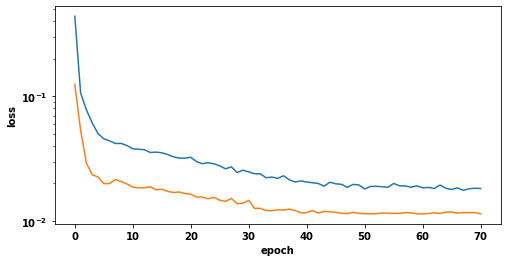

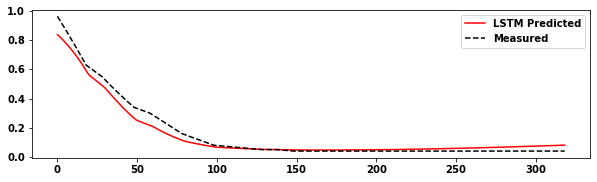

The R2 score of the Training set is :	0.9246
The R2 score of the Testing set is :	0.9670
2 2 10 0.9245644648339666
2 2 10 0.9669731728480473


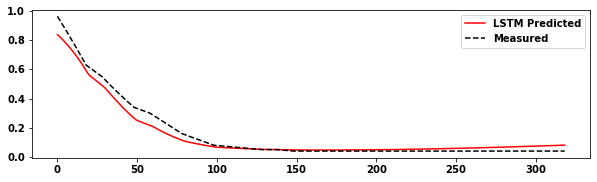

The R2 score of the Training set of  predicted values to predict is :	0.9246
The R2 score of the Testing set predicted values to predict is :	0.9522
Epoch 1/500
89/89 [==============================] - 2s 22ms/step - loss: 0.4375 - accuracy: 0.0000e+00 - val_loss: 0.0860 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 5ms/step - loss: 0.1261 - accuracy: 0.0000e+00 - val_loss: 0.0521 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0917 - accuracy: 0.0000e+00 - val_loss: 0.0282 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0690 - accuracy: 0.0000e+00 - val_loss: 0.0230 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0538 - accuracy: 0.0000e+00 - val_loss: 0.0207 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0478 - accuracy: 0.0000e+00 - 

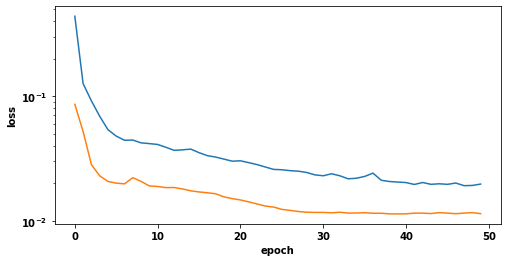

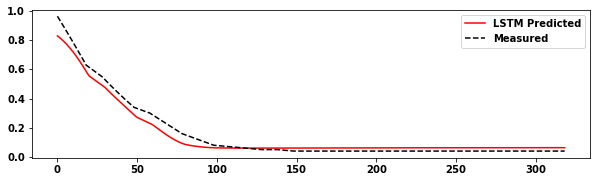

The R2 score of the Training set is :	0.9240
The R2 score of the Testing set is :	0.9661
3 2 10 0.9239561753955954
3 2 10 0.9661452746757802


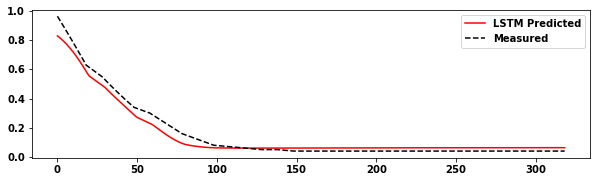

The R2 score of the Training set of  predicted values to predict is :	0.9240
The R2 score of the Testing set predicted values to predict is :	0.9486
Epoch 1/500
89/89 [==============================] - 2s 22ms/step - loss: 0.4709 - accuracy: 0.0000e+00 - val_loss: 0.0567 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 6ms/step - loss: 0.1362 - accuracy: 0.0000e+00 - val_loss: 0.0448 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0964 - accuracy: 0.0000e+00 - val_loss: 0.0317 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0775 - accuracy: 0.0000e+00 - val_loss: 0.0268 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0626 - accuracy: 0.0000e+00 - val_loss: 0.0237 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0554 - accuracy: 0.0000e+00 - 

Epoch 00054: early stopping
Runtime: 37.44 s


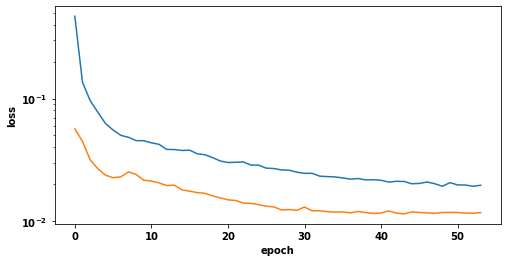

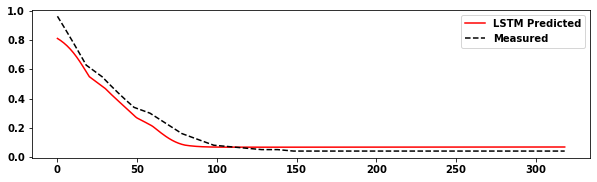

The R2 score of the Training set is :	0.9213
The R2 score of the Testing set is :	0.9571
4 2 10 0.9213247577807506
4 2 10 0.9571052124793872


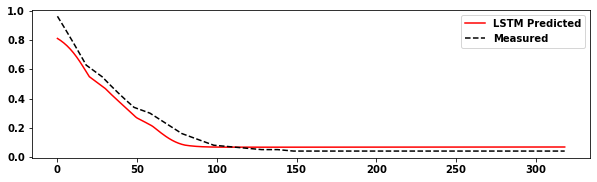

The R2 score of the Training set of  predicted values to predict is :	0.9213
The R2 score of the Testing set predicted values to predict is :	0.9337
Epoch 1/500
89/89 [==============================] - 2s 27ms/step - loss: 0.4385 - accuracy: 0.0000e+00 - val_loss: 0.0651 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 7ms/step - loss: 0.1405 - accuracy: 0.0000e+00 - val_loss: 0.0626 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 7ms/step - loss: 0.1010 - accuracy: 0.0000e+00 - val_loss: 0.0369 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0813 - accuracy: 0.0000e+00 - val_loss: 0.0304 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0628 - accuracy: 0.0000e+00 - val_loss: 0.0250 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0553 - accuracy: 0.0000e+00 - 

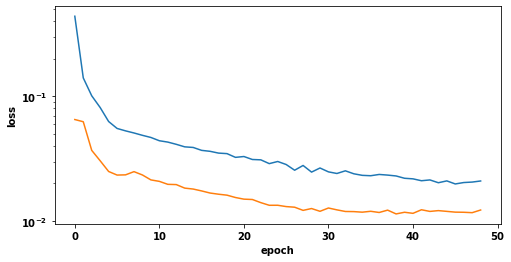

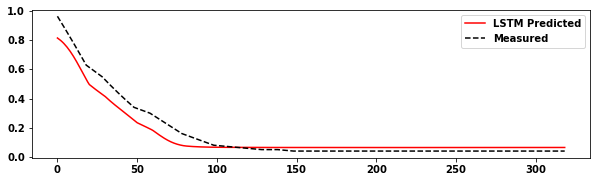

The R2 score of the Training set is :	0.9172
The R2 score of the Testing set is :	0.9298
5 2 10 0.9172038369540612
5 2 10 0.9297640014078787


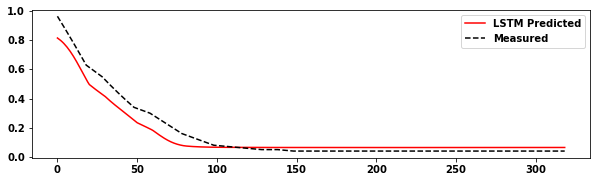

The R2 score of the Training set of  predicted values to predict is :	0.9172
The R2 score of the Testing set predicted values to predict is :	0.8677
Epoch 1/500
89/89 [==============================] - 1s 14ms/step - loss: 0.3394 - accuracy: 0.0000e+00 - val_loss: 0.0584 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0646 - accuracy: 0.0000e+00 - val_loss: 0.0267 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0429 - accuracy: 0.0000e+00 - val_loss: 0.0196 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0350 - accuracy: 0.0000e+00 - val_loss: 0.0220 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0340 - accuracy: 0.0000e+00 - val_loss: 0.0188 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0319 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0154 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0151 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0161 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0157 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0155 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0156 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 61/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0152 - accuracy: 0.0000e

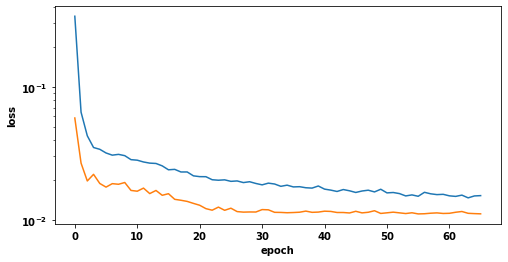

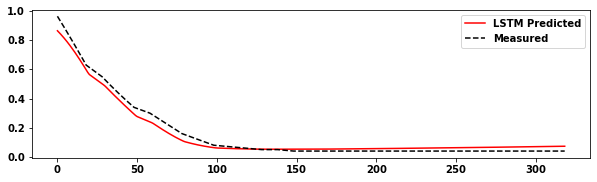

The R2 score of the Training set is :	0.9280
The R2 score of the Testing set is :	0.9769
2 2 20 0.9279914426392057
2 2 20 0.9768768101888985


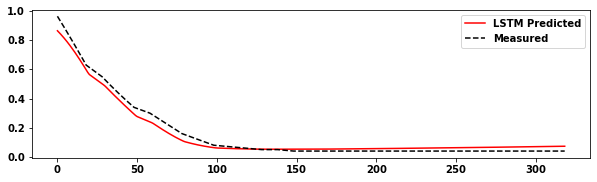

The R2 score of the Training set of  predicted values to predict is :	0.9280
The R2 score of the Testing set predicted values to predict is :	0.9416
Epoch 1/500
89/89 [==============================] - 2s 19ms/step - loss: 0.3599 - accuracy: 0.0000e+00 - val_loss: 0.0539 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0802 - accuracy: 0.0000e+00 - val_loss: 0.0292 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0481 - accuracy: 0.0000e+00 - val_loss: 0.0204 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0384 - accuracy: 0.0000e+00 - val_loss: 0.0205 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0351 - accuracy: 0.0000e+00 - val_loss: 0.0214 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0354 - accuracy: 0.0000e+00 - 

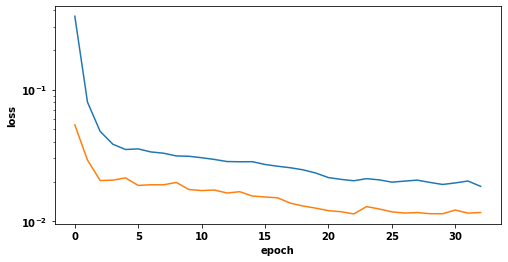

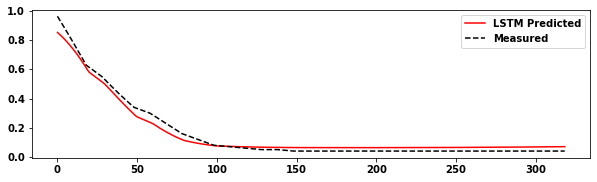

The R2 score of the Training set is :	0.9234
The R2 score of the Testing set is :	0.9767
3 2 20 0.9234332680483933
3 2 20 0.9766924422816085


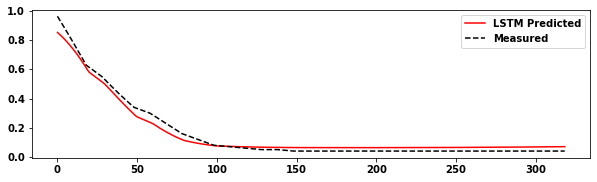

The R2 score of the Training set of  predicted values to predict is :	0.9234
The R2 score of the Testing set predicted values to predict is :	0.9565
Epoch 1/500
89/89 [==============================] - 2s 24ms/step - loss: 0.3838 - accuracy: 0.0000e+00 - val_loss: 0.0588 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0891 - accuracy: 0.0000e+00 - val_loss: 0.0323 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0528 - accuracy: 0.0000e+00 - val_loss: 0.0224 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0410 - accuracy: 0.0000e+00 - val_loss: 0.0226 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0370 - accuracy: 0.0000e+00 - val_loss: 0.0214 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0368 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0158 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0157 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0159 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0164 - accuracy: 0.0000e+00 - val_loss: 0.0116 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0160 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0153 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 61/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0159 - accuracy: 0.0000e

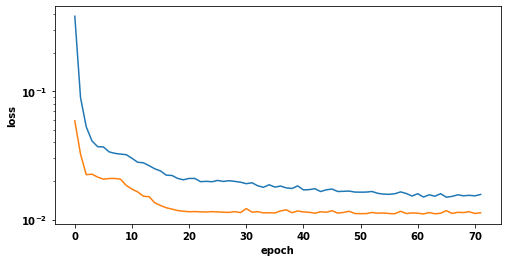

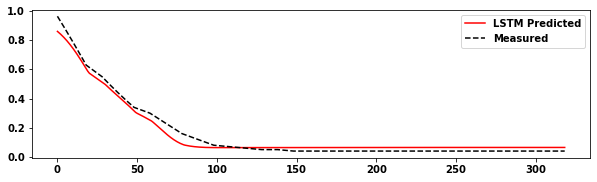

The R2 score of the Training set is :	0.9259
The R2 score of the Testing set is :	0.9754
4 2 20 0.9259250205909892
4 2 20 0.9753925301411042


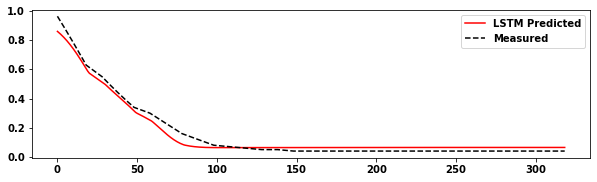

The R2 score of the Training set of  predicted values to predict is :	0.9259
The R2 score of the Testing set predicted values to predict is :	0.9304
Epoch 1/500
89/89 [==============================] - 2s 27ms/step - loss: 0.3769 - accuracy: 0.0000e+00 - val_loss: 0.0506 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0943 - accuracy: 0.0000e+00 - val_loss: 0.0295 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0550 - accuracy: 0.0000e+00 - val_loss: 0.0232 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0426 - accuracy: 0.0000e+00 - val_loss: 0.0238 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0399 - accuracy: 0.0000e+00 - val_loss: 0.0220 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0386 - accuracy: 0.0000e+00 - 

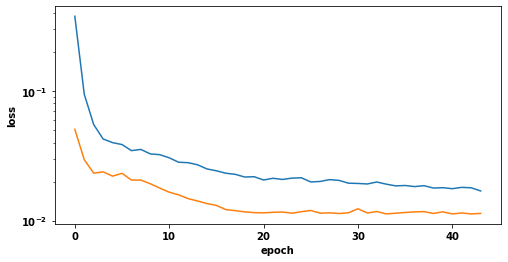

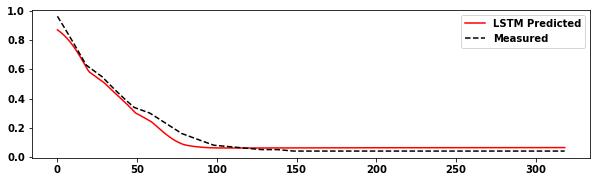

The R2 score of the Training set is :	0.9247
The R2 score of the Testing set is :	0.9779
5 2 20 0.9246549609465194
5 2 20 0.9779105601377428


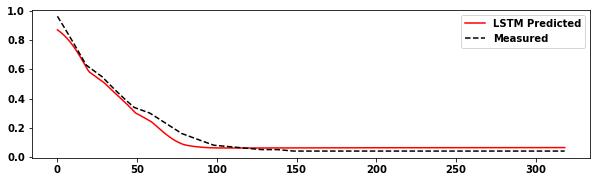

The R2 score of the Training set of  predicted values to predict is :	0.9247
The R2 score of the Testing set predicted values to predict is :	0.9585
Epoch 1/500
89/89 [==============================] - 1s 15ms/step - loss: 0.2820 - accuracy: 0.0000e+00 - val_loss: 0.0313 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0450 - accuracy: 0.0000e+00 - val_loss: 0.0203 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0328 - accuracy: 0.0000e+00 - val_loss: 0.0179 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0301 - accuracy: 0.0000e+00 - val_loss: 0.0186 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0300 - accuracy: 0.0000e+00 - val_loss: 0.0181 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 0s 4ms/step - loss: 0.0276 - accuracy: 0.0000e+00 - 

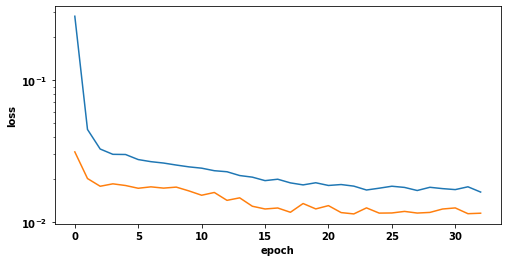

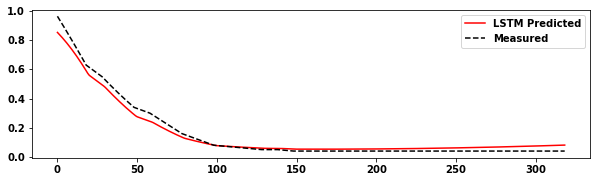

The R2 score of the Training set is :	0.9255
The R2 score of the Testing set is :	0.9768
2 2 30 0.9254616132731198
2 2 30 0.9767891975757804


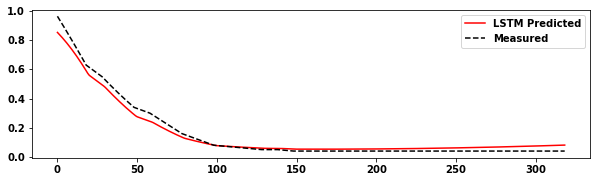

The R2 score of the Training set of  predicted values to predict is :	0.9255
The R2 score of the Testing set predicted values to predict is :	0.9543
Epoch 1/500
89/89 [==============================] - 2s 19ms/step - loss: 0.2949 - accuracy: 0.0000e+00 - val_loss: 0.0367 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0512 - accuracy: 0.0000e+00 - val_loss: 0.0224 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0346 - accuracy: 0.0000e+00 - val_loss: 0.0202 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0333 - accuracy: 0.0000e+00 - val_loss: 0.0198 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0320 - accuracy: 0.0000e+00 - val_loss: 0.0190 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0298 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 0s 6ms/step - loss: 0.0152 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0148 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0148 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0143 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0144 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 0s 6ms/step - loss: 0.0147 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 61/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0144 - accuracy: 0.0000e

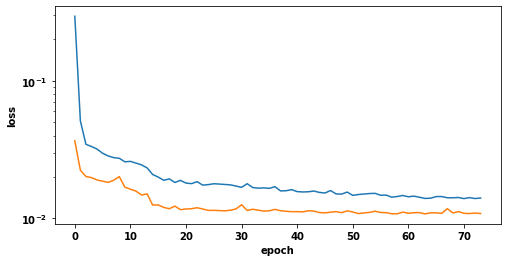

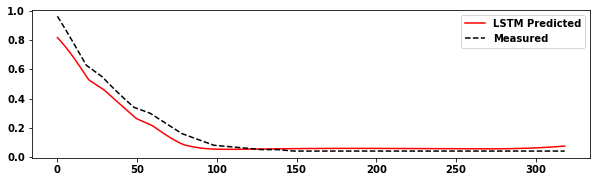

The R2 score of the Training set is :	0.9287
The R2 score of the Testing set is :	0.9537
3 2 30 0.9286577059810263
3 2 30 0.9537385571857163


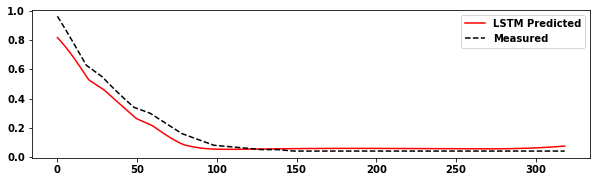

The R2 score of the Training set of  predicted values to predict is :	0.9287
The R2 score of the Testing set predicted values to predict is :	0.9092
Epoch 1/500
89/89 [==============================] - 2s 23ms/step - loss: 0.3005 - accuracy: 0.0000e+00 - val_loss: 0.0440 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0577 - accuracy: 0.0000e+00 - val_loss: 0.0229 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0362 - accuracy: 0.0000e+00 - val_loss: 0.0209 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0332 - accuracy: 0.0000e+00 - val_loss: 0.0200 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0332 - accuracy: 0.0000e+00 - val_loss: 0.0200 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0300 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0151 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 00055: early stopping
Runtime: 45.88 s


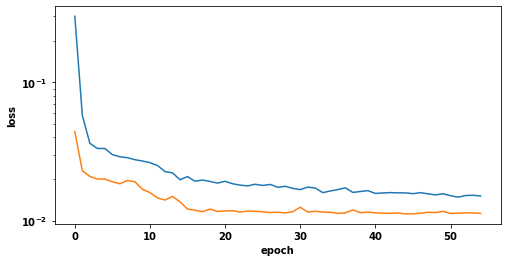

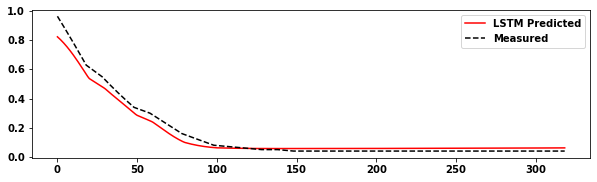

The R2 score of the Training set is :	0.9251
The R2 score of the Testing set is :	0.9692
4 2 30 0.9250582329167936
4 2 30 0.9691607280334524


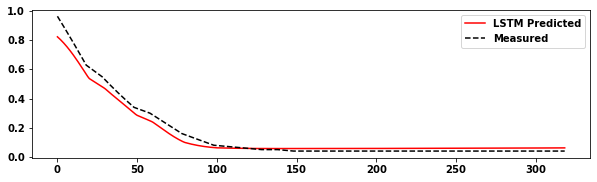

The R2 score of the Training set of  predicted values to predict is :	0.9251
The R2 score of the Testing set predicted values to predict is :	0.9274
Epoch 1/500
89/89 [==============================] - 2s 28ms/step - loss: 0.3188 - accuracy: 0.0000e+00 - val_loss: 0.0537 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0709 - accuracy: 0.0000e+00 - val_loss: 0.0257 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0412 - accuracy: 0.0000e+00 - val_loss: 0.0233 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0363 - accuracy: 0.0000e+00 - val_loss: 0.0220 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0350 - accuracy: 0.0000e+00 - val_loss: 0.0215 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0331 - accuracy: 0.0000e+00 - 

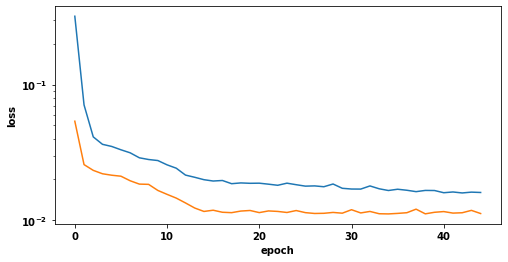

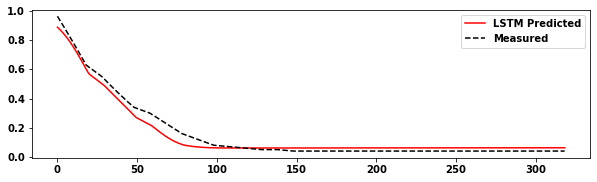

The R2 score of the Training set is :	0.9249
The R2 score of the Testing set is :	0.9702
5 2 30 0.9248512663230118
5 2 30 0.9702461293098443


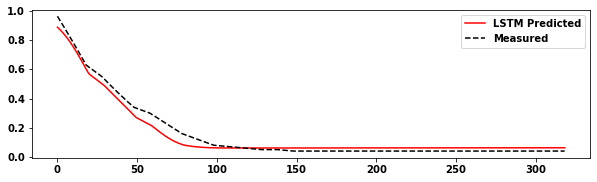

The R2 score of the Training set of  predicted values to predict is :	0.9249
The R2 score of the Testing set predicted values to predict is :	0.9338
Epoch 1/500
89/89 [==============================] - 1s 15ms/step - loss: 0.2257 - accuracy: 0.0000e+00 - val_loss: 0.0277 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0379 - accuracy: 0.0000e+00 - val_loss: 0.0205 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0279 - accuracy: 0.0000e+00 - val_loss: 0.0194 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 0.0000e+00 - val_loss: 0.0172 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0265 - accuracy: 0.0000e+00 - val_loss: 0.0187 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0256 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0143 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0144 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 00057: early stopping
Runtime: 29.41 s


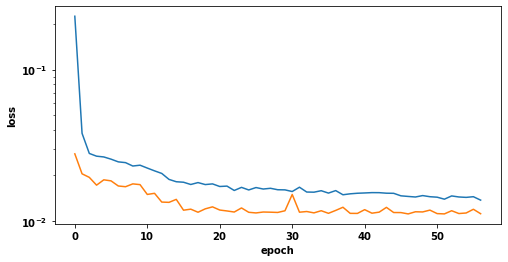

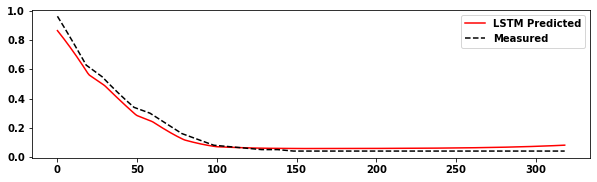

The R2 score of the Training set is :	0.9280
The R2 score of the Testing set is :	0.9782
2 2 40 0.9280341572514864
2 2 40 0.9782405758571414


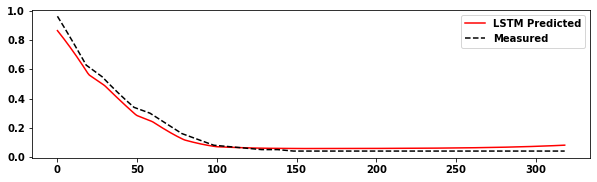

The R2 score of the Training set of  predicted values to predict is :	0.9280
The R2 score of the Testing set predicted values to predict is :	0.9569
Epoch 1/500
89/89 [==============================] - 2s 23ms/step - loss: 0.2487 - accuracy: 0.0000e+00 - val_loss: 0.0333 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0408 - accuracy: 0.0000e+00 - val_loss: 0.0207 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0308 - accuracy: 0.0000e+00 - val_loss: 0.0186 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0283 - accuracy: 0.0000e+00 - val_loss: 0.0186 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0278 - accuracy: 0.0000e+00 - val_loss: 0.0206 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0271 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0140 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0147 - accuracy: 0.0000e+00 - val_loss: 0.0123 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0143 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0143 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0146 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0142 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 61/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0137 - accuracy: 0.0000e

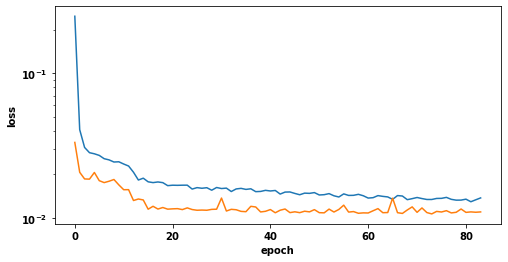

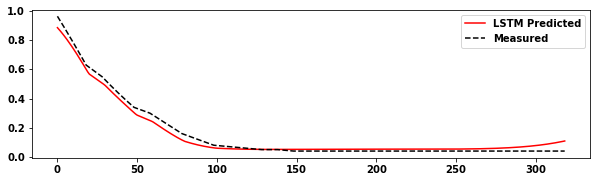

The R2 score of the Training set is :	0.9311
The R2 score of the Testing set is :	0.9807
3 2 40 0.9310524887884821
3 2 40 0.980700771227447


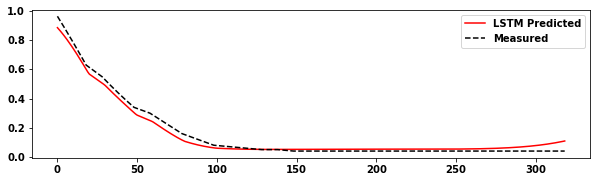

The R2 score of the Training set of  predicted values to predict is :	0.9311
The R2 score of the Testing set predicted values to predict is :	0.9333
Epoch 1/500
89/89 [==============================] - 7s 84ms/step - loss: 0.2604 - accuracy: 0.0000e+00 - val_loss: 0.0355 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0395 - accuracy: 0.0000e+00 - val_loss: 0.0221 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0298 - accuracy: 0.0000e+00 - val_loss: 0.0201 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0298 - accuracy: 0.0000e+00 - val_loss: 0.0194 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0292 - accuracy: 0.0000e+00 - val_loss: 0.0190 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0274 - accuracy: 0.0000e+

89/89 [==============================] - 1s 8ms/step - loss: 0.0148 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0147 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0139 - accuracy: 0.0000e+00 - val_loss: 0.0122 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0150 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0145 - accuracy: 0.0000e+00 - val_loss: 0.0109 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0141 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0143 - accuracy: 0.0000e+00 - val_los

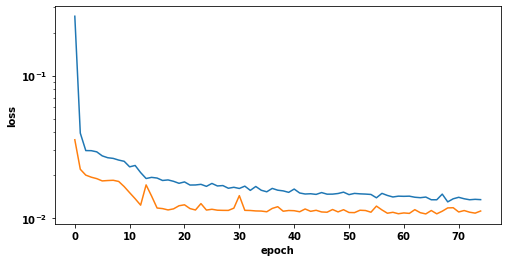

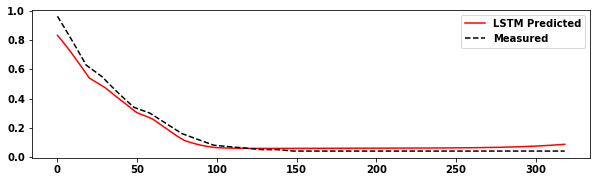

The R2 score of the Training set is :	0.9283
The R2 score of the Testing set is :	0.9722
4 2 40 0.9282593696905921
4 2 40 0.9721968618874469


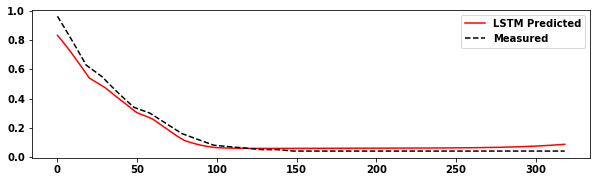

The R2 score of the Training set of  predicted values to predict is :	0.9283
The R2 score of the Testing set predicted values to predict is :	0.9246
Epoch 1/500
89/89 [==============================] - 3s 30ms/step - loss: 0.2749 - accuracy: 0.0000e+00 - val_loss: 0.0371 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0477 - accuracy: 0.0000e+00 - val_loss: 0.0225 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0337 - accuracy: 0.0000e+00 - val_loss: 0.0215 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0310 - accuracy: 0.0000e+00 - val_loss: 0.0210 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0300 - accuracy: 0.0000e+00 - val_loss: 0.0201 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0291 - accuracy: 0.0000e+00 - 

89/89 [==============================] - 1s 14ms/step - loss: 0.0145 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0151 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0153 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0142 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0151 - accuracy: 0.0000e+00 - val_loss: 0.0120 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0144 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0146 - accuracy: 0.0000e+00 - 

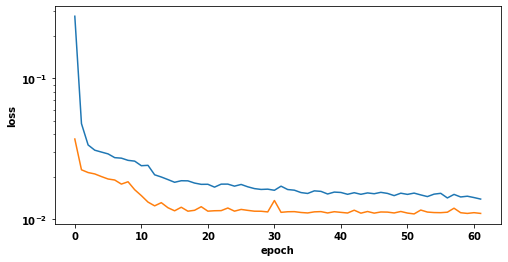

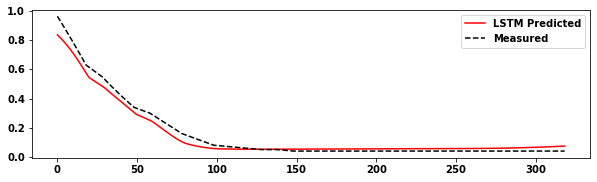

The R2 score of the Training set is :	0.9280
The R2 score of the Testing set is :	0.9721
5 2 40 0.9279565571205588
5 2 40 0.9720711644579386


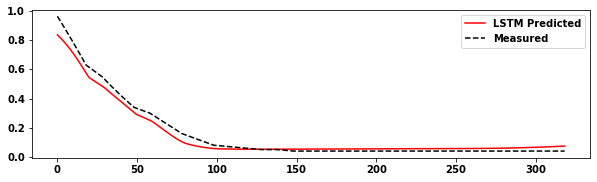

The R2 score of the Training set of  predicted values to predict is :	0.9280
The R2 score of the Testing set predicted values to predict is :	0.9254
Epoch 1/500
89/89 [==============================] - 4s 46ms/step - loss: 0.2126 - accuracy: 0.0000e+00 - val_loss: 0.0268 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0309 - accuracy: 0.0000e+00 - val_loss: 0.0188 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0265 - accuracy: 0.0000e+00 - val_loss: 0.0195 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0255 - accuracy: 0.0000e+00 - val_loss: 0.0171 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0238 - accuracy: 0.0000e+00 - val_loss: 0.0191 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0236 - accuracy: 0.0000e+00 - 

89/89 [==============================] - 1s 9ms/step - loss: 0.0141 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0142 - accuracy: 0.0000e+00 - val_loss: 0.0118 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0116 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0116 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 00059: early stopping
Runtime: 62.79 s


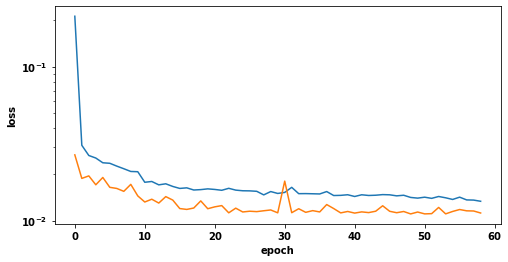

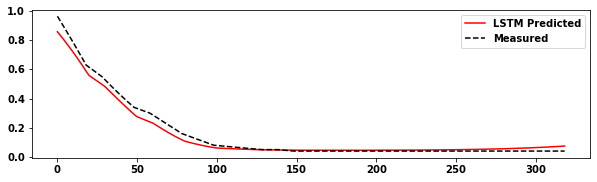

The R2 score of the Training set is :	0.9277
The R2 score of the Testing set is :	0.9781
2 2 50 0.9277024661036841
2 2 50 0.9781269142384715


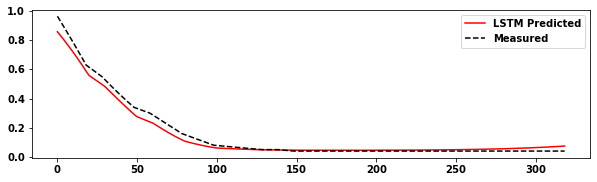

The R2 score of the Training set of  predicted values to predict is :	0.9277
The R2 score of the Testing set predicted values to predict is :	0.9467
Epoch 1/500
89/89 [==============================] - 4s 43ms/step - loss: 0.2364 - accuracy: 0.0000e+00 - val_loss: 0.0329 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0368 - accuracy: 0.0000e+00 - val_loss: 0.0209 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0291 - accuracy: 0.0000e+00 - val_loss: 0.0202 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0271 - accuracy: 0.0000e+00 - val_loss: 0.0182 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0272 - accuracy: 0.0000e+00 - val_loss: 0.0206 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0260 - accuracy: 0.0000e+

89/89 [==============================] - 1s 11ms/step - loss: 0.0145 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0143 - accuracy: 0.0000e+00 - val_loss: 0.0109 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0141 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0138 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0141 - accuracy: 0.0000e+00 - 

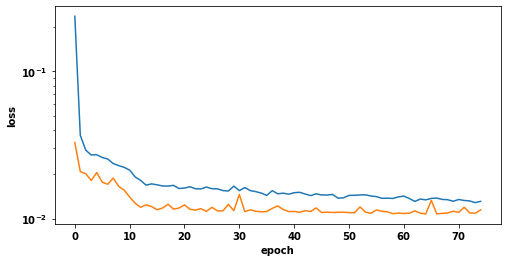

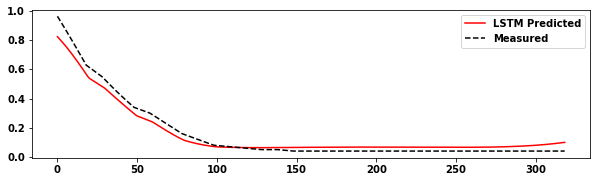

The R2 score of the Training set is :	0.9265
The R2 score of the Testing set is :	0.9631
3 2 50 0.9264553827141961
3 2 50 0.963087978016796


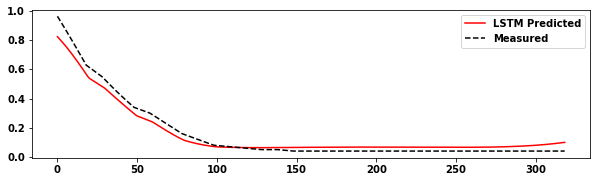

The R2 score of the Training set of  predicted values to predict is :	0.9265
The R2 score of the Testing set predicted values to predict is :	0.9286
Epoch 1/500
89/89 [==============================] - 5s 53ms/step - loss: 0.2499 - accuracy: 0.0000e+00 - val_loss: 0.0330 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0367 - accuracy: 0.0000e+00 - val_loss: 0.0213 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0307 - accuracy: 0.0000e+00 - val_loss: 0.0199 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0286 - accuracy: 0.0000e+00 - val_loss: 0.0192 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0275 - accuracy: 0.0000e+00 - val_loss: 0.0210 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0263 - accuracy: 0.0000e+

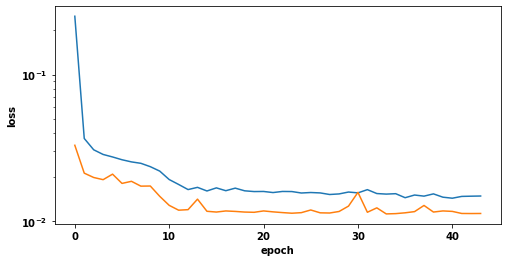

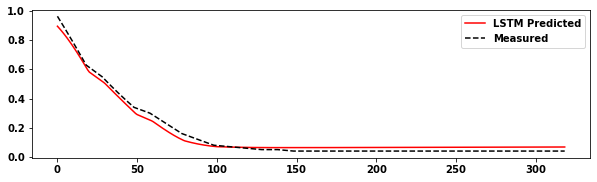

The R2 score of the Training set is :	0.9263
The R2 score of the Testing set is :	0.9828
4 2 50 0.9262788280552313
4 2 50 0.9828159280243779


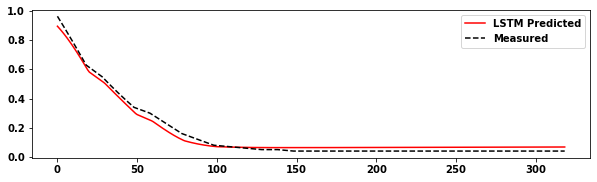

The R2 score of the Training set of  predicted values to predict is :	0.9263
The R2 score of the Testing set predicted values to predict is :	0.9483
Epoch 1/500
89/89 [==============================] - 6s 64ms/step - loss: 0.2469 - accuracy: 0.0000e+00 - val_loss: 0.0319 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0344 - accuracy: 0.0000e+00 - val_loss: 0.0224 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0328 - accuracy: 0.0000e+00 - val_loss: 0.0214 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0295 - accuracy: 0.0000e+00 - val_loss: 0.0209 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0292 - accuracy: 0.0000e+00 - val_loss: 0.0233 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0276 - accuracy: 0.0000e+

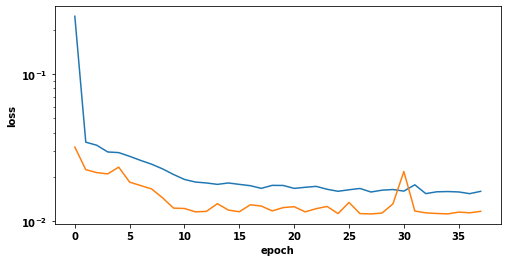

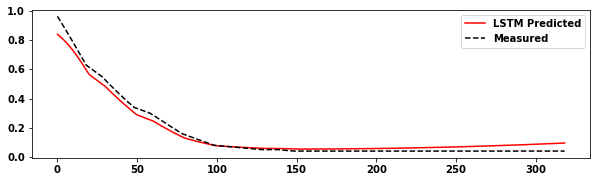

The R2 score of the Training set is :	0.9258
The R2 score of the Testing set is :	0.9755
5 2 50 0.9257537225663207
5 2 50 0.9754525738274619


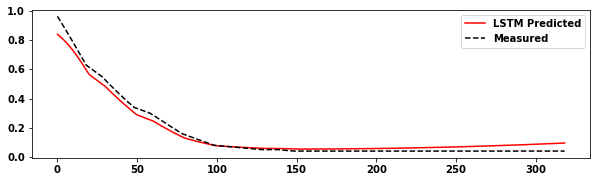

The R2 score of the Training set of  predicted values to predict is :	0.9258
The R2 score of the Testing set predicted values to predict is :	0.9456
Epoch 1/500
89/89 [==============================] - 4s 41ms/step - loss: 0.1978 - accuracy: 0.0000e+00 - val_loss: 0.0259 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0287 - accuracy: 0.0000e+00 - val_loss: 0.0192 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0254 - accuracy: 0.0000e+00 - val_loss: 0.0187 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0237 - accuracy: 0.0000e+00 - val_loss: 0.0172 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0242 - accuracy: 0.0000e+00 - val_loss: 0.0199 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0226 - accuracy: 0.0000e+

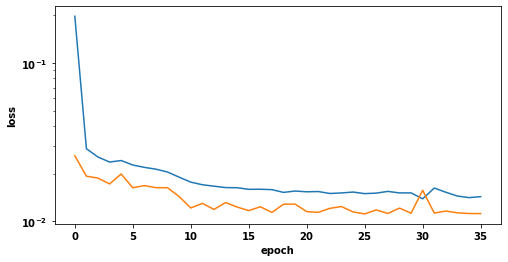

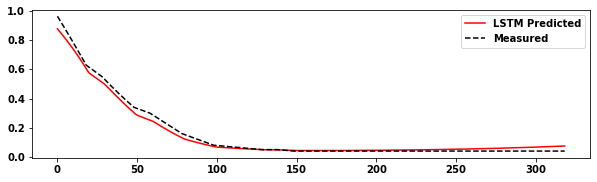

The R2 score of the Training set is :	0.9273
The R2 score of the Testing set is :	0.9866
2 2 60 0.9273113106385287
2 2 60 0.9865687496988543


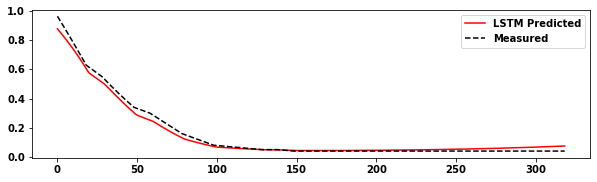

The R2 score of the Training set of  predicted values to predict is :	0.9273
The R2 score of the Testing set predicted values to predict is :	0.9708
Epoch 1/500
89/89 [==============================] - 4s 47ms/step - loss: 0.2142 - accuracy: 0.0000e+00 - val_loss: 0.0308 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0336 - accuracy: 0.0000e+00 - val_loss: 0.0213 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0273 - accuracy: 0.0000e+00 - val_loss: 0.0199 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0258 - accuracy: 0.0000e+00 - val_loss: 0.0181 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0258 - accuracy: 0.0000e+00 - val_loss: 0.0196 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0235 - accuracy: 0.0000e+

89/89 [==============================] - 1s 16ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0142 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0133 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0140 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - 

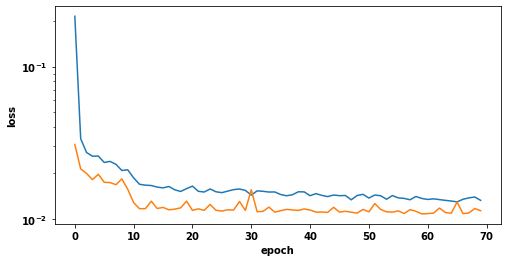

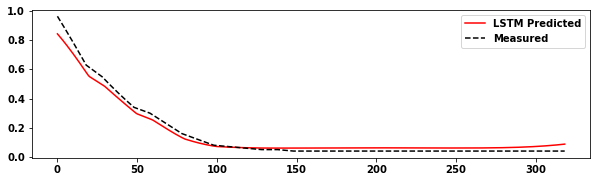

The R2 score of the Training set is :	0.9272
The R2 score of the Testing set is :	0.9760
3 2 60 0.9272419412800182
3 2 60 0.9760274442683301


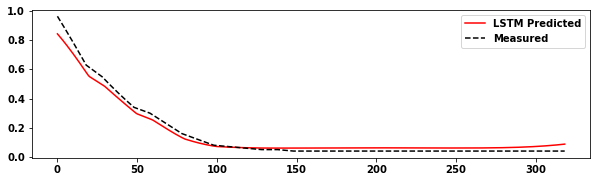

The R2 score of the Training set of  predicted values to predict is :	0.9272
The R2 score of the Testing set predicted values to predict is :	0.9409
Epoch 1/500
89/89 [==============================] - 7s 73ms/step - loss: 0.2303 - accuracy: 0.0000e+00 - val_loss: 0.0306 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0351 - accuracy: 0.0000e+00 - val_loss: 0.0231 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0294 - accuracy: 0.0000e+00 - val_loss: 0.0196 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0272 - accuracy: 0.0000e+00 - val_loss: 0.0189 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0270 - accuracy: 0.0000e+00 - val_loss: 0.0194 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0253 - accuracy: 0.0000e+

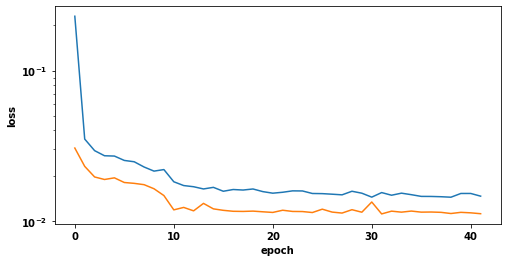

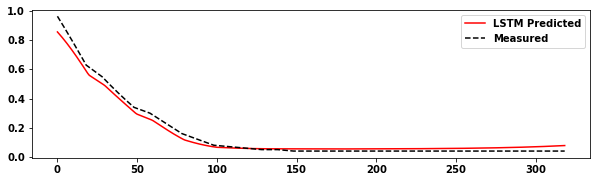

The R2 score of the Training set is :	0.9279
The R2 score of the Testing set is :	0.9807
4 2 60 0.92790737399289
4 2 60 0.9806660782991341


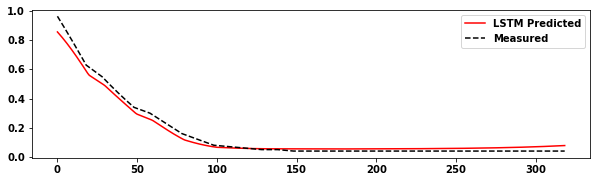

The R2 score of the Training set of  predicted values to predict is :	0.9279
The R2 score of the Testing set predicted values to predict is :	0.9479
Epoch 1/500
89/89 [==============================] - 8s 89ms/step - loss: 0.2281 - accuracy: 0.0000e+00 - val_loss: 0.0273 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0318 - accuracy: 0.0000e+00 - val_loss: 0.0236 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0308 - accuracy: 0.0000e+00 - val_loss: 0.0209 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0281 - accuracy: 0.0000e+00 - val_loss: 0.0202 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0261 - accuracy: 0.0000e+00 - val_loss: 0.0198 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0259 - accuracy: 0.0000e+

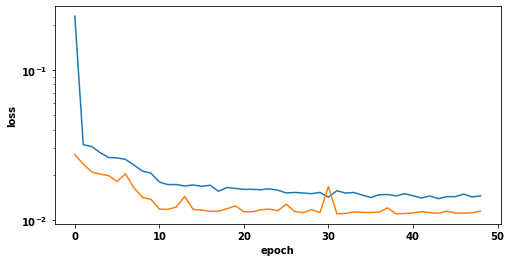

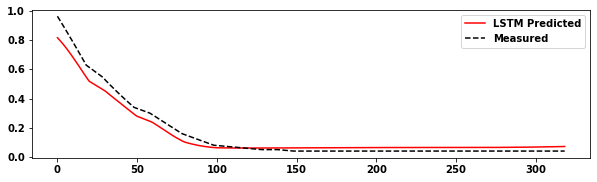

The R2 score of the Training set is :	0.9259
The R2 score of the Testing set is :	0.9582
5 2 60 0.925869011150568
5 2 60 0.9581939411687832


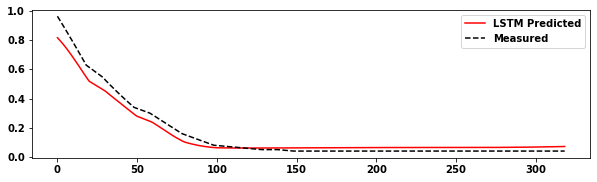

The R2 score of the Training set of  predicted values to predict is :	0.9259
The R2 score of the Testing set predicted values to predict is :	0.9024
Epoch 1/500
89/89 [==============================] - 3s 35ms/step - loss: 0.1749 - accuracy: 0.0000e+00 - val_loss: 0.0252 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0266 - accuracy: 0.0000e+00 - val_loss: 0.0187 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0243 - accuracy: 0.0000e+00 - val_loss: 0.0177 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0231 - accuracy: 0.0000e+00 - val_loss: 0.0168 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0218 - accuracy: 0.0000e+00 - val_loss: 0.0190 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0214 - accuracy: 0.0000e+

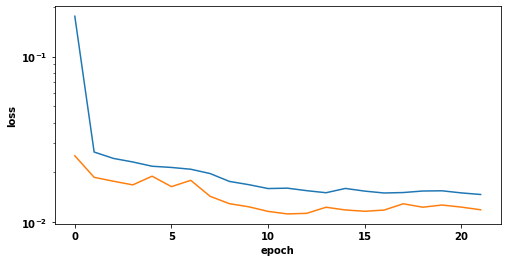

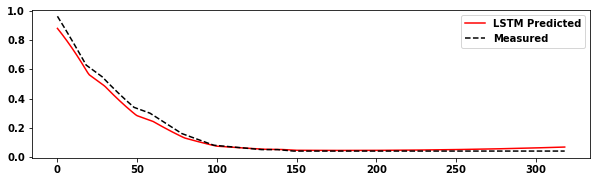

The R2 score of the Training set is :	0.9259
The R2 score of the Testing set is :	0.9860
2 2 70 0.9258515078968285
2 2 70 0.9859864900119761


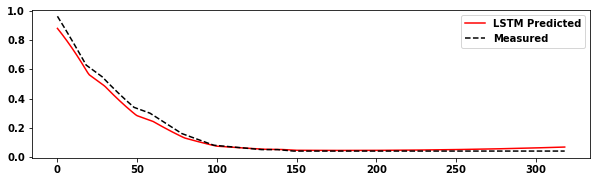

The R2 score of the Training set of  predicted values to predict is :	0.9259
The R2 score of the Testing set predicted values to predict is :	0.9727
Epoch 1/500
89/89 [==============================] - 5s 54ms/step - loss: 0.1959 - accuracy: 0.0000e+00 - val_loss: 0.0289 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0286 - accuracy: 0.0000e+00 - val_loss: 0.0208 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0262 - accuracy: 0.0000e+00 - val_loss: 0.0205 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0252 - accuracy: 0.0000e+00 - val_loss: 0.0183 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0244 - accuracy: 0.0000e+00 - val_loss: 0.0189 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0236 - accuracy: 0.0000e+

89/89 [==============================] - 2s 27ms/step - loss: 0.0142 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0142 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0140 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0109 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0132 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - 

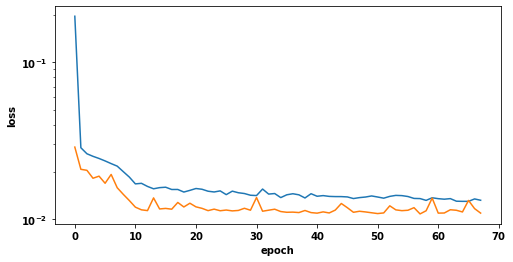

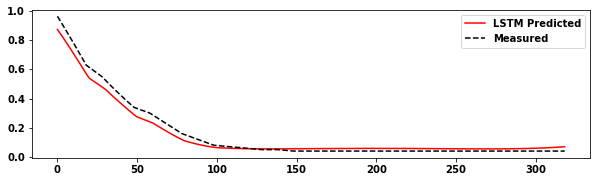

The R2 score of the Training set is :	0.9292
The R2 score of the Testing set is :	0.9740
3 2 70 0.9292058285853994
3 2 70 0.973957649811309


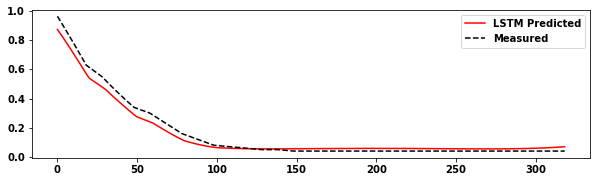

The R2 score of the Training set of  predicted values to predict is :	0.9292
The R2 score of the Testing set predicted values to predict is :	0.9258
Epoch 1/500
89/89 [==============================] - 8s 87ms/step - loss: 0.2066 - accuracy: 0.0000e+00 - val_loss: 0.0276 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0302 - accuracy: 0.0000e+00 - val_loss: 0.0204 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0276 - accuracy: 0.0000e+00 - val_loss: 0.0197 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0257 - accuracy: 0.0000e+00 - val_loss: 0.0188 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0254 - accuracy: 0.0000e+00 - val_loss: 0.0204 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0250 - accuracy: 0.0000e+

89/89 [==============================] - 3s 32ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0133 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0138 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 3s 28ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0109 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - 

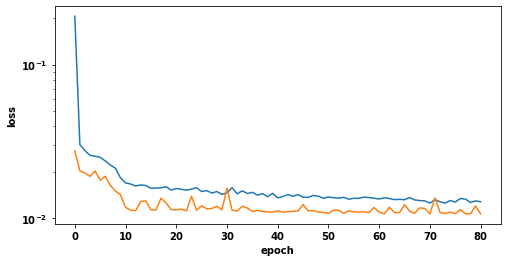

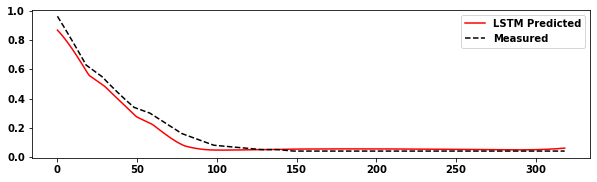

The R2 score of the Training set is :	0.9271
The R2 score of the Testing set is :	0.9719
4 2 70 0.9271167944814687
4 2 70 0.9719439111292044


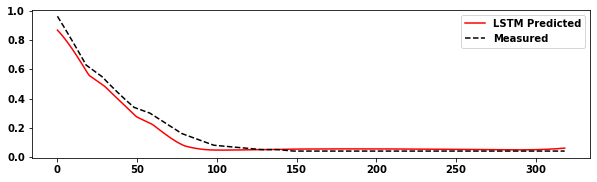

The R2 score of the Training set of  predicted values to predict is :	0.9271
The R2 score of the Testing set predicted values to predict is :	0.9219
Epoch 1/500
89/89 [==============================] - 7s 82ms/step - loss: 0.2248 - accuracy: 0.0000e+00 - val_loss: 0.0273 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 32ms/step - loss: 0.0312 - accuracy: 0.0000e+00 - val_loss: 0.0218 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 35ms/step - loss: 0.0289 - accuracy: 0.0000e+00 - val_loss: 0.0206 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 35ms/step - loss: 0.0274 - accuracy: 0.0000e+00 - val_loss: 0.0197 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 35ms/step - loss: 0.0256 - accuracy: 0.0000e+00 - val_loss: 0.0193 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 39ms/step - loss: 0.0255 - accuracy: 0.0000e+

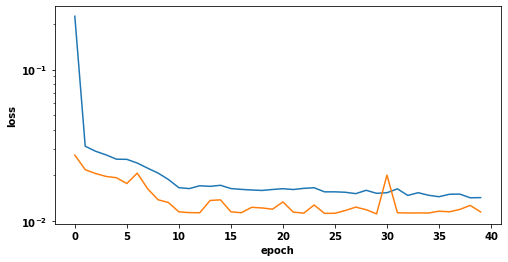

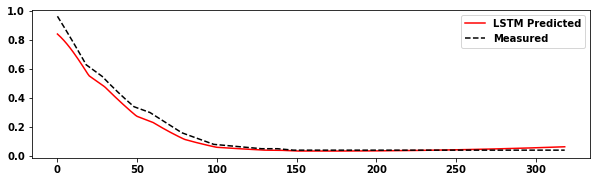

The R2 score of the Training set is :	0.9250
The R2 score of the Testing set is :	0.9776
5 2 70 0.9249927111983177
5 2 70 0.9776091913937187


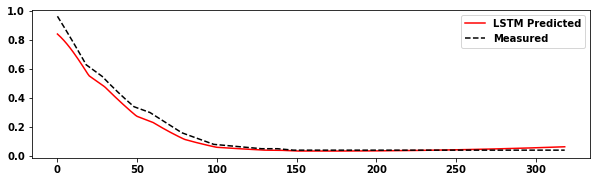

The R2 score of the Training set of  predicted values to predict is :	0.9250
The R2 score of the Testing set predicted values to predict is :	0.9537
Epoch 1/500
89/89 [==============================] - 2s 20ms/step - loss: 0.1602 - accuracy: 0.0000e+00 - val_loss: 0.0213 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0243 - accuracy: 0.0000e+00 - val_loss: 0.0179 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0242 - accuracy: 0.0000e+00 - val_loss: 0.0177 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0220 - accuracy: 0.0000e+00 - val_loss: 0.0175 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0220 - accuracy: 0.0000e+00 - val_loss: 0.0172 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0222 - accuracy: 0.0000e+00 - 

89/89 [==============================] - 1s 10ms/step - loss: 0.0133 - accuracy: 0.0000e+00 - val_loss: 0.0116 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0118 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0133 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0133 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0131 - accuracy: 0.0000e+00 - v

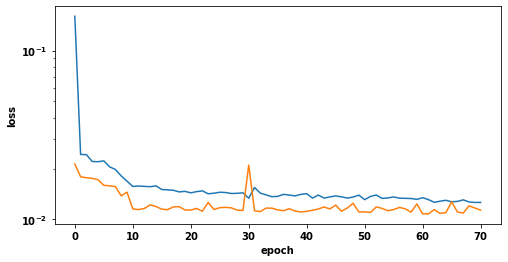

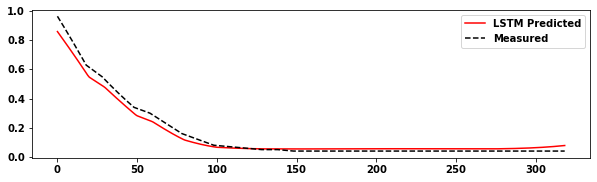

The R2 score of the Training set is :	0.9297
The R2 score of the Testing set is :	0.9765
2 2 80 0.9296654321309837
2 2 80 0.9765081189094431


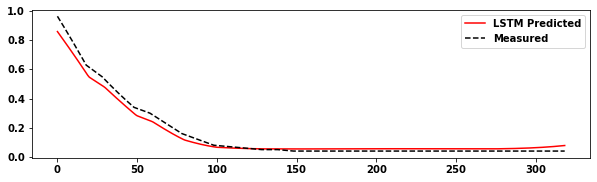

The R2 score of the Training set of  predicted values to predict is :	0.9297
The R2 score of the Testing set predicted values to predict is :	0.9363
Epoch 1/500
89/89 [==============================] - 3s 30ms/step - loss: 0.1866 - accuracy: 0.0000e+00 - val_loss: 0.0239 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0268 - accuracy: 0.0000e+00 - val_loss: 0.0215 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0257 - accuracy: 0.0000e+00 - val_loss: 0.0191 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0231 - accuracy: 0.0000e+00 - val_loss: 0.0178 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0236 - accuracy: 0.0000e+00 - val_loss: 0.0202 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0230 - accuracy: 0.0000e+

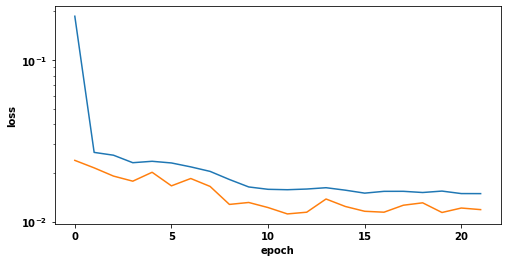

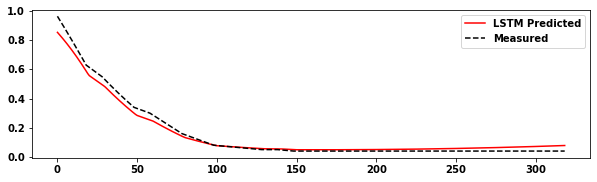

The R2 score of the Training set is :	0.9258
The R2 score of the Testing set is :	0.9805
3 2 80 0.925825179724902
3 2 80 0.9805009297786039


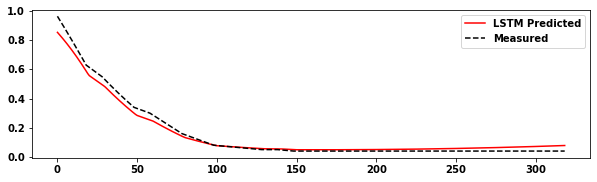

The R2 score of the Training set of  predicted values to predict is :	0.9258
The R2 score of the Testing set predicted values to predict is :	0.9663
Epoch 1/500
89/89 [==============================] - 4s 45ms/step - loss: 0.1967 - accuracy: 0.0000e+00 - val_loss: 0.0256 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0281 - accuracy: 0.0000e+00 - val_loss: 0.0206 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0274 - accuracy: 0.0000e+00 - val_loss: 0.0195 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0248 - accuracy: 0.0000e+00 - val_loss: 0.0184 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0238 - accuracy: 0.0000e+00 - val_loss: 0.0191 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0237 - accuracy: 0.0000e+

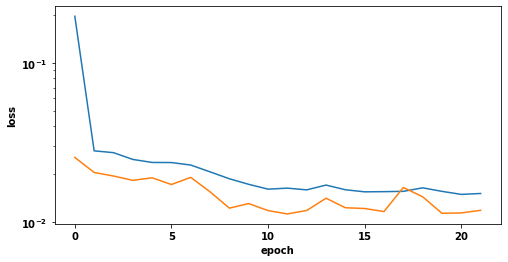

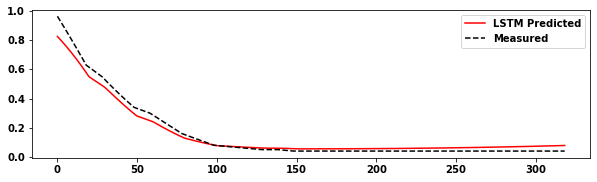

The R2 score of the Training set is :	0.9240
The R2 score of the Testing set is :	0.9721
4 2 80 0.9240162676762977
4 2 80 0.9720758527383252


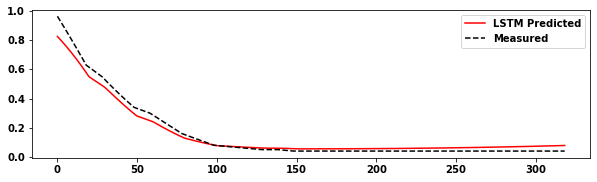

The R2 score of the Training set of  predicted values to predict is :	0.9240
The R2 score of the Testing set predicted values to predict is :	0.9564
Epoch 1/500
89/89 [==============================] - 4s 46ms/step - loss: 0.2109 - accuracy: 0.0000e+00 - val_loss: 0.0253 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0288 - accuracy: 0.0000e+00 - val_loss: 0.0215 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0280 - accuracy: 0.0000e+00 - val_loss: 0.0204 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0271 - accuracy: 0.0000e+00 - val_loss: 0.0196 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 28ms/step - loss: 0.0264 - accuracy: 0.0000e+00 - val_loss: 0.0204 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0250 - accuracy: 0.0000e+

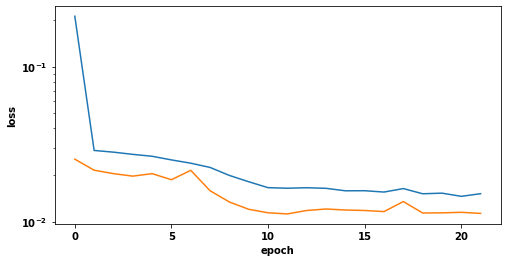

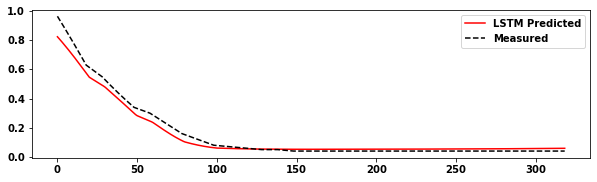

The R2 score of the Training set is :	0.9251
The R2 score of the Testing set is :	0.9720
5 2 80 0.92507861884586
5 2 80 0.9719655238816444


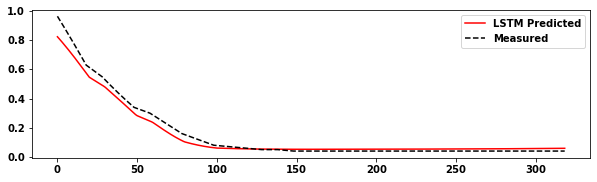

The R2 score of the Training set of  predicted values to predict is :	0.9251
The R2 score of the Testing set predicted values to predict is :	0.9522
Epoch 1/500
89/89 [==============================] - 4s 40ms/step - loss: 0.1643 - accuracy: 0.0000e+00 - val_loss: 0.0224 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0249 - accuracy: 0.0000e+00 - val_loss: 0.0190 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0240 - accuracy: 0.0000e+00 - val_loss: 0.0211 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0224 - accuracy: 0.0000e+00 - val_loss: 0.0168 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0215 - accuracy: 0.0000e+00 - val_loss: 0.0183 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0207 - accuracy: 0.0000e+

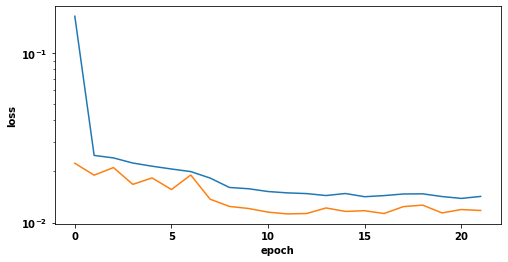

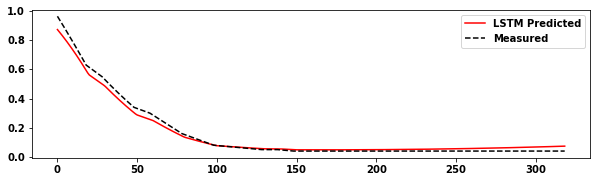

The R2 score of the Training set is :	0.9266
The R2 score of the Testing set is :	0.9848
2 2 90 0.9265598392257232
2 2 90 0.9848169001521893


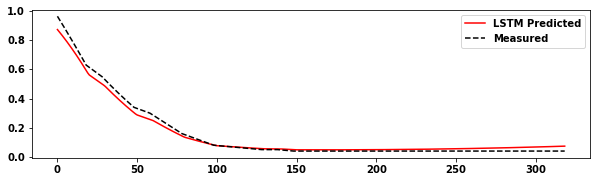

The R2 score of the Training set of  predicted values to predict is :	0.9266
The R2 score of the Testing set predicted values to predict is :	0.9738
Epoch 1/500
89/89 [==============================] - 5s 53ms/step - loss: 0.1780 - accuracy: 0.0000e+00 - val_loss: 0.0248 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0264 - accuracy: 0.0000e+00 - val_loss: 0.0210 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0258 - accuracy: 0.0000e+00 - val_loss: 0.0212 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0239 - accuracy: 0.0000e+00 - val_loss: 0.0177 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0238 - accuracy: 0.0000e+00 - val_loss: 0.0182 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0223 - accuracy: 0.0000e+

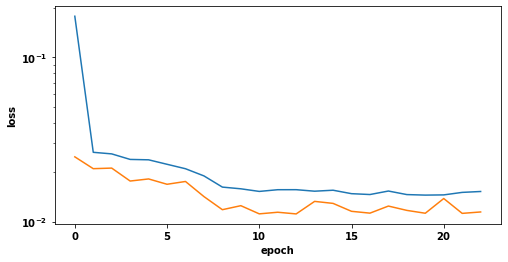

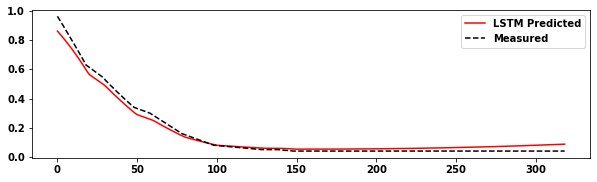

The R2 score of the Training set is :	0.9262
The R2 score of the Testing set is :	0.9806
3 2 90 0.9261869355452741
3 2 90 0.9806385268360598


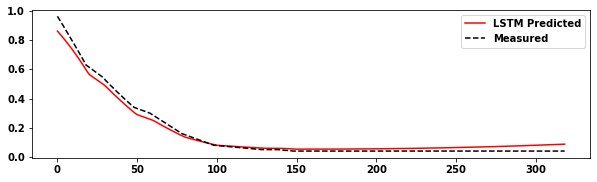

The R2 score of the Training set of  predicted values to predict is :	0.9262
The R2 score of the Testing set predicted values to predict is :	0.9630
Epoch 1/500
89/89 [==============================] - 6s 65ms/step - loss: 0.1928 - accuracy: 0.0000e+00 - val_loss: 0.0279 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0290 - accuracy: 0.0000e+00 - val_loss: 0.0212 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0269 - accuracy: 0.0000e+00 - val_loss: 0.0213 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0251 - accuracy: 0.0000e+00 - val_loss: 0.0184 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0247 - accuracy: 0.0000e+00 - val_loss: 0.0200 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0235 - accuracy: 0.0000e+

89/89 [==============================] - 2s 24ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0120 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0109 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - val_loss: 0.0120 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0139 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0107 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - 

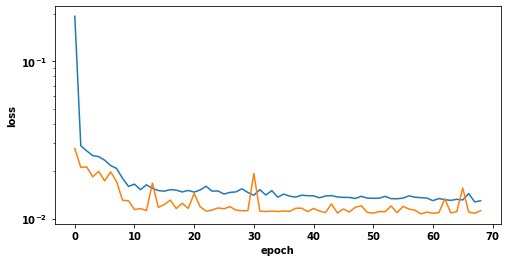

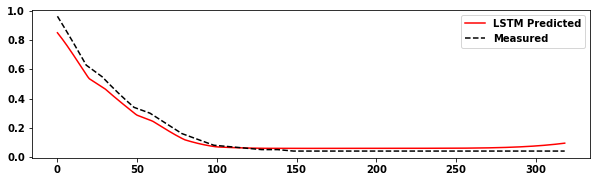

The R2 score of the Training set is :	0.9285
The R2 score of the Testing set is :	0.9711
4 2 90 0.9284885588190511
4 2 90 0.9711396139762811


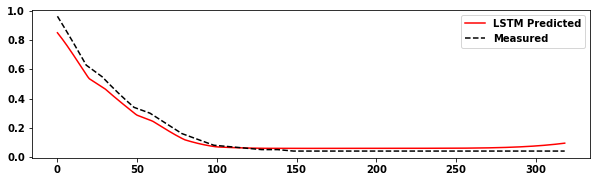

The R2 score of the Training set of  predicted values to predict is :	0.9285
The R2 score of the Testing set predicted values to predict is :	0.9215
Epoch 1/500
89/89 [==============================] - 6s 66ms/step - loss: 0.1986 - accuracy: 0.0000e+00 - val_loss: 0.0244 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 32ms/step - loss: 0.0293 - accuracy: 0.0000e+00 - val_loss: 0.0226 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0278 - accuracy: 0.0000e+00 - val_loss: 0.0202 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0256 - accuracy: 0.0000e+00 - val_loss: 0.0195 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0261 - accuracy: 0.0000e+00 - val_loss: 0.0208 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0242 - accuracy: 0.0000e+

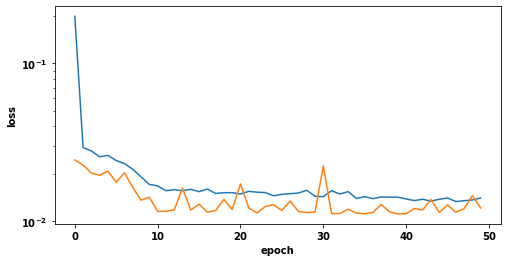

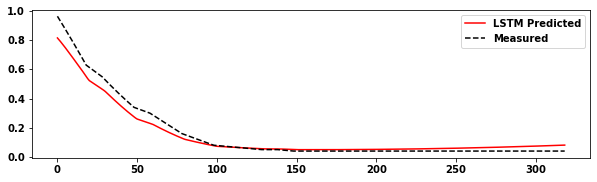

The R2 score of the Training set is :	0.9243
The R2 score of the Testing set is :	0.9580
5 2 90 0.9243272009811526
5 2 90 0.9579839690500545


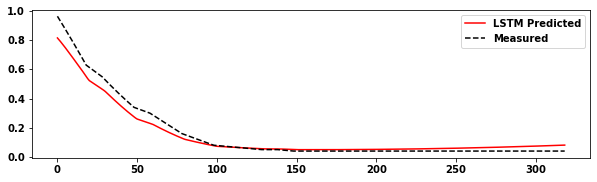

The R2 score of the Training set of  predicted values to predict is :	0.9243
The R2 score of the Testing set predicted values to predict is :	0.9010
Epoch 1/500
89/89 [==============================] - 1s 16ms/step - loss: 0.3139 - accuracy: 0.0000e+00 - val_loss: 0.0751 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 0s 6ms/step - loss: 0.0873 - accuracy: 0.0000e+00 - val_loss: 0.0318 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0643 - accuracy: 0.0000e+00 - val_loss: 0.0287 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0565 - accuracy: 0.0000e+00 - val_loss: 0.0284 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0519 - accuracy: 0.0000e+00 - val_loss: 0.0282 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 0s 5ms/step - loss: 0.0484 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 0s 6ms/step - loss: 0.0166 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0175 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 0s 6ms/step - loss: 0.0169 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0172 - accuracy: 0.0000e+00 - val_loss: 0.0117 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0177 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 61/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0170 - accuracy: 0.0000e

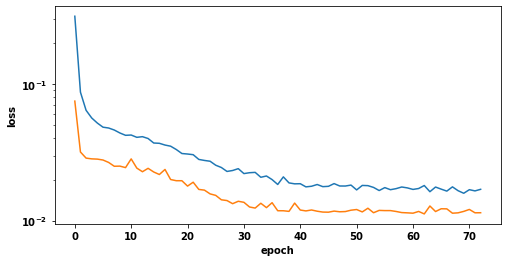

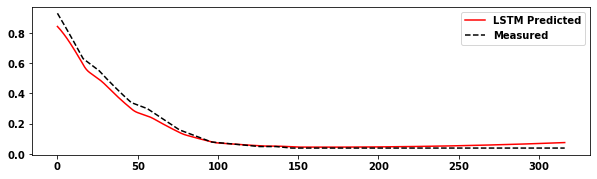

The R2 score of the Training set is :	0.9256
The R2 score of the Testing set is :	0.9828
2 4 10 0.9255595770854672
2 4 10 0.9827674859870112


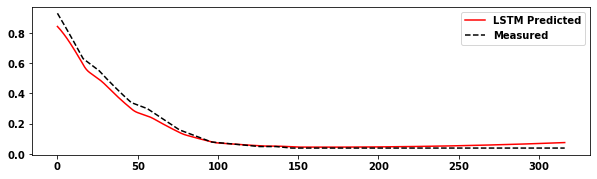

The R2 score of the Training set of  predicted values to predict is :	0.9256
The R2 score of the Testing set predicted values to predict is :	0.9636
Epoch 1/500
89/89 [==============================] - 2s 21ms/step - loss: 0.3022 - accuracy: 0.0000e+00 - val_loss: 0.0446 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0845 - accuracy: 0.0000e+00 - val_loss: 0.0356 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0623 - accuracy: 0.0000e+00 - val_loss: 0.0325 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0568 - accuracy: 0.0000e+00 - val_loss: 0.0319 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0545 - accuracy: 0.0000e+00 - val_loss: 0.0310 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0526 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0184 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 00055: early stopping
Runtime: 42.20 s


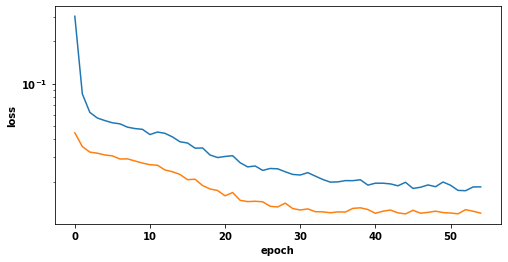

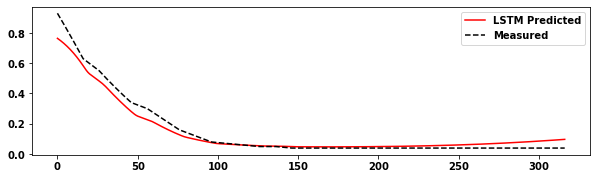

The R2 score of the Training set is :	0.9247
The R2 score of the Testing set is :	0.9605
3 4 10 0.9246713450561965
3 4 10 0.9605420770024522


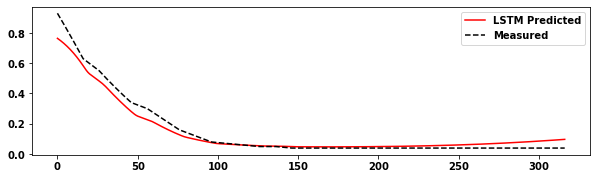

The R2 score of the Training set of  predicted values to predict is :	0.9247
The R2 score of the Testing set predicted values to predict is :	0.8728
Epoch 1/500
89/89 [==============================] - 2s 27ms/step - loss: 0.3965 - accuracy: 0.0000e+00 - val_loss: 0.0556 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0983 - accuracy: 0.0000e+00 - val_loss: 0.0344 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0679 - accuracy: 0.0000e+00 - val_loss: 0.0336 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0618 - accuracy: 0.0000e+00 - val_loss: 0.0330 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0574 - accuracy: 0.0000e+00 - val_loss: 0.0302 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0566 - accuracy: 0.0000e+00 

89/89 [==============================] - 1s 10ms/step - loss: 0.0171 - accuracy: 0.0000e+00 - val_loss: 0.0117 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0186 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0193 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0184 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0177 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0188 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0180 - accuracy: 0.0000e+00 - val_lo

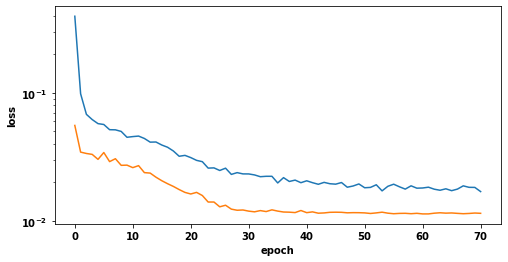

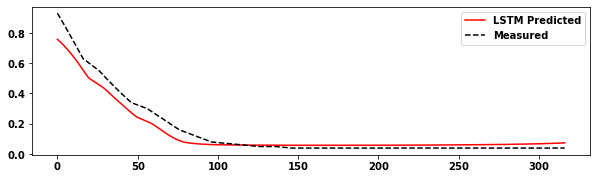

The R2 score of the Training set is :	0.9226
The R2 score of the Testing set is :	0.9423
4 4 10 0.922630740354105
4 4 10 0.9422803211489458


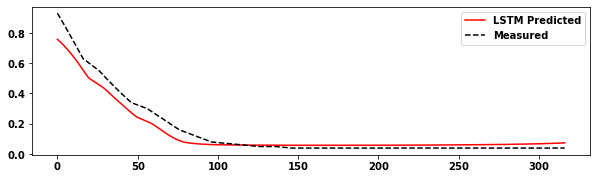

The R2 score of the Training set of  predicted values to predict is :	0.9226
The R2 score of the Testing set predicted values to predict is :	0.8695
Epoch 1/500
89/89 [==============================] - 3s 30ms/step - loss: 0.3507 - accuracy: 0.0000e+00 - val_loss: 0.0662 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 10ms/step - loss: 0.1064 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0760 - accuracy: 0.0000e+00 - val_loss: 0.0337 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0637 - accuracy: 0.0000e+00 - val_loss: 0.0363 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0595 - accuracy: 0.0000e+00 - val_loss: 0.0330 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0568 - accuracy: 0.0000e+

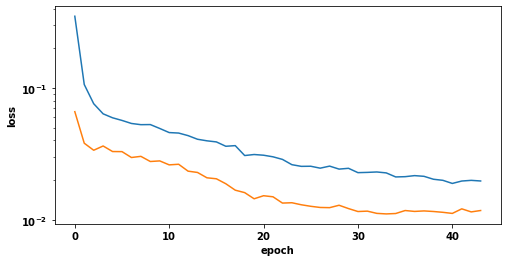

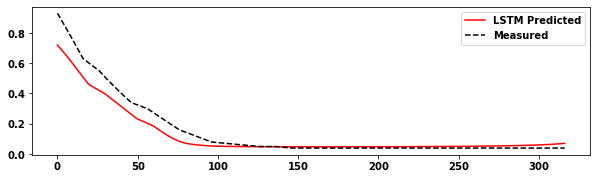

The R2 score of the Training set is :	0.9176
The R2 score of the Testing set is :	0.9121
5 4 10 0.9175574224304259
5 4 10 0.9120695782052368


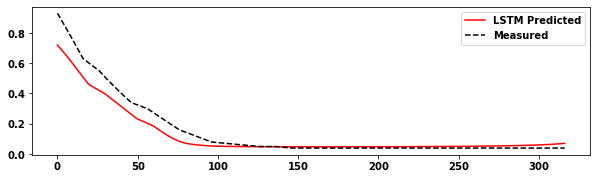

The R2 score of the Training set of  predicted values to predict is :	0.9176
The R2 score of the Testing set predicted values to predict is :	0.8486
Epoch 1/500
89/89 [==============================] - 1s 16ms/step - loss: 0.2145 - accuracy: 0.0000e+00 - val_loss: 0.0428 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0538 - accuracy: 0.0000e+00 - val_loss: 0.0319 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0461 - accuracy: 0.0000e+00 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0439 - accuracy: 0.0000e+00 - val_loss: 0.0290 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0410 - accuracy: 0.0000e+00 - val_loss: 0.0294 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0411 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0148 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0147 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0146 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0144 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0146 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0141 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 61/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0151 - accuracy: 0.0000e

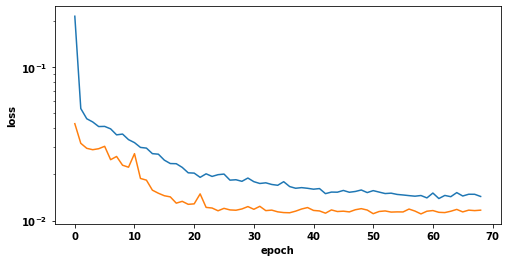

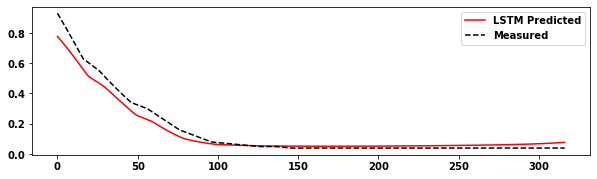

The R2 score of the Training set is :	0.9277
The R2 score of the Testing set is :	0.9577
2 4 20 0.9277382590776756
2 4 20 0.9576556915202503


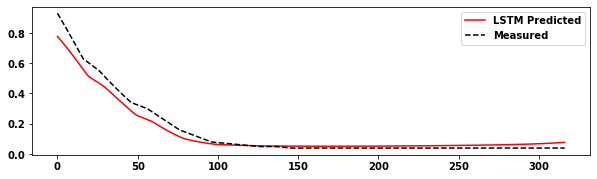

The R2 score of the Training set of  predicted values to predict is :	0.9277
The R2 score of the Testing set predicted values to predict is :	0.8753
Epoch 1/500
89/89 [==============================] - 2s 21ms/step - loss: 0.2519 - accuracy: 0.0000e+00 - val_loss: 0.0406 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0567 - accuracy: 0.0000e+00 - val_loss: 0.0306 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0477 - accuracy: 0.0000e+00 - val_loss: 0.0299 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0444 - accuracy: 0.0000e+00 - val_loss: 0.0288 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0420 - accuracy: 0.0000e+00 - val_loss: 0.0279 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0414 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0155 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0151 - accuracy: 0.0000e+00 - val_loss: 0.0116 - val_accuracy: 0.0000e+00
Epoch 00056: early stopping
Runtime: 43.43 s


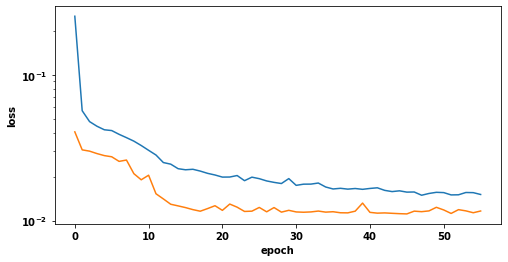

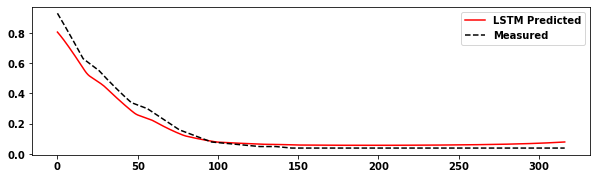

The R2 score of the Training set is :	0.9256
The R2 score of the Testing set is :	0.9653
3 4 20 0.9256325230261856
3 4 20 0.9653370164459835


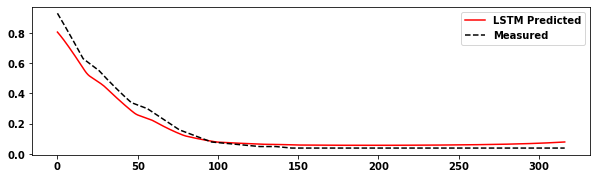

The R2 score of the Training set of  predicted values to predict is :	0.9256
The R2 score of the Testing set predicted values to predict is :	0.9135
Epoch 1/500
89/89 [==============================] - 2s 26ms/step - loss: 0.2851 - accuracy: 0.0000e+00 - val_loss: 0.0476 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0686 - accuracy: 0.0000e+00 - val_loss: 0.0331 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0515 - accuracy: 0.0000e+00 - val_loss: 0.0309 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0457 - accuracy: 0.0000e+00 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0454 - accuracy: 0.0000e+00 - val_loss: 0.0310 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0424 - accuracy: 0.0000e+00 -

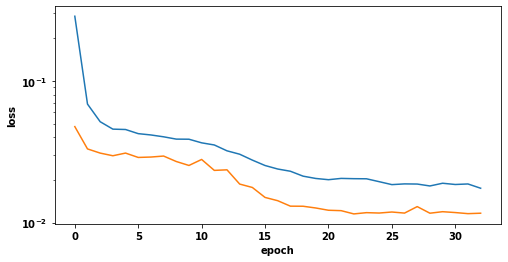

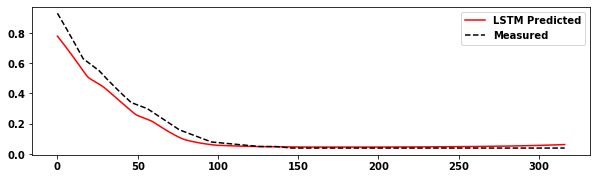

The R2 score of the Training set is :	0.9254
The R2 score of the Testing set is :	0.9570
4 4 20 0.9253754276287749
4 4 20 0.9570132307361936


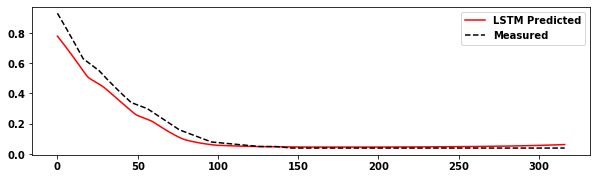

The R2 score of the Training set of  predicted values to predict is :	0.9254
The R2 score of the Testing set predicted values to predict is :	0.8864
Epoch 1/500
89/89 [==============================] - 3s 31ms/step - loss: 0.2792 - accuracy: 0.0000e+00 - val_loss: 0.0434 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0683 - accuracy: 0.0000e+00 - val_loss: 0.0362 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0546 - accuracy: 0.0000e+00 - val_loss: 0.0330 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0501 - accuracy: 0.0000e+00 - val_loss: 0.0318 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0494 - accuracy: 0.0000e+00 - val_loss: 0.0304 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0453 - accuracy: 0.0000e+

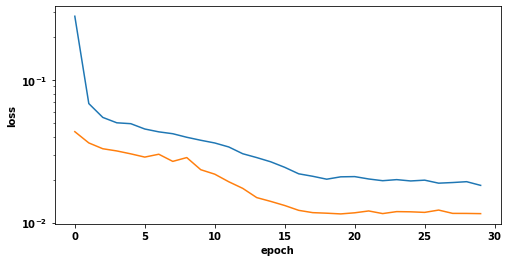

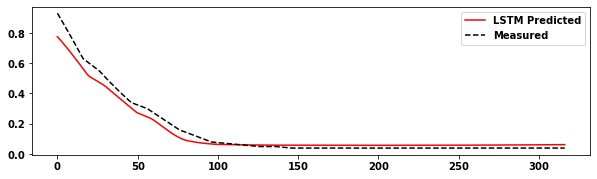

The R2 score of the Training set is :	0.9251
The R2 score of the Testing set is :	0.9622
5 4 20 0.925145675819698
5 4 20 0.9621845252947547


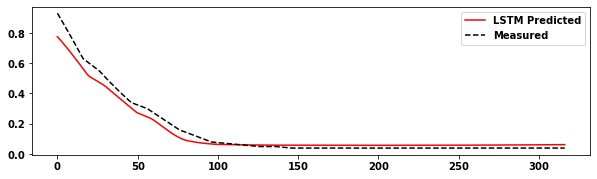

The R2 score of the Training set of  predicted values to predict is :	0.9251
The R2 score of the Testing set predicted values to predict is :	0.8907
Epoch 1/500
89/89 [==============================] - 2s 17ms/step - loss: 0.1943 - accuracy: 0.0000e+00 - val_loss: 0.0359 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0438 - accuracy: 0.0000e+00 - val_loss: 0.0360 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0400 - accuracy: 0.0000e+00 - val_loss: 0.0318 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0388 - accuracy: 0.0000e+00 - val_loss: 0.0299 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0367 - accuracy: 0.0000e+00 - val_loss: 0.0288 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 7ms/step - loss: 0.0365 - accuracy: 0.0000e+00 - 

Epoch 55/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0137 - accuracy: 0.0000e+00 - val_loss: 0.0120 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 6ms/step - loss: 0.0144 - accuracy: 0.0000e+00 - val_loss: 0.0118 - val_accuracy: 0.0000e+00
Epoch 00056: early stopping
Runtime: 40.39 s


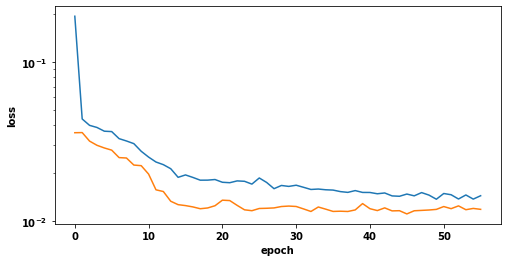

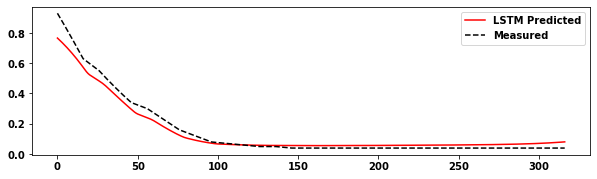

The R2 score of the Training set is :	0.9283
The R2 score of the Testing set is :	0.9636
2 4 30 0.9282666478508481
2 4 30 0.9636489348141184


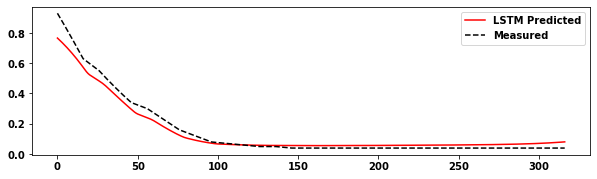

The R2 score of the Training set of  predicted values to predict is :	0.9283
The R2 score of the Testing set predicted values to predict is :	0.8695
Epoch 1/500
89/89 [==============================] - 2s 22ms/step - loss: 0.2027 - accuracy: 0.0000e+00 - val_loss: 0.0389 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0497 - accuracy: 0.0000e+00 - val_loss: 0.0298 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0425 - accuracy: 0.0000e+00 - val_loss: 0.0282 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 8ms/step - loss: 0.0417 - accuracy: 0.0000e+00 - val_loss: 0.0283 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0397 - accuracy: 0.0000e+00 - val_loss: 0.0342 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0375 - accuracy: 0.0000e+00 - 

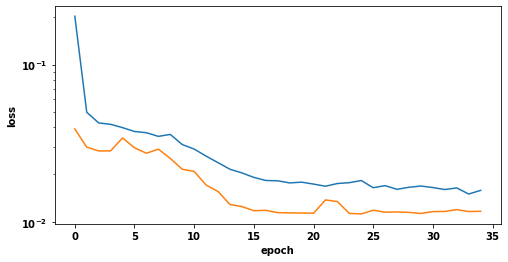

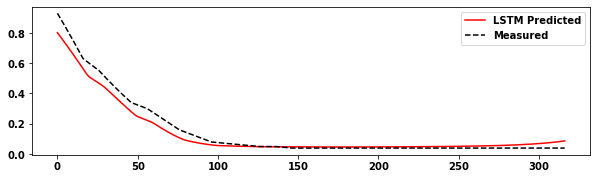

The R2 score of the Training set is :	0.9274
The R2 score of the Testing set is :	0.9589
3 4 30 0.92742191679683
3 4 30 0.9589023485320172


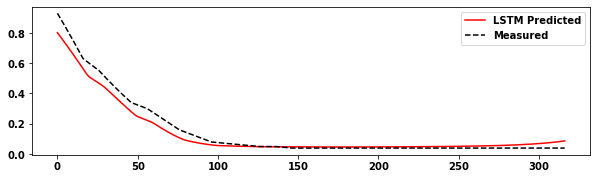

The R2 score of the Training set of  predicted values to predict is :	0.9274
The R2 score of the Testing set predicted values to predict is :	0.8790
Epoch 1/500
89/89 [==============================] - 2s 28ms/step - loss: 0.2187 - accuracy: 0.0000e+00 - val_loss: 0.0417 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0499 - accuracy: 0.0000e+00 - val_loss: 0.0356 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0447 - accuracy: 0.0000e+00 - val_loss: 0.0317 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0432 - accuracy: 0.0000e+00 - val_loss: 0.0307 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0427 - accuracy: 0.0000e+00 - val_loss: 0.0323 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0393 - accuracy: 0.0000e+

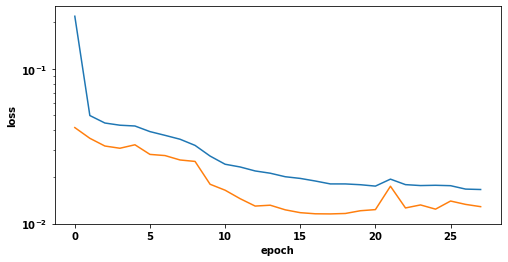

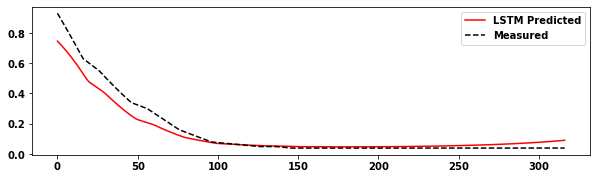

The R2 score of the Training set is :	0.9224
The R2 score of the Testing set is :	0.9302
4 4 30 0.9224380806292909
4 4 30 0.9302329713668922


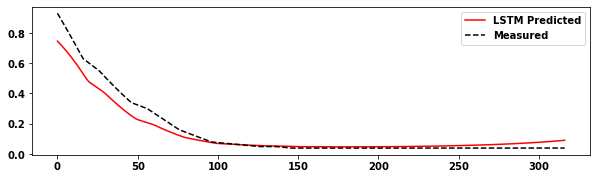

The R2 score of the Training set of  predicted values to predict is :	0.9224
The R2 score of the Testing set predicted values to predict is :	0.8245
Epoch 1/500
89/89 [==============================] - 3s 38ms/step - loss: 0.2536 - accuracy: 0.0000e+00 - val_loss: 0.0446 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0575 - accuracy: 0.0000e+00 - val_loss: 0.0350 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0490 - accuracy: 0.0000e+00 - val_loss: 0.0311 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0437 - accuracy: 0.0000e+00 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0423 - accuracy: 0.0000e+00 - val_loss: 0.0282 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0403 - accuracy: 0.0000e+

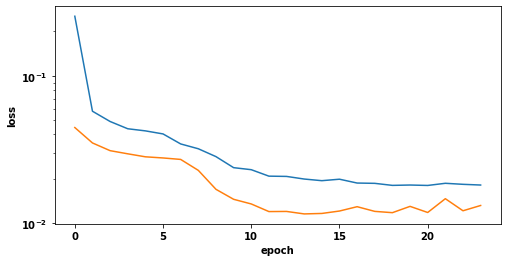

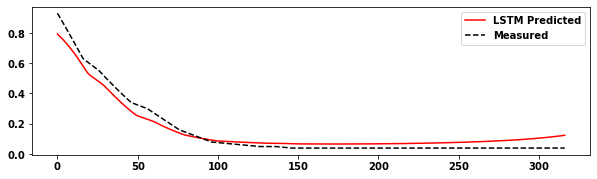

The R2 score of the Training set is :	0.9154
The R2 score of the Testing set is :	0.9490
5 4 30 0.9154036790747487
5 4 30 0.9489754984160449


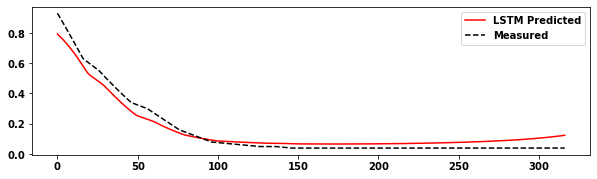

The R2 score of the Training set of  predicted values to predict is :	0.9154
The R2 score of the Testing set predicted values to predict is :	0.8691
Epoch 1/500
89/89 [==============================] - 2s 23ms/step - loss: 0.1640 - accuracy: 0.0000e+00 - val_loss: 0.0290 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0398 - accuracy: 0.0000e+00 - val_loss: 0.0336 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0373 - accuracy: 0.0000e+00 - val_loss: 0.0282 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0356 - accuracy: 0.0000e+00 - val_loss: 0.0298 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0334 - accuracy: 0.0000e+00 - val_loss: 0.0252 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0318 - accuracy: 0.0000e+00 

89/89 [==============================] - 1s 10ms/step - loss: 0.0139 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 9ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0123 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0138 - accuracy: 0.0000e+00 - val_loss: 0.0117 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0138 - accuracy: 0.0000e+00 - v

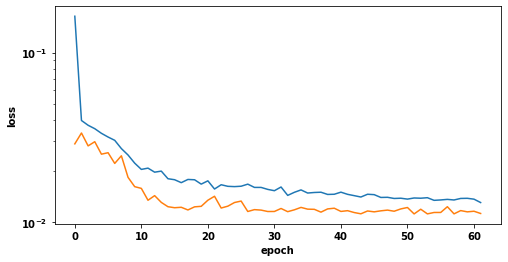

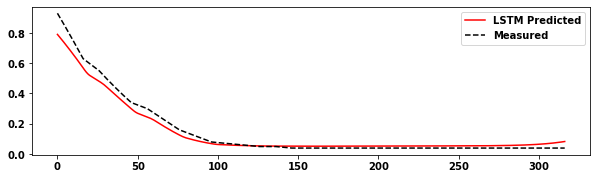

The R2 score of the Training set is :	0.9298
The R2 score of the Testing set is :	0.9690
2 4 40 0.9297887505393141
2 4 40 0.9689922535164166


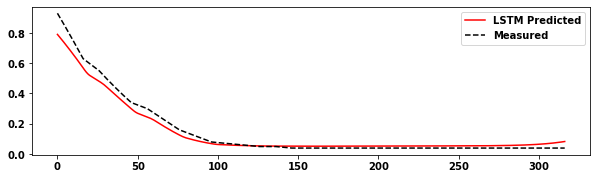

The R2 score of the Training set of  predicted values to predict is :	0.9298
The R2 score of the Testing set predicted values to predict is :	0.8988
Epoch 1/500
89/89 [==============================] - 2s 26ms/step - loss: 0.1712 - accuracy: 0.0000e+00 - val_loss: 0.0324 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0424 - accuracy: 0.0000e+00 - val_loss: 0.0340 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0387 - accuracy: 0.0000e+00 - val_loss: 0.0287 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0378 - accuracy: 0.0000e+00 - val_loss: 0.0270 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0360 - accuracy: 0.0000e+00 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0338 - accuracy: 0.0000e+

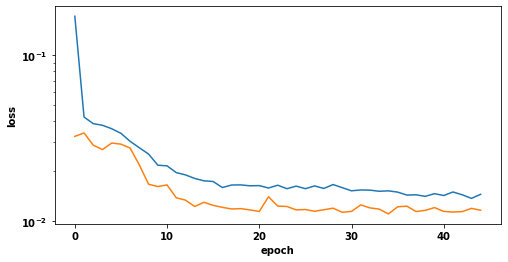

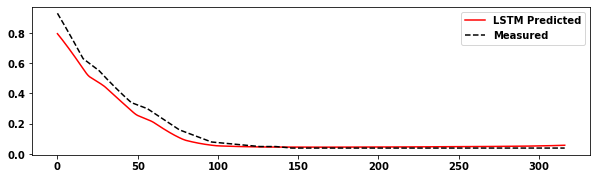

The R2 score of the Training set is :	0.9253
The R2 score of the Testing set is :	0.9634
3 4 40 0.9253284329059138
3 4 40 0.9634310024665267


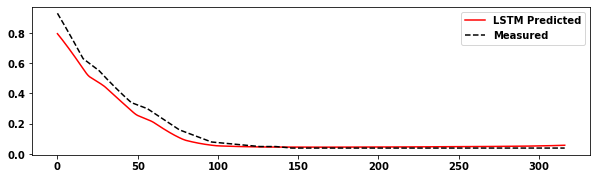

The R2 score of the Training set of  predicted values to predict is :	0.9253
The R2 score of the Testing set predicted values to predict is :	0.8917
Epoch 1/500
89/89 [==============================] - 3s 32ms/step - loss: 0.1963 - accuracy: 0.0000e+00 - val_loss: 0.0375 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0458 - accuracy: 0.0000e+00 - val_loss: 0.0332 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0430 - accuracy: 0.0000e+00 - val_loss: 0.0307 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0402 - accuracy: 0.0000e+00 - val_loss: 0.0287 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0379 - accuracy: 0.0000e+00 - val_loss: 0.0303 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0359 - accuracy: 0.0000e+

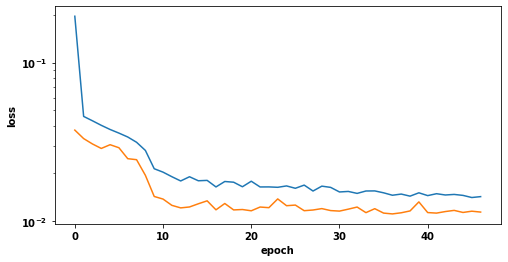

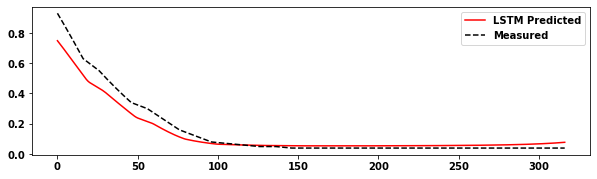

The R2 score of the Training set is :	0.9279
The R2 score of the Testing set is :	0.9319
4 4 40 0.927874071562528
4 4 40 0.9318554179287046


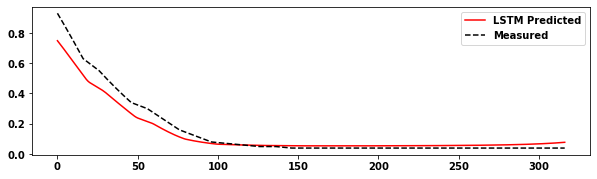

The R2 score of the Training set of  predicted values to predict is :	0.9279
The R2 score of the Testing set predicted values to predict is :	0.8448
Epoch 1/500
89/89 [==============================] - 3s 37ms/step - loss: 0.2190 - accuracy: 0.0000e+00 - val_loss: 0.0399 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0506 - accuracy: 0.0000e+00 - val_loss: 0.0337 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0451 - accuracy: 0.0000e+00 - val_loss: 0.0310 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0424 - accuracy: 0.0000e+00 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0394 - accuracy: 0.0000e+00 - val_loss: 0.0292 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0385 - accuracy: 0.0000e+

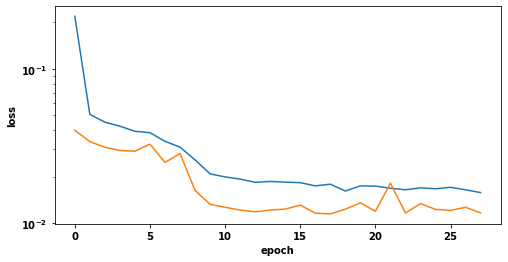

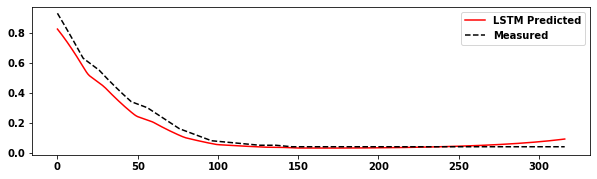

The R2 score of the Training set is :	0.9240
The R2 score of the Testing set is :	0.9620
5 4 40 0.924032184391202
5 4 40 0.9619682040668842


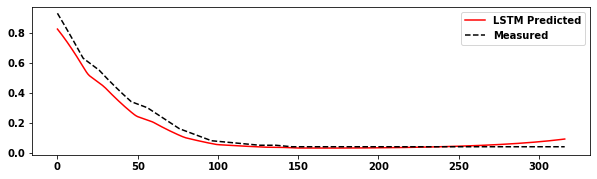

The R2 score of the Training set of  predicted values to predict is :	0.9240
The R2 score of the Testing set predicted values to predict is :	0.8968
Epoch 1/500
89/89 [==============================] - 2s 21ms/step - loss: 0.1442 - accuracy: 0.0000e+00 - val_loss: 0.0284 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0371 - accuracy: 0.0000e+00 - val_loss: 0.0319 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0350 - accuracy: 0.0000e+00 - val_loss: 0.0268 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0331 - accuracy: 0.0000e+00 - val_loss: 0.0291 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0312 - accuracy: 0.0000e+00 - val_loss: 0.0273 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0292 - accuracy: 0.0000e+

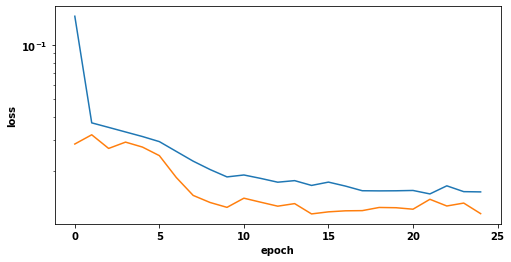

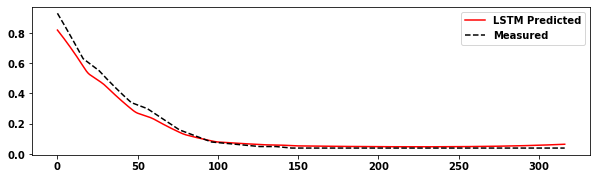

The R2 score of the Training set is :	0.9240
The R2 score of the Testing set is :	0.9783
2 4 50 0.9240474733379936
2 4 50 0.9782816744247909


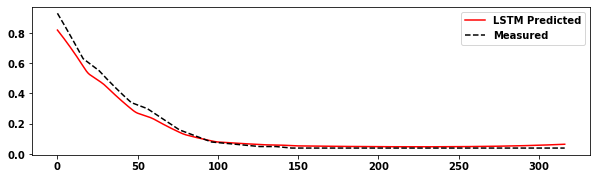

The R2 score of the Training set of  predicted values to predict is :	0.9240
The R2 score of the Testing set predicted values to predict is :	0.9457
Epoch 1/500
89/89 [==============================] - 2s 28ms/step - loss: 0.1535 - accuracy: 0.0000e+00 - val_loss: 0.0305 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0414 - accuracy: 0.0000e+00 - val_loss: 0.0320 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0385 - accuracy: 0.0000e+00 - val_loss: 0.0298 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0357 - accuracy: 0.0000e+00 - val_loss: 0.0322 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0345 - accuracy: 0.0000e+00 - val_loss: 0.0279 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0319 - accuracy: 0.0000e+

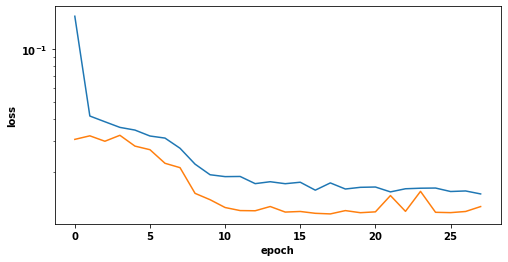

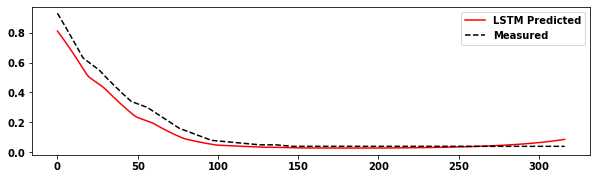

The R2 score of the Training set is :	0.9221
The R2 score of the Testing set is :	0.9510
3 4 50 0.9221352921942657
3 4 50 0.9510239211381163


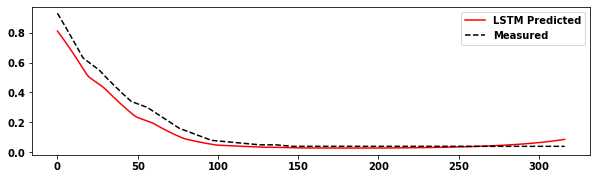

The R2 score of the Training set of  predicted values to predict is :	0.9221
The R2 score of the Testing set predicted values to predict is :	0.8907
Epoch 1/500
89/89 [==============================] - 3s 35ms/step - loss: 0.1756 - accuracy: 0.0000e+00 - val_loss: 0.0391 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0436 - accuracy: 0.0000e+00 - val_loss: 0.0328 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0398 - accuracy: 0.0000e+00 - val_loss: 0.0302 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0384 - accuracy: 0.0000e+00 - val_loss: 0.0305 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0365 - accuracy: 0.0000e+00 - val_loss: 0.0280 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0340 - accuracy: 0.0000e+

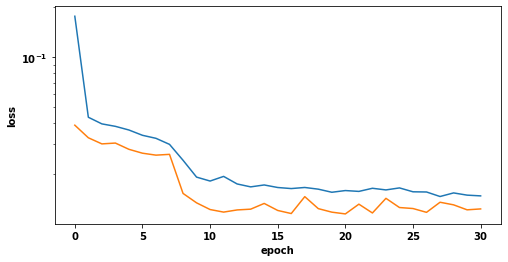

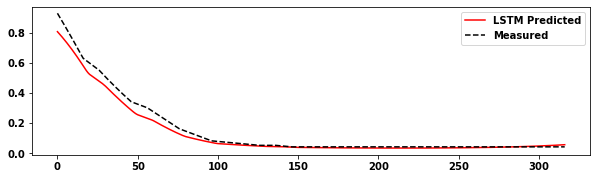

The R2 score of the Training set is :	0.9213
The R2 score of the Testing set is :	0.9723
4 4 50 0.9212775137221252
4 4 50 0.9723203384249124


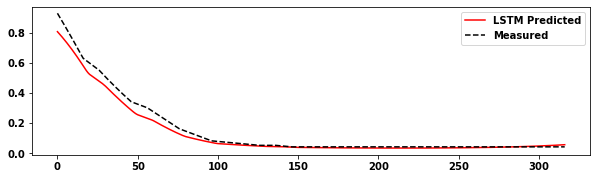

The R2 score of the Training set of  predicted values to predict is :	0.9213
The R2 score of the Testing set predicted values to predict is :	0.8878
Epoch 1/500
89/89 [==============================] - 4s 44ms/step - loss: 0.1916 - accuracy: 0.0000e+00 - val_loss: 0.0366 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0465 - accuracy: 0.0000e+00 - val_loss: 0.0367 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0431 - accuracy: 0.0000e+00 - val_loss: 0.0306 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0395 - accuracy: 0.0000e+00 - val_loss: 0.0306 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0369 - accuracy: 0.0000e+00 - val_loss: 0.0320 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0338 - accuracy: 0.0000e+

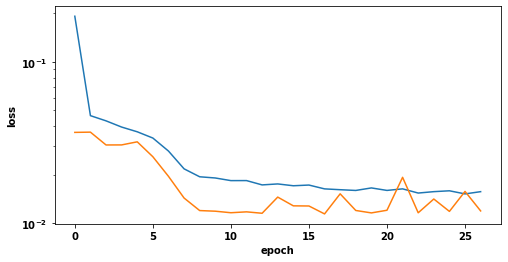

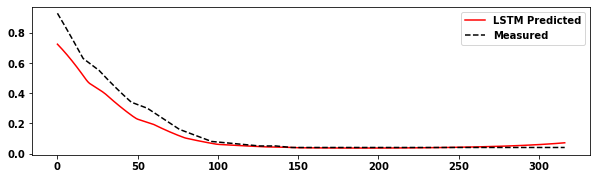

The R2 score of the Training set is :	0.9234
The R2 score of the Testing set is :	0.9243
5 4 50 0.9234290178230004
5 4 50 0.9242553359650184


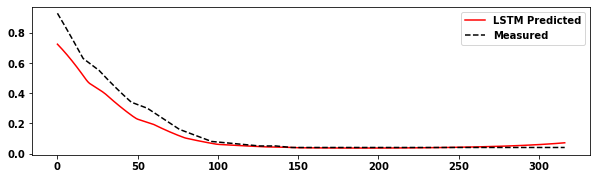

The R2 score of the Training set of  predicted values to predict is :	0.9234
The R2 score of the Testing set predicted values to predict is :	0.8360
Epoch 1/500
89/89 [==============================] - 2s 23ms/step - loss: 0.1290 - accuracy: 0.0000e+00 - val_loss: 0.0270 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0355 - accuracy: 0.0000e+00 - val_loss: 0.0297 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0334 - accuracy: 0.0000e+00 - val_loss: 0.0279 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0321 - accuracy: 0.0000e+00 - val_loss: 0.0237 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0302 - accuracy: 0.0000e+00 - val_loss: 0.0226 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0253 - accuracy: 0.0000e+

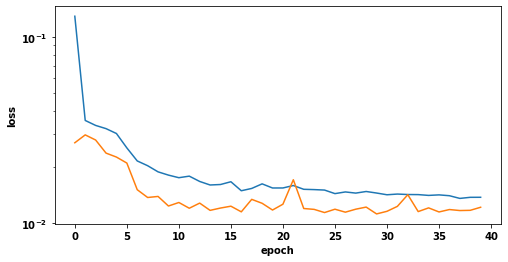

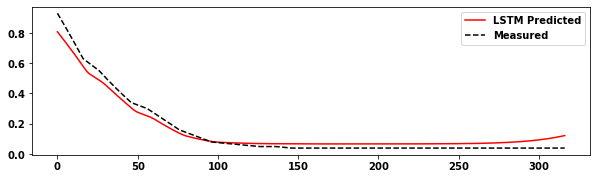

The R2 score of the Training set is :	0.9247
The R2 score of the Testing set is :	0.9628
2 4 60 0.9247041833594092
2 4 60 0.9627755539406418


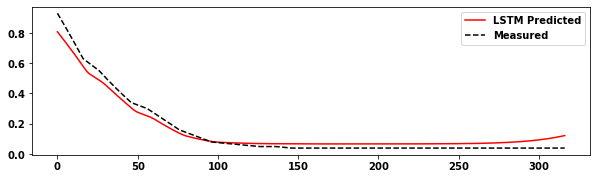

The R2 score of the Training set of  predicted values to predict is :	0.9247
The R2 score of the Testing set predicted values to predict is :	0.8794
Epoch 1/500
89/89 [==============================] - 3s 30ms/step - loss: 0.1486 - accuracy: 0.0000e+00 - val_loss: 0.0325 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0397 - accuracy: 0.0000e+00 - val_loss: 0.0318 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0355 - accuracy: 0.0000e+00 - val_loss: 0.0284 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0349 - accuracy: 0.0000e+00 - val_loss: 0.0263 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0338 - accuracy: 0.0000e+00 - val_loss: 0.0257 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0310 - accuracy: 0.0000e+

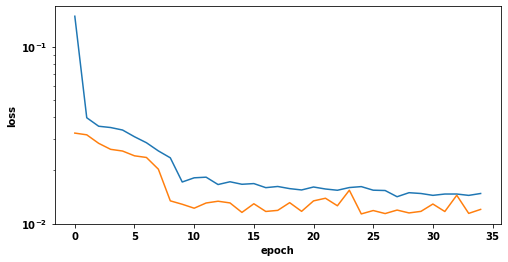

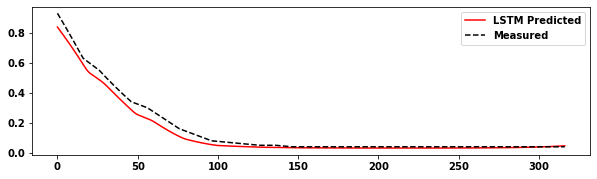

The R2 score of the Training set is :	0.9204
The R2 score of the Testing set is :	0.9735
3 4 60 0.9204370049398484
3 4 60 0.9734927922325504


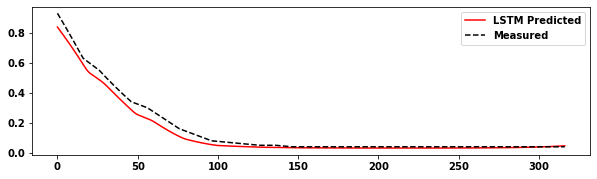

The R2 score of the Training set of  predicted values to predict is :	0.9204
The R2 score of the Testing set predicted values to predict is :	0.9103
Epoch 1/500
89/89 [==============================] - 3s 37ms/step - loss: 0.1596 - accuracy: 0.0000e+00 - val_loss: 0.0350 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0419 - accuracy: 0.0000e+00 - val_loss: 0.0306 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0396 - accuracy: 0.0000e+00 - val_loss: 0.0307 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0359 - accuracy: 0.0000e+00 - val_loss: 0.0278 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0363 - accuracy: 0.0000e+00 - val_loss: 0.0281 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0336 - accuracy: 0.0000e+

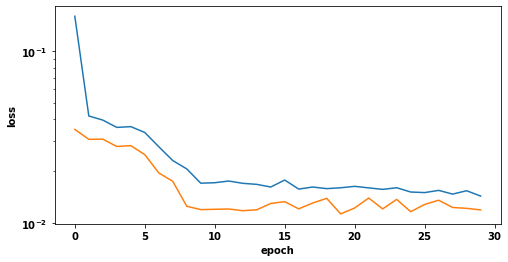

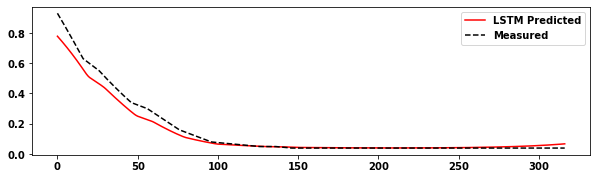

The R2 score of the Training set is :	0.9262
The R2 score of the Testing set is :	0.9617
4 4 60 0.926157774000296
4 4 60 0.9616597172265943


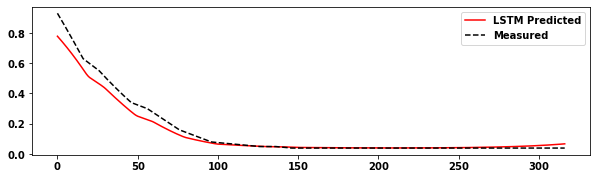

The R2 score of the Training set of  predicted values to predict is :	0.9262
The R2 score of the Testing set predicted values to predict is :	0.8737
Epoch 1/500
89/89 [==============================] - 4s 44ms/step - loss: 0.1677 - accuracy: 0.0000e+00 - val_loss: 0.0368 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0439 - accuracy: 0.0000e+00 - val_loss: 0.0322 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0408 - accuracy: 0.0000e+00 - val_loss: 0.0298 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0370 - accuracy: 0.0000e+00 - val_loss: 0.0303 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0374 - accuracy: 0.0000e+00 - val_loss: 0.0315 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0330 - accuracy: 0.0000e+

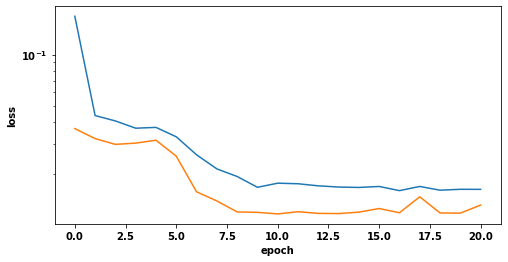

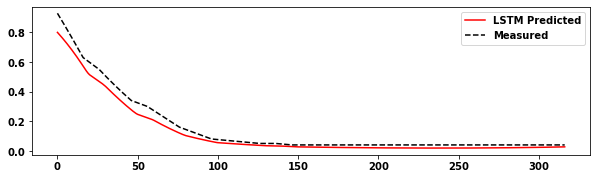

The R2 score of the Training set is :	0.9129
The R2 score of the Testing set is :	0.9617
5 4 60 0.9128597561400867
5 4 60 0.961656273562384


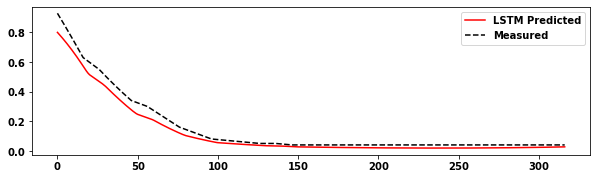

The R2 score of the Training set of  predicted values to predict is :	0.9129
The R2 score of the Testing set predicted values to predict is :	0.9006
Epoch 1/500
89/89 [==============================] - 2s 26ms/step - loss: 0.1187 - accuracy: 0.0000e+00 - val_loss: 0.0268 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0334 - accuracy: 0.0000e+00 - val_loss: 0.0262 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0324 - accuracy: 0.0000e+00 - val_loss: 0.0312 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0305 - accuracy: 0.0000e+00 - val_loss: 0.0232 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0286 - accuracy: 0.0000e+00 - val_loss: 0.0254 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0250 - accuracy: 0.0000e+

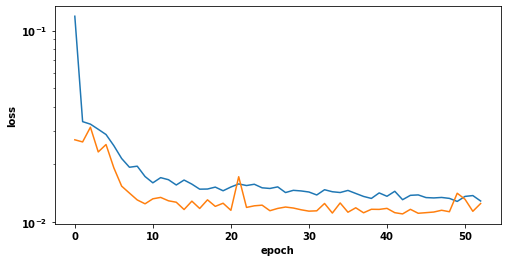

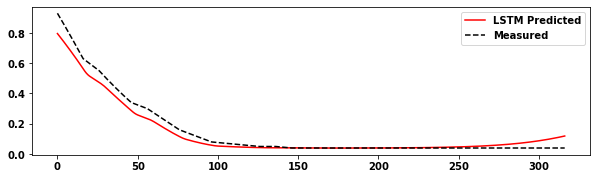

The R2 score of the Training set is :	0.9271
The R2 score of the Testing set is :	0.9593
2 4 70 0.9271036646408224
2 4 70 0.9593448695928453


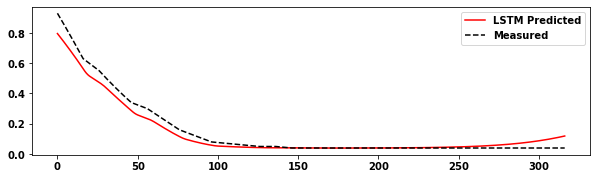

The R2 score of the Training set of  predicted values to predict is :	0.9271
The R2 score of the Testing set predicted values to predict is :	0.8920
Epoch 1/500
89/89 [==============================] - 3s 32ms/step - loss: 0.1317 - accuracy: 0.0000e+00 - val_loss: 0.0298 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0375 - accuracy: 0.0000e+00 - val_loss: 0.0281 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0364 - accuracy: 0.0000e+00 - val_loss: 0.0286 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0341 - accuracy: 0.0000e+00 - val_loss: 0.0263 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0325 - accuracy: 0.0000e+00 - val_loss: 0.0295 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 17ms/step - loss: 0.0285 - accuracy: 0.0000e+

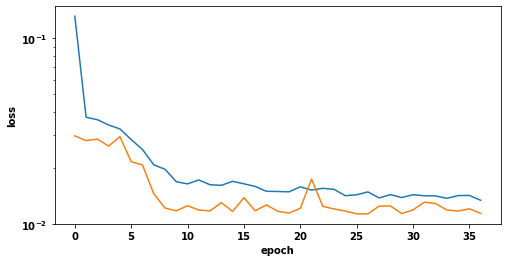

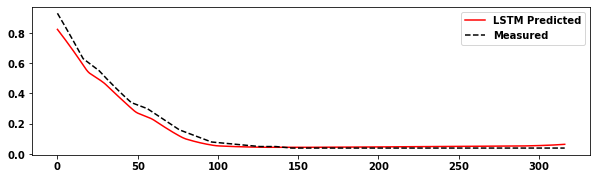

The R2 score of the Training set is :	0.9260
The R2 score of the Testing set is :	0.9783
3 4 70 0.9259589161530564
3 4 70 0.9783346141423087


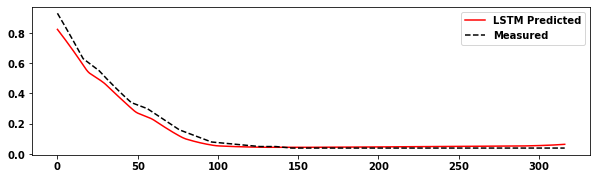

The R2 score of the Training set of  predicted values to predict is :	0.9260
The R2 score of the Testing set predicted values to predict is :	0.8996
Epoch 1/500
89/89 [==============================] - 4s 43ms/step - loss: 0.1461 - accuracy: 0.0000e+00 - val_loss: 0.0357 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0392 - accuracy: 0.0000e+00 - val_loss: 0.0303 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0369 - accuracy: 0.0000e+00 - val_loss: 0.0331 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0347 - accuracy: 0.0000e+00 - val_loss: 0.0268 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0338 - accuracy: 0.0000e+00 - val_loss: 0.0347 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0278 - accuracy: 0.0000e+

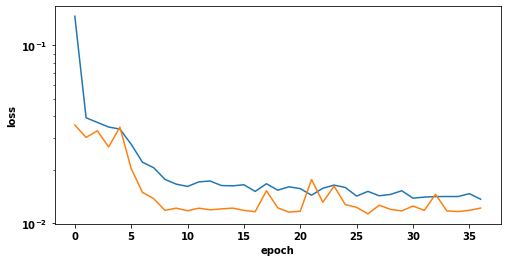

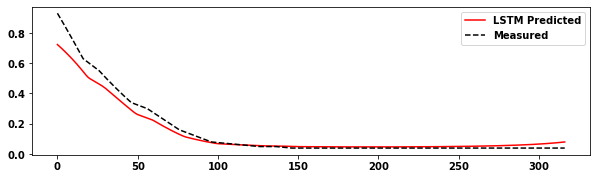

The R2 score of the Training set is :	0.9224
The R2 score of the Testing set is :	0.9505
4 4 70 0.9224334078028694
4 4 70 0.9505459613481777


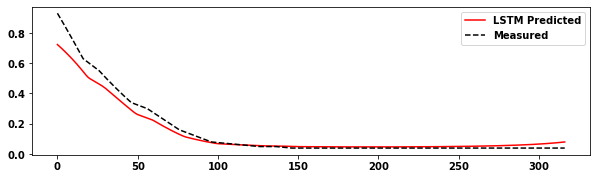

The R2 score of the Training set of  predicted values to predict is :	0.9224
The R2 score of the Testing set predicted values to predict is :	0.8556
Epoch 1/500
89/89 [==============================] - 4s 48ms/step - loss: 0.1584 - accuracy: 0.0000e+00 - val_loss: 0.0358 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0436 - accuracy: 0.0000e+00 - val_loss: 0.0374 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0407 - accuracy: 0.0000e+00 - val_loss: 0.0304 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0386 - accuracy: 0.0000e+00 - val_loss: 0.0293 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0350 - accuracy: 0.0000e+00 - val_loss: 0.0299 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0295 - accuracy: 0.0000e+

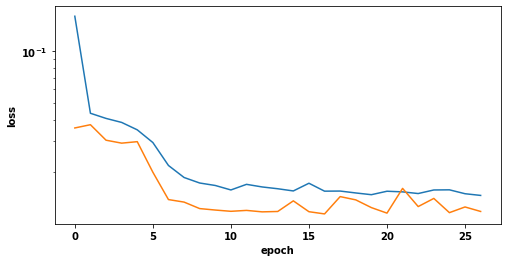

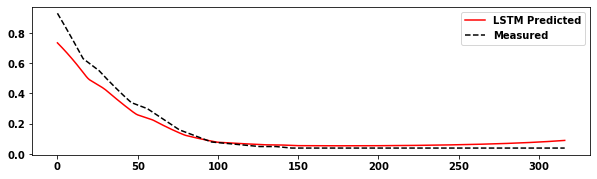

The R2 score of the Training set is :	0.9256
The R2 score of the Testing set is :	0.9444
5 4 70 0.9255974144331899
5 4 70 0.9444320961205867


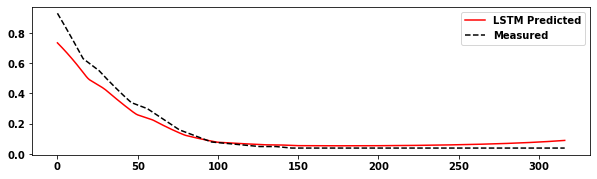

The R2 score of the Training set of  predicted values to predict is :	0.9256
The R2 score of the Testing set predicted values to predict is :	0.8533
Epoch 1/500
89/89 [==============================] - 2s 27ms/step - loss: 0.1090 - accuracy: 0.0000e+00 - val_loss: 0.0268 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0328 - accuracy: 0.0000e+00 - val_loss: 0.0276 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0311 - accuracy: 0.0000e+00 - val_loss: 0.0257 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0302 - accuracy: 0.0000e+00 - val_loss: 0.0231 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0270 - accuracy: 0.0000e+00 - val_loss: 0.0260 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0237 - accuracy: 0.0000e+

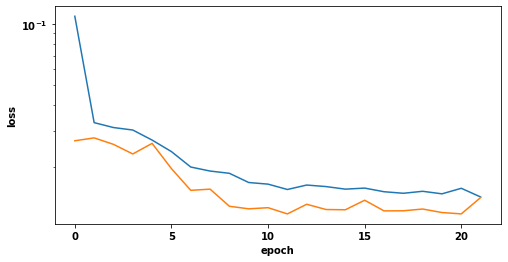

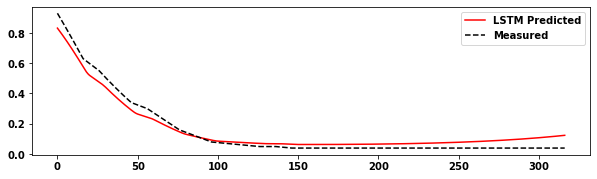

The R2 score of the Training set is :	0.9128
The R2 score of the Testing set is :	0.9551
2 4 80 0.9128052979617528
2 4 80 0.9551206516175281


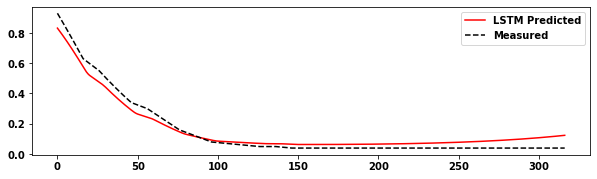

The R2 score of the Training set of  predicted values to predict is :	0.9128
The R2 score of the Testing set predicted values to predict is :	0.9209
Epoch 1/500
89/89 [==============================] - 3s 34ms/step - loss: 0.1312 - accuracy: 0.0000e+00 - val_loss: 0.0293 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0373 - accuracy: 0.0000e+00 - val_loss: 0.0277 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0349 - accuracy: 0.0000e+00 - val_loss: 0.0283 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0323 - accuracy: 0.0000e+00 - val_loss: 0.0272 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0304 - accuracy: 0.0000e+00 - val_loss: 0.0251 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0267 - accuracy: 0.0000e+

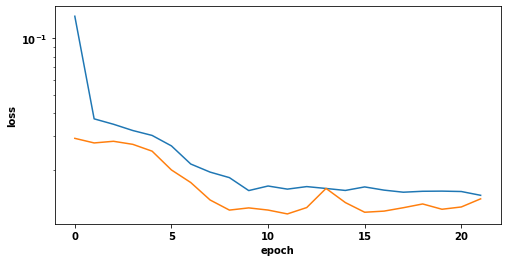

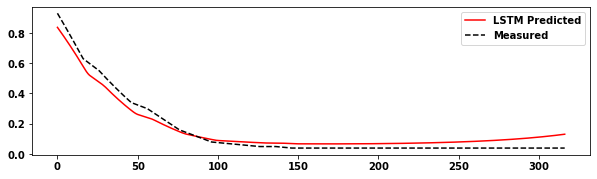

The R2 score of the Training set is :	0.9115
The R2 score of the Testing set is :	0.9513
3 4 80 0.9114547142322911
3 4 80 0.951268381279621


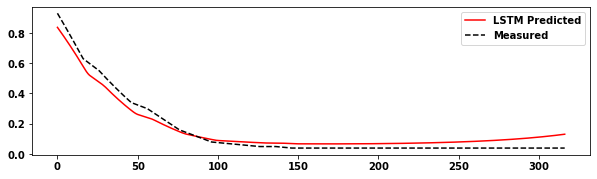

The R2 score of the Training set of  predicted values to predict is :	0.9115
The R2 score of the Testing set predicted values to predict is :	0.9135
Epoch 1/500
89/89 [==============================] - 4s 44ms/step - loss: 0.1327 - accuracy: 0.0000e+00 - val_loss: 0.0357 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0388 - accuracy: 0.0000e+00 - val_loss: 0.0325 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0372 - accuracy: 0.0000e+00 - val_loss: 0.0302 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0363 - accuracy: 0.0000e+00 - val_loss: 0.0332 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0328 - accuracy: 0.0000e+00 - val_loss: 0.0329 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0270 - accuracy: 0.0000e+

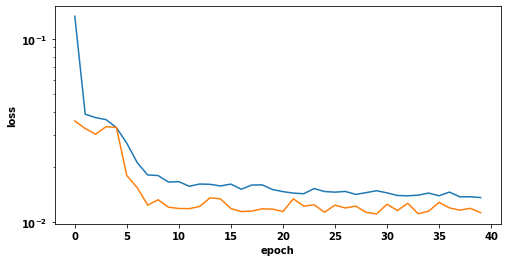

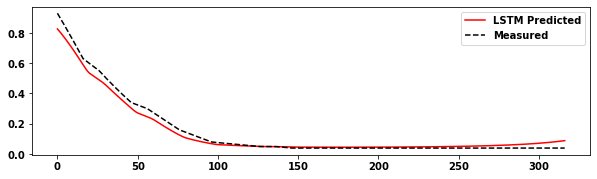

The R2 score of the Training set is :	0.9263
The R2 score of the Testing set is :	0.9782
4 4 80 0.9262585992476384
4 4 80 0.9782414188518533


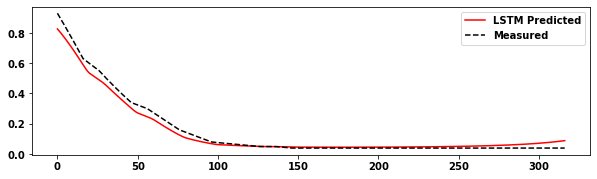

The R2 score of the Training set of  predicted values to predict is :	0.9263
The R2 score of the Testing set predicted values to predict is :	0.8895
Epoch 1/500
89/89 [==============================] - 5s 59ms/step - loss: 0.1479 - accuracy: 0.0000e+00 - val_loss: 0.0361 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 32ms/step - loss: 0.0429 - accuracy: 0.0000e+00 - val_loss: 0.0329 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 32ms/step - loss: 0.0391 - accuracy: 0.0000e+00 - val_loss: 0.0326 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0360 - accuracy: 0.0000e+00 - val_loss: 0.0286 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0327 - accuracy: 0.0000e+00 - val_loss: 0.0328 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0243 - accuracy: 0.0000e+

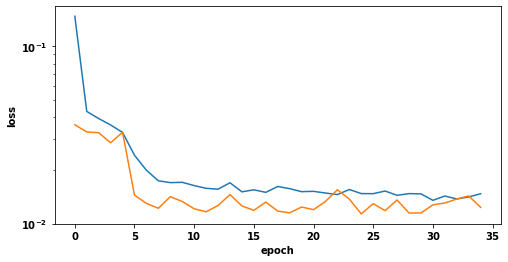

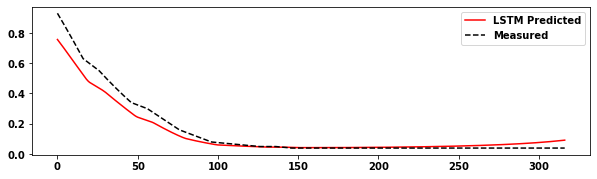

The R2 score of the Training set is :	0.9254
The R2 score of the Testing set is :	0.9369
5 4 80 0.9253502700713427
5 4 80 0.9368807034776767


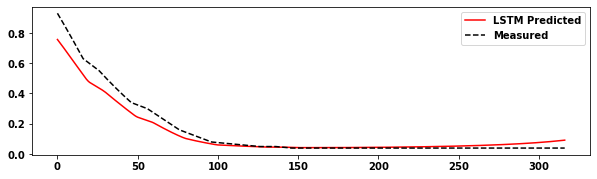

The R2 score of the Training set of  predicted values to predict is :	0.9254
The R2 score of the Testing set predicted values to predict is :	0.8331
Epoch 1/500
89/89 [==============================] - 3s 39ms/step - loss: 0.1115 - accuracy: 0.0000e+00 - val_loss: 0.0265 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0327 - accuracy: 0.0000e+00 - val_loss: 0.0261 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0311 - accuracy: 0.0000e+00 - val_loss: 0.0278 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0292 - accuracy: 0.0000e+00 - val_loss: 0.0239 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0263 - accuracy: 0.0000e+00 - val_loss: 0.0256 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0206 - accuracy: 0.0000e+

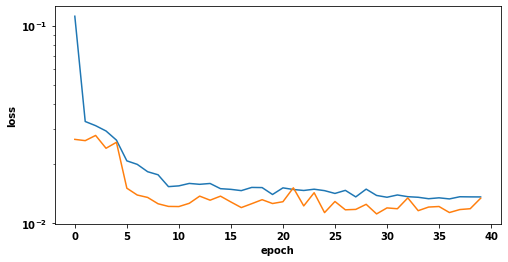

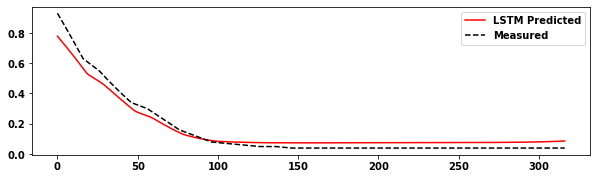

The R2 score of the Training set is :	0.9196
The R2 score of the Testing set is :	0.9545
2 4 90 0.919602970393147
2 4 90 0.9545462766663144


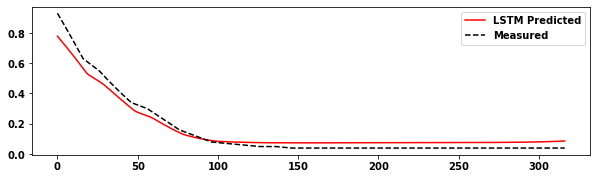

The R2 score of the Training set of  predicted values to predict is :	0.9196
The R2 score of the Testing set predicted values to predict is :	0.8903
Epoch 1/500
89/89 [==============================] - 6s 63ms/step - loss: 0.1185 - accuracy: 0.0000e+00 - val_loss: 0.0294 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0357 - accuracy: 0.0000e+00 - val_loss: 0.0278 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0342 - accuracy: 0.0000e+00 - val_loss: 0.0290 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0325 - accuracy: 0.0000e+00 - val_loss: 0.0249 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0305 - accuracy: 0.0000e+00 - val_loss: 0.0349 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0228 - accuracy: 0.0000e+

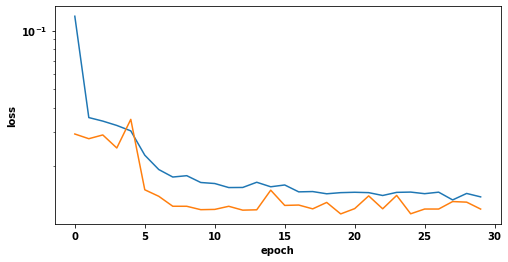

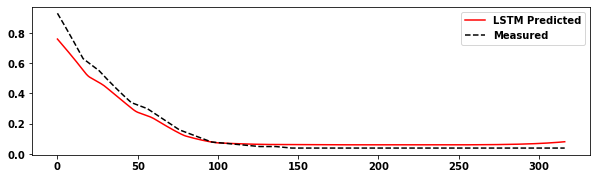

The R2 score of the Training set is :	0.9246
The R2 score of the Testing set is :	0.9592
3 4 90 0.9245929069999432
3 4 90 0.9592025172939149


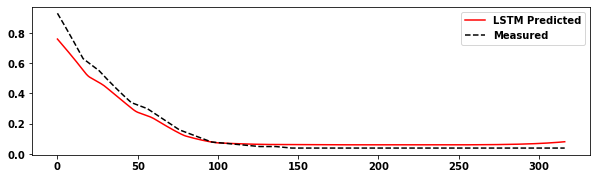

The R2 score of the Training set of  predicted values to predict is :	0.9246
The R2 score of the Testing set predicted values to predict is :	0.8868
Epoch 1/500
89/89 [==============================] - 6s 73ms/step - loss: 0.1304 - accuracy: 0.0000e+00 - val_loss: 0.0319 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0393 - accuracy: 0.0000e+00 - val_loss: 0.0308 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0364 - accuracy: 0.0000e+00 - val_loss: 0.0312 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0351 - accuracy: 0.0000e+00 - val_loss: 0.0277 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0324 - accuracy: 0.0000e+00 - val_loss: 0.0339 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0251 - accuracy: 0.0000e+

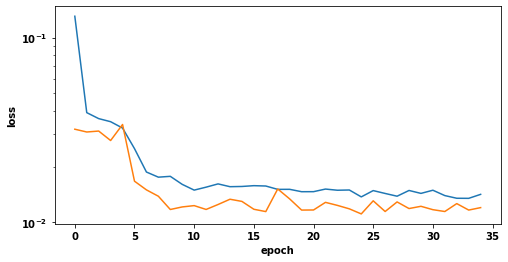

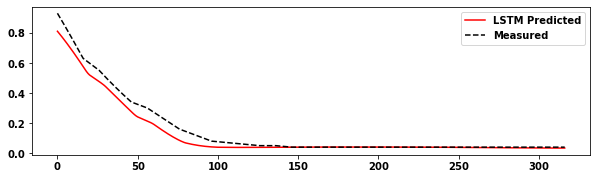

The R2 score of the Training set is :	0.9142
The R2 score of the Testing set is :	0.9580
4 4 90 0.9142049376442247
4 4 90 0.9580274708273194


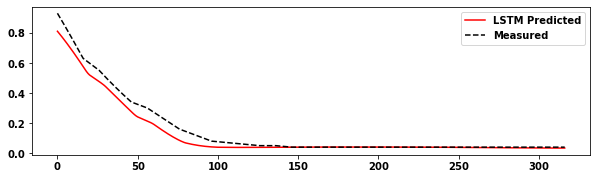

The R2 score of the Training set of  predicted values to predict is :	0.9142
The R2 score of the Testing set predicted values to predict is :	0.8909
Epoch 1/500
89/89 [==============================] - 9s 96ms/step - loss: 0.1423 - accuracy: 0.0000e+00 - val_loss: 0.0342 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0440 - accuracy: 0.0000e+00 - val_loss: 0.0348 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0381 - accuracy: 0.0000e+00 - val_loss: 0.0313 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0359 - accuracy: 0.0000e+00 - val_loss: 0.0297 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0332 - accuracy: 0.0000e+00 - val_loss: 0.0354 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0240 - accuracy: 0.0000e+

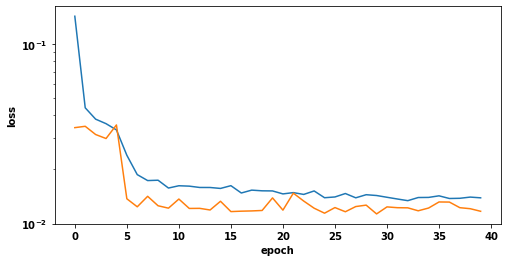

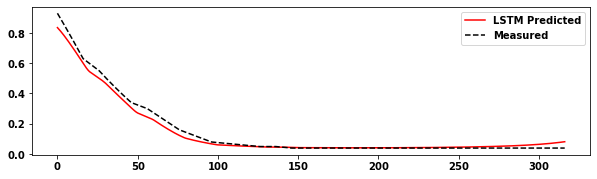

The R2 score of the Training set is :	0.9263
The R2 score of the Testing set is :	0.9827
5 4 90 0.9263109455015377
5 4 90 0.9826878247606908


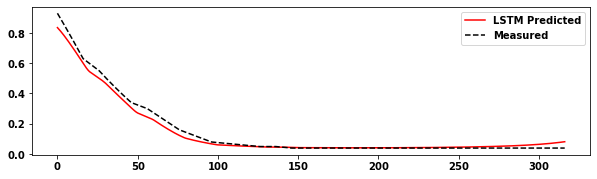

The R2 score of the Training set of  predicted values to predict is :	0.9263
The R2 score of the Testing set predicted values to predict is :	0.8754
Epoch 1/500
89/89 [==============================] - 3s 32ms/step - loss: 0.3818 - accuracy: 0.0000e+00 - val_loss: 0.0626 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0938 - accuracy: 0.0000e+00 - val_loss: 0.0493 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0697 - accuracy: 0.0000e+00 - val_loss: 0.0467 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0608 - accuracy: 0.0000e+00 - val_loss: 0.0457 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0563 - accuracy: 0.0000e+00 - val_loss: 0.0384 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 10ms/step - loss: 0.0555 - accuracy: 0.0000e+

89/89 [==============================] - 1s 12ms/step - loss: 0.0184 - accuracy: 0.0000e+00 - val_loss: 0.0157 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0177 - accuracy: 0.0000e+00 - val_loss: 0.0146 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0179 - accuracy: 0.0000e+00 - val_loss: 0.0147 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0175 - accuracy: 0.0000e+00 - val_loss: 0.0145 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0179 - accuracy: 0.0000e+00 - val_loss: 0.0151 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0140 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0167 - accuracy: 0.0000e+00 - 

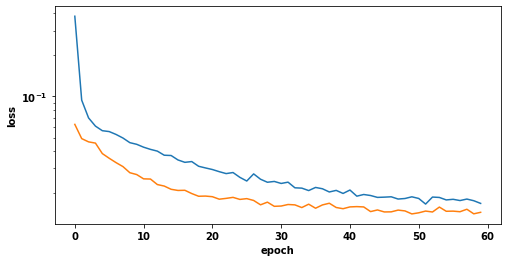

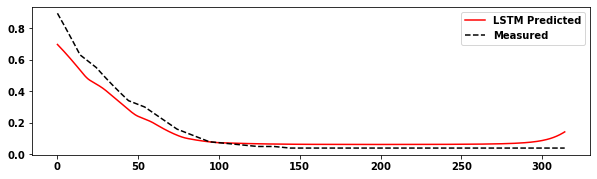

The R2 score of the Training set is :	0.9253
The R2 score of the Testing set is :	0.9284
2 6 10 0.9252698559870131
2 6 10 0.9284109697844505


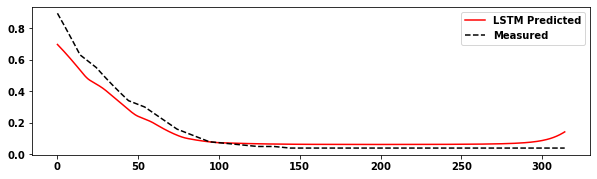

The R2 score of the Training set of  predicted values to predict is :	0.9253
The R2 score of the Testing set predicted values to predict is :	0.7737
Epoch 1/500
89/89 [==============================] - 4s 47ms/step - loss: 0.2998 - accuracy: 0.0000e+00 - val_loss: 0.0556 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0946 - accuracy: 0.0000e+00 - val_loss: 0.0468 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0749 - accuracy: 0.0000e+00 - val_loss: 0.0378 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0650 - accuracy: 0.0000e+00 - val_loss: 0.0383 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0634 - accuracy: 0.0000e+00 - val_loss: 0.0368 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0620 - accuracy: 0.0000e+

89/89 [==============================] - 1s 12ms/step - loss: 0.0181 - accuracy: 0.0000e+00 - val_loss: 0.0145 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0139 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0138 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0172 - accuracy: 0.0000e+00 - val_loss: 0.0134 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0173 - accuracy: 0.0000e+00 - val_loss: 0.0140 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0180 - accuracy: 0.0000e+00 - val_loss: 0.0136 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0168 - accuracy: 0.0000e+00 - 

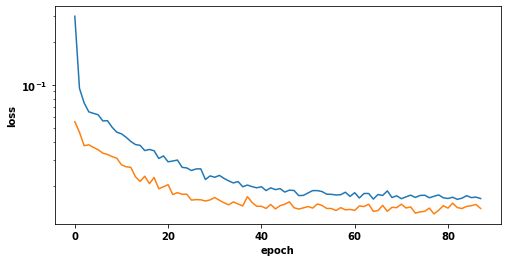

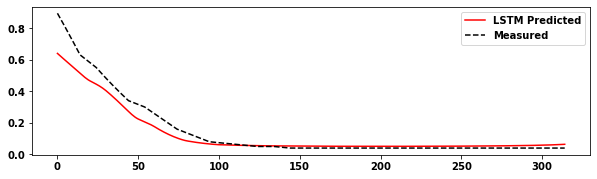

The R2 score of the Training set is :	0.9237
The R2 score of the Testing set is :	0.9141
3 6 10 0.9237496732521289
3 6 10 0.9140985466515494


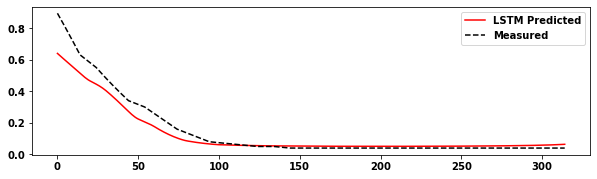

The R2 score of the Training set of  predicted values to predict is :	0.9237
The R2 score of the Testing set predicted values to predict is :	0.7458
Epoch 1/500
89/89 [==============================] - 6s 70ms/step - loss: 0.3214 - accuracy: 0.0000e+00 - val_loss: 0.0479 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0916 - accuracy: 0.0000e+00 - val_loss: 0.0439 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0763 - accuracy: 0.0000e+00 - val_loss: 0.0391 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0693 - accuracy: 0.0000e+00 - val_loss: 0.0403 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0673 - accuracy: 0.0000e+00 - val_loss: 0.0367 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0662 - accuracy: 0.0000e+

89/89 [==============================] - 2s 18ms/step - loss: 0.0193 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0177 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0181 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0175 - accuracy: 0.0000e+00 - val_loss: 0.0106 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0169 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0170 - accuracy: 0.0000e+00 - 

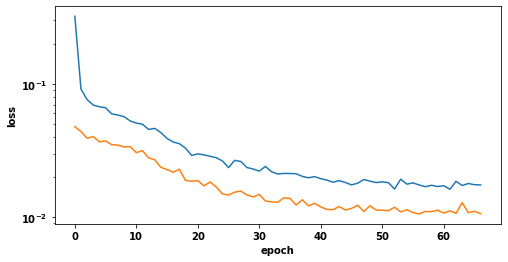

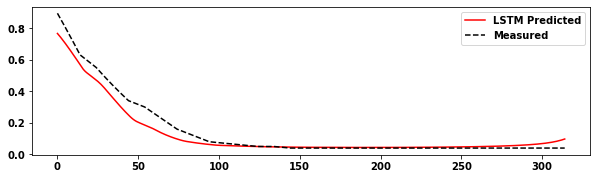

The R2 score of the Training set is :	0.9295
The R2 score of the Testing set is :	0.9437
4 6 10 0.9295173299783455
4 6 10 0.9436900190825726


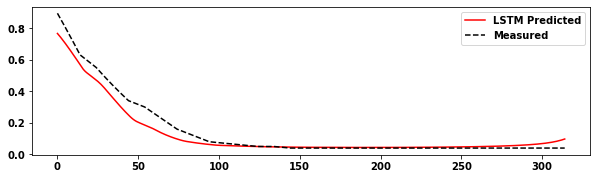

The R2 score of the Training set of  predicted values to predict is :	0.9295
The R2 score of the Testing set predicted values to predict is :	0.8745
Epoch 1/500
89/89 [==============================] - 6s 71ms/step - loss: 0.3012 - accuracy: 0.0000e+00 - val_loss: 0.0624 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 21ms/step - loss: 0.1093 - accuracy: 0.0000e+00 - val_loss: 0.0480 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0862 - accuracy: 0.0000e+00 - val_loss: 0.0414 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0756 - accuracy: 0.0000e+00 - val_loss: 0.0403 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0729 - accuracy: 0.0000e+00 - val_loss: 0.0399 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0686 - accuracy: 0.0000e+

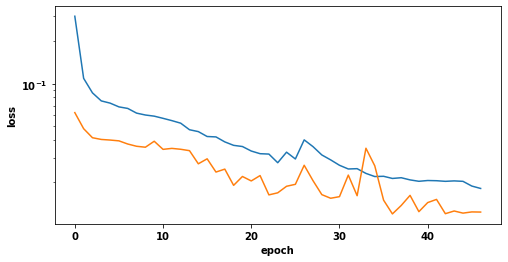

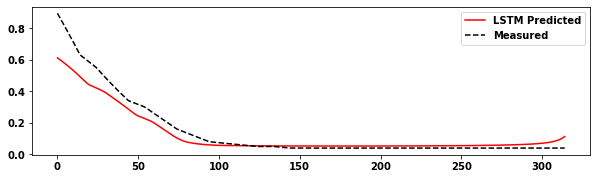

The R2 score of the Training set is :	0.9325
The R2 score of the Testing set is :	0.8974
5 6 10 0.9325020935368569
5 6 10 0.8973793894772746


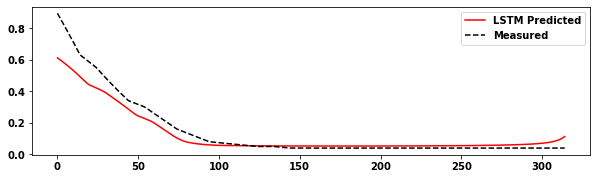

The R2 score of the Training set of  predicted values to predict is :	0.9325
The R2 score of the Testing set predicted values to predict is :	0.7614
Epoch 1/500
89/89 [==============================] - 3s 37ms/step - loss: 0.2161 - accuracy: 0.0000e+00 - val_loss: 0.0364 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0570 - accuracy: 0.0000e+00 - val_loss: 0.0406 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0500 - accuracy: 0.0000e+00 - val_loss: 0.0332 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0455 - accuracy: 0.0000e+00 - val_loss: 0.0329 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0443 - accuracy: 0.0000e+00 - val_loss: 0.0371 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 11ms/step - loss: 0.0439 - accuracy: 0.0000e+

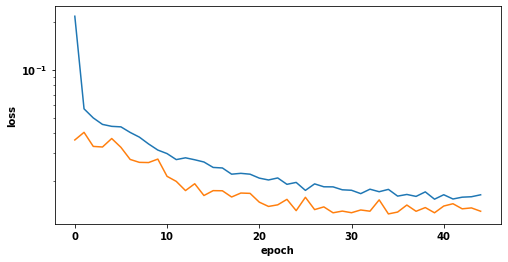

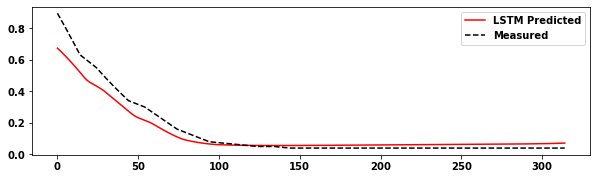

The R2 score of the Training set is :	0.9215
The R2 score of the Testing set is :	0.9201
2 6 20 0.9214838937269134
2 6 20 0.9200684827888421


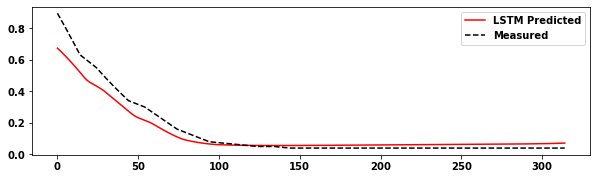

The R2 score of the Training set of  predicted values to predict is :	0.9215
The R2 score of the Testing set predicted values to predict is :	0.8092
Epoch 1/500
89/89 [==============================] - 4s 47ms/step - loss: 0.2316 - accuracy: 0.0000e+00 - val_loss: 0.0474 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0643 - accuracy: 0.0000e+00 - val_loss: 0.0438 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0562 - accuracy: 0.0000e+00 - val_loss: 0.0365 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0519 - accuracy: 0.0000e+00 - val_loss: 0.0347 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0488 - accuracy: 0.0000e+00 - val_loss: 0.0408 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0453 - accuracy: 0.0000e+

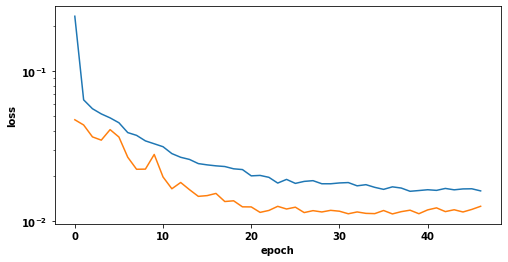

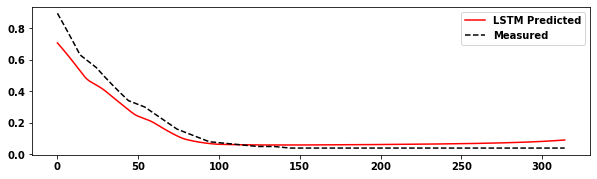

The R2 score of the Training set is :	0.9232
The R2 score of the Testing set is :	0.9302
3 6 20 0.9232241542636686
3 6 20 0.9301621138941399


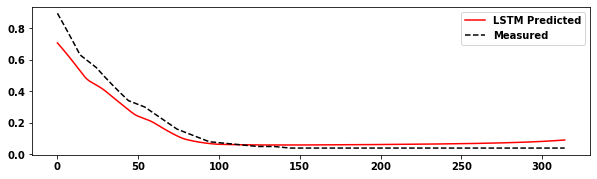

The R2 score of the Training set of  predicted values to predict is :	0.9232
The R2 score of the Testing set predicted values to predict is :	0.8082
Epoch 1/500
89/89 [==============================] - 5s 53ms/step - loss: 0.2052 - accuracy: 0.0000e+00 - val_loss: 0.0438 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0624 - accuracy: 0.0000e+00 - val_loss: 0.0442 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0557 - accuracy: 0.0000e+00 - val_loss: 0.0392 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0537 - accuracy: 0.0000e+00 - val_loss: 0.0483 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0522 - accuracy: 0.0000e+00 - val_loss: 0.0409 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0502 - accuracy: 0.0000e+

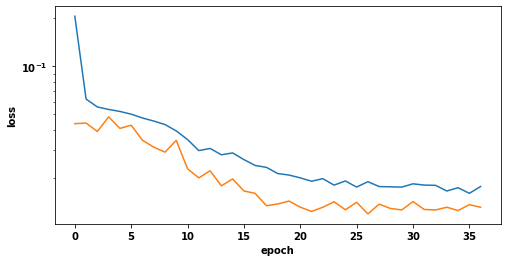

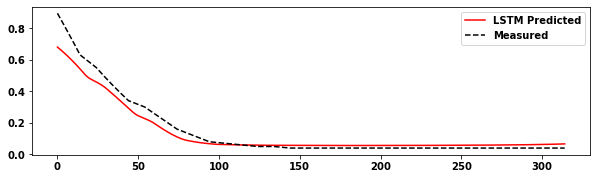

The R2 score of the Training set is :	0.9239
The R2 score of the Testing set is :	0.9403
4 6 20 0.9238781968256002
4 6 20 0.9403135588432395


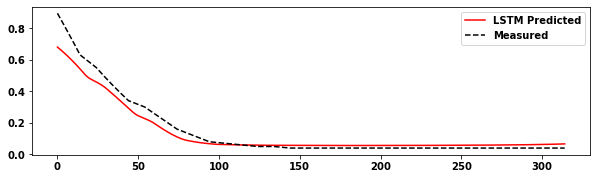

The R2 score of the Training set of  predicted values to predict is :	0.9239
The R2 score of the Testing set predicted values to predict is :	0.8066
Epoch 1/500
89/89 [==============================] - 6s 67ms/step - loss: 0.2355 - accuracy: 0.0000e+00 - val_loss: 0.0527 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0696 - accuracy: 0.0000e+00 - val_loss: 0.0395 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0604 - accuracy: 0.0000e+00 - val_loss: 0.0384 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0589 - accuracy: 0.0000e+00 - val_loss: 0.0411 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0553 - accuracy: 0.0000e+00 - val_loss: 0.0443 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0524 - accuracy: 0.0000e+

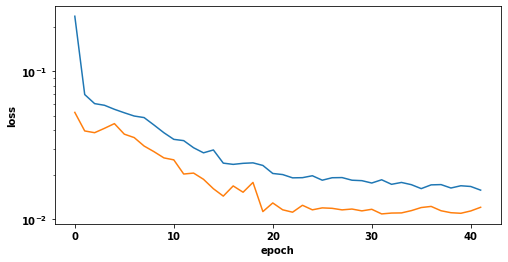

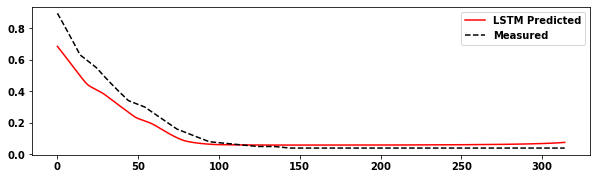

The R2 score of the Training set is :	0.9224
The R2 score of the Testing set is :	0.9058
5 6 20 0.9224244484019734
5 6 20 0.9058356552393234


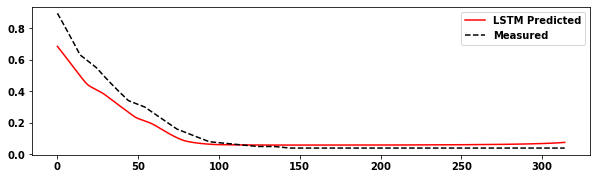

The R2 score of the Training set of  predicted values to predict is :	0.9224
The R2 score of the Testing set predicted values to predict is :	0.8023
Epoch 1/500
89/89 [==============================] - 3s 37ms/step - loss: 0.1524 - accuracy: 0.0000e+00 - val_loss: 0.0329 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0465 - accuracy: 0.0000e+00 - val_loss: 0.0424 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0421 - accuracy: 0.0000e+00 - val_loss: 0.0336 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0411 - accuracy: 0.0000e+00 - val_loss: 0.0337 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0367 - accuracy: 0.0000e+00 - val_loss: 0.0386 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0366 - accuracy: 0.0000e+

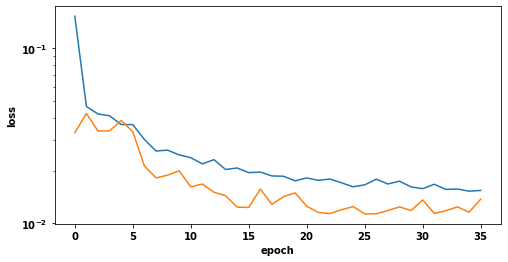

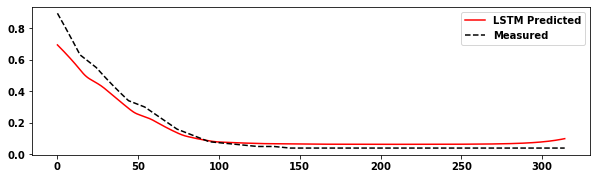

The R2 score of the Training set is :	0.9225
The R2 score of the Testing set is :	0.9388
2 6 30 0.9225499610395709
2 6 30 0.9387590972696314


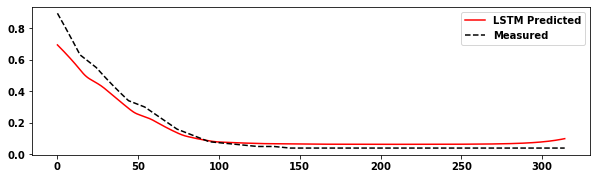

The R2 score of the Training set of  predicted values to predict is :	0.9225
The R2 score of the Testing set predicted values to predict is :	0.8457
Epoch 1/500
89/89 [==============================] - 4s 49ms/step - loss: 0.1526 - accuracy: 0.0000e+00 - val_loss: 0.0402 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0530 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0494 - accuracy: 0.0000e+00 - val_loss: 0.0377 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0468 - accuracy: 0.0000e+00 - val_loss: 0.0384 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0444 - accuracy: 0.0000e+00 - val_loss: 0.0406 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0424 - accuracy: 0.0000e+

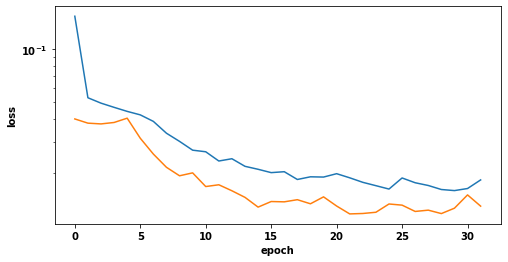

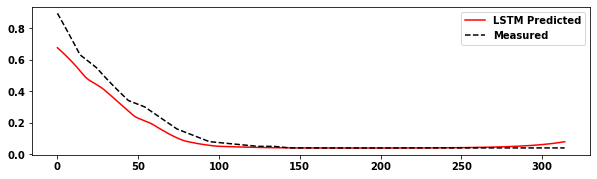

The R2 score of the Training set is :	0.9230
The R2 score of the Testing set is :	0.9278
3 6 30 0.9230102880474501
3 6 30 0.9277856914485585


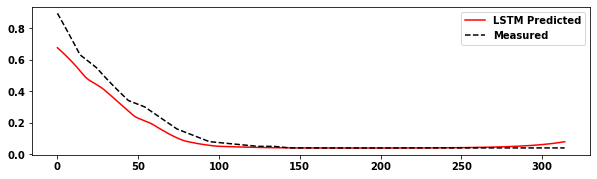

The R2 score of the Training set of  predicted values to predict is :	0.9230
The R2 score of the Testing set predicted values to predict is :	0.8020
Epoch 1/500
89/89 [==============================] - 5s 56ms/step - loss: 0.1982 - accuracy: 0.0000e+00 - val_loss: 0.0407 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0546 - accuracy: 0.0000e+00 - val_loss: 0.0363 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0512 - accuracy: 0.0000e+00 - val_loss: 0.0358 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0487 - accuracy: 0.0000e+00 - val_loss: 0.0504 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0463 - accuracy: 0.0000e+00 - val_loss: 0.0378 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0437 - accuracy: 0.0000e+

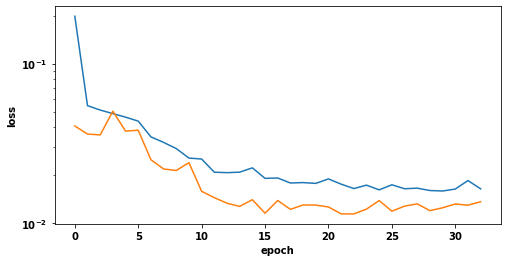

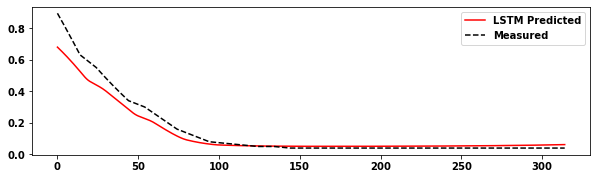

The R2 score of the Training set is :	0.9227
The R2 score of the Testing set is :	0.9339
4 6 30 0.9226988620295496
4 6 30 0.9338757735468172


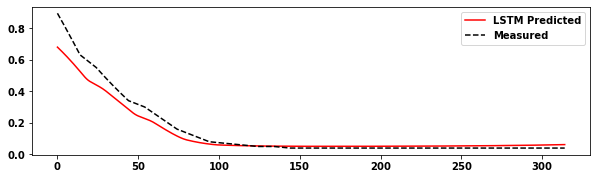

The R2 score of the Training set of  predicted values to predict is :	0.9227
The R2 score of the Testing set predicted values to predict is :	0.8181
Epoch 1/500
89/89 [==============================] - 7s 84ms/step - loss: 0.1941 - accuracy: 0.0000e+00 - val_loss: 0.0452 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0601 - accuracy: 0.0000e+00 - val_loss: 0.0375 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0553 - accuracy: 0.0000e+00 - val_loss: 0.0363 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0488 - accuracy: 0.0000e+00 - val_loss: 0.0446 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0479 - accuracy: 0.0000e+00 - val_loss: 0.0392 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0473 - accuracy: 0.0000e+

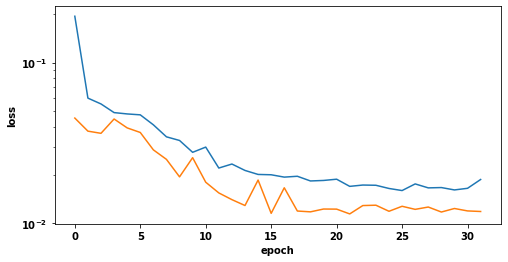

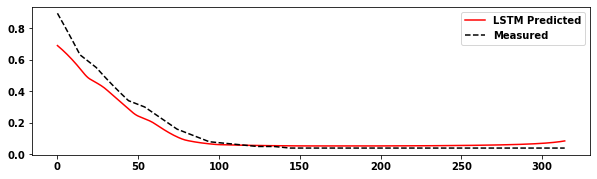

The R2 score of the Training set is :	0.9271
The R2 score of the Testing set is :	0.9406
5 6 30 0.9271013410989718
5 6 30 0.9406205760975451


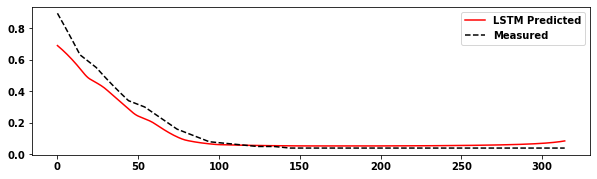

The R2 score of the Training set of  predicted values to predict is :	0.9271
The R2 score of the Testing set predicted values to predict is :	0.8294
Epoch 1/500
89/89 [==============================] - 4s 47ms/step - loss: 0.1284 - accuracy: 0.0000e+00 - val_loss: 0.0374 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0452 - accuracy: 0.0000e+00 - val_loss: 0.0341 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0419 - accuracy: 0.0000e+00 - val_loss: 0.0325 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0370 - accuracy: 0.0000e+00 - val_loss: 0.0328 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0328 - accuracy: 0.0000e+00 - val_loss: 0.0297 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0322 - accuracy: 0.0000e+

89/89 [==============================] - 2s 26ms/step - loss: 0.0138 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0136 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0134 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 00057: early stopping
Runtime: 119.98 s


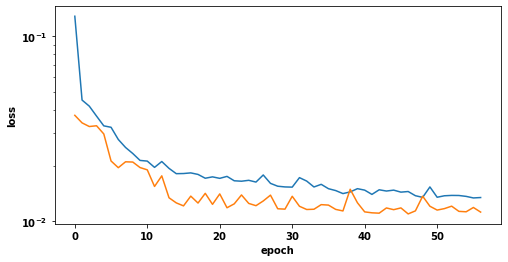

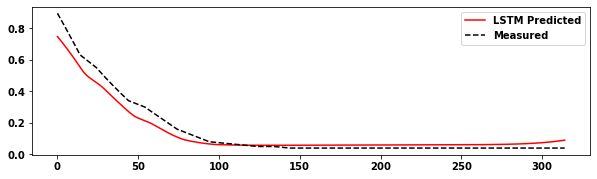

The R2 score of the Training set is :	0.9291
The R2 score of the Testing set is :	0.9441
2 6 40 0.9291472339760151
2 6 40 0.9441000016599476


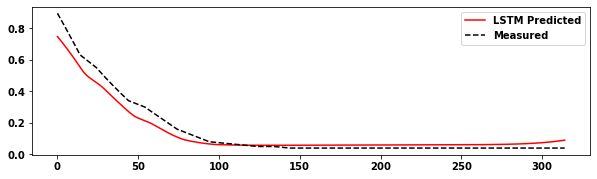

The R2 score of the Training set of  predicted values to predict is :	0.9291
The R2 score of the Testing set predicted values to predict is :	0.8610
Epoch 1/500
89/89 [==============================] - 6s 66ms/step - loss: 0.1540 - accuracy: 0.0000e+00 - val_loss: 0.0356 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0480 - accuracy: 0.0000e+00 - val_loss: 0.0362 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0457 - accuracy: 0.0000e+00 - val_loss: 0.0349 - val_accuracy: 0.0000e+00ccuracy
Epoch 4/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0441 - accuracy: 0.0000e+00 - val_loss: 0.0443 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0399 - accuracy: 0.0000e+00 - val_loss: 0.0347 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0375 - accuracy: 0

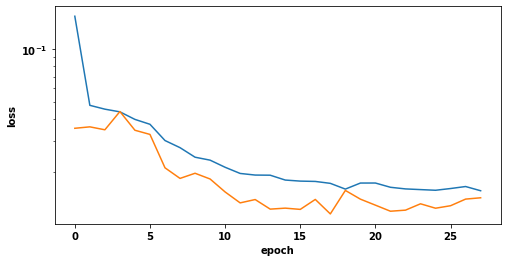

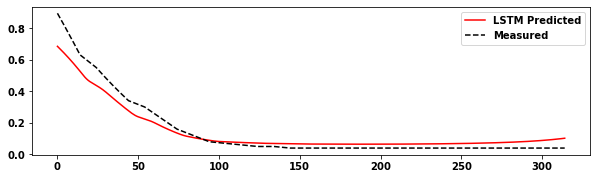

The R2 score of the Training set is :	0.9189
The R2 score of the Testing set is :	0.9222
3 6 40 0.9189352992050279
3 6 40 0.9222278140447163


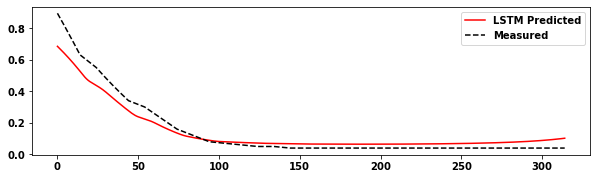

The R2 score of the Training set of  predicted values to predict is :	0.9189
The R2 score of the Testing set predicted values to predict is :	0.8000
Epoch 1/500
89/89 [==============================] - 6s 65ms/step - loss: 0.1705 - accuracy: 0.0000e+00 - val_loss: 0.0393 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0540 - accuracy: 0.0000e+00 - val_loss: 0.0374 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0487 - accuracy: 0.0000e+00 - val_loss: 0.0396 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0454 - accuracy: 0.0000e+00 - val_loss: 0.0453 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0444 - accuracy: 0.0000e+00 - val_loss: 0.0452 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0414 - accuracy: 0.0000e+

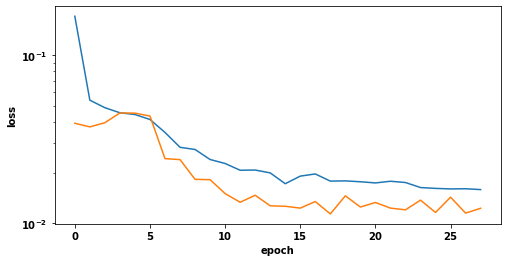

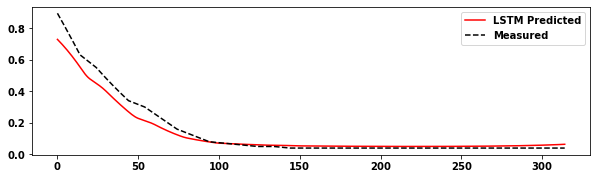

The R2 score of the Training set is :	0.9233
The R2 score of the Testing set is :	0.9483
4 6 40 0.9232611763914672
4 6 40 0.9483320936658157


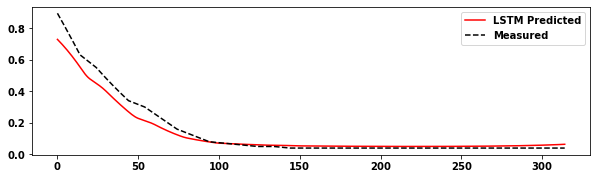

The R2 score of the Training set of  predicted values to predict is :	0.9233
The R2 score of the Testing set predicted values to predict is :	0.8451
Epoch 1/500
89/89 [==============================] - 7s 84ms/step - loss: 0.1760 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0561 - accuracy: 0.0000e+00 - val_loss: 0.0376 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0511 - accuracy: 0.0000e+00 - val_loss: 0.0363 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0475 - accuracy: 0.0000e+00 - val_loss: 0.0401 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0421 - accuracy: 0.0000e+00 - val_loss: 0.0359 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0388 - accuracy: 0.0000e+

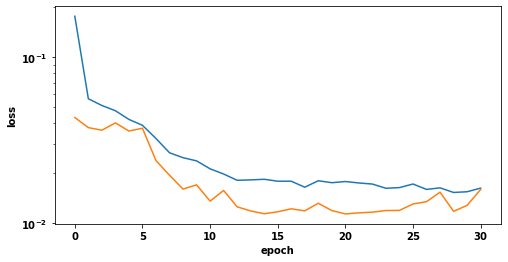

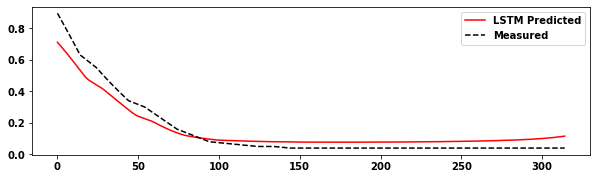

The R2 score of the Training set is :	0.9084
The R2 score of the Testing set is :	0.9161
5 6 40 0.9083701590401742
5 6 40 0.9160502797716363


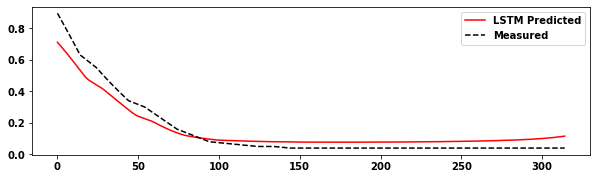

The R2 score of the Training set of  predicted values to predict is :	0.9084
The R2 score of the Testing set predicted values to predict is :	0.7989
Epoch 1/500
89/89 [==============================] - 5s 55ms/step - loss: 0.1198 - accuracy: 0.0000e+00 - val_loss: 0.0321 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0431 - accuracy: 0.0000e+00 - val_loss: 0.0313 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0398 - accuracy: 0.0000e+00 - val_loss: 0.0292 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0353 - accuracy: 0.0000e+00 - val_loss: 0.0326 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0313 - accuracy: 0.0000e+00 - val_loss: 0.0306 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0304 - accuracy: 0.0000e+

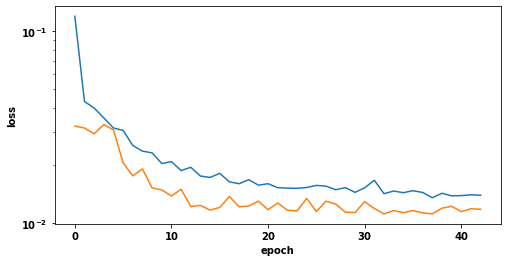

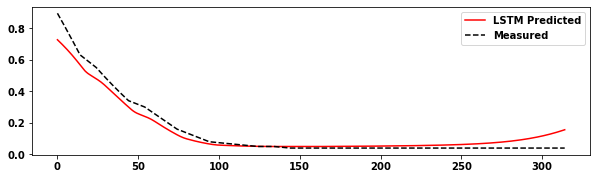

The R2 score of the Training set is :	0.9269
The R2 score of the Testing set is :	0.9463
2 6 50 0.9268747562112674
2 6 50 0.946341485350672


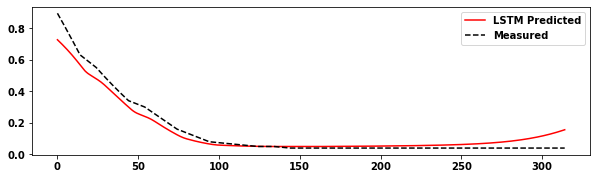

The R2 score of the Training set of  predicted values to predict is :	0.9269
The R2 score of the Testing set predicted values to predict is :	0.8423
Epoch 1/500
89/89 [==============================] - 7s 78ms/step - loss: 0.1286 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0463 - accuracy: 0.0000e+00 - val_loss: 0.0340 - val_accuracy: 0.0000e+00- loss: 0.0397 
Epoch 3/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0434 - accuracy: 0.0000e+00 - val_loss: 0.0321 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0404 - accuracy: 0.0000e+00 - val_loss: 0.0345 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0364 - accuracy: 0.0000e+00 - val_loss: 0.0303 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0338 - acc

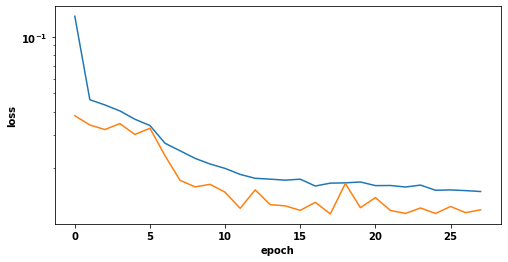

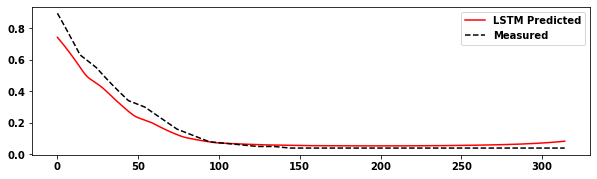

The R2 score of the Training set is :	0.9256
The R2 score of the Testing set is :	0.9482
3 6 50 0.9255931688851051
3 6 50 0.948178343013118


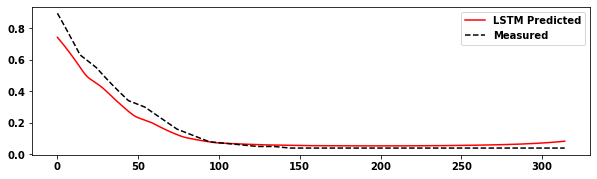

The R2 score of the Training set of  predicted values to predict is :	0.9256
The R2 score of the Testing set predicted values to predict is :	0.8664
Epoch 1/500
89/89 [==============================] - 8s 87ms/step - loss: 0.1605 - accuracy: 0.0000e+00 - val_loss: 0.0422 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 44ms/step - loss: 0.0497 - accuracy: 0.0000e+00 - val_loss: 0.0358 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 43ms/step - loss: 0.0487 - accuracy: 0.0000e+00 - val_loss: 0.0343 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 43ms/step - loss: 0.0448 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 43ms/step - loss: 0.0432 - accuracy: 0.0000e+00 - val_loss: 0.0400 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 43ms/step - loss: 0.0412 - accuracy: 0.0000e+

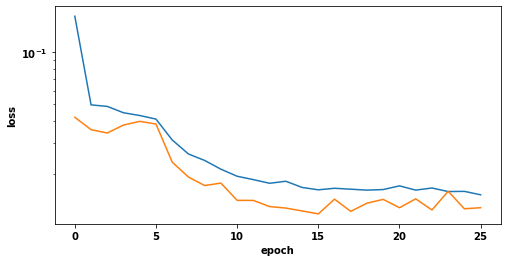

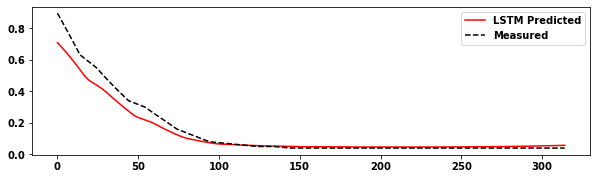

The R2 score of the Training set is :	0.9242
The R2 score of the Testing set is :	0.9415
4 6 50 0.9242474366181999
4 6 50 0.9415331537571779


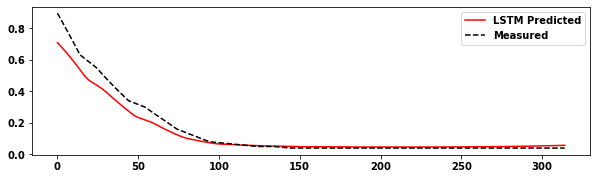

The R2 score of the Training set of  predicted values to predict is :	0.9242
The R2 score of the Testing set predicted values to predict is :	0.8373
Epoch 1/500
89/89 [==============================] - 9s 102ms/step - loss: 0.1720 - accuracy: 0.0000e+00 - val_loss: 0.0434 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0549 - accuracy: 0.0000e+00 - val_loss: 0.0370 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0501 - accuracy: 0.0000e+00 - val_loss: 0.0356 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 51ms/step - loss: 0.0453 - accuracy: 0.0000e+00 - val_loss: 0.0356 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 51ms/step - loss: 0.0432 - accuracy: 0.0000e+00 - val_loss: 0.0508 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 51ms/step - loss: 0.0387 - accuracy: 0.0000e

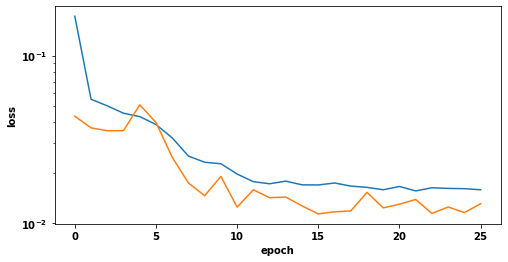

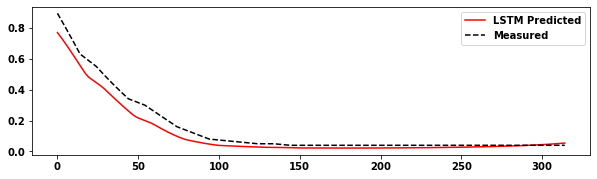

The R2 score of the Training set is :	0.9156
The R2 score of the Testing set is :	0.9400
5 6 50 0.9155504738922637
5 6 50 0.9400047190671327


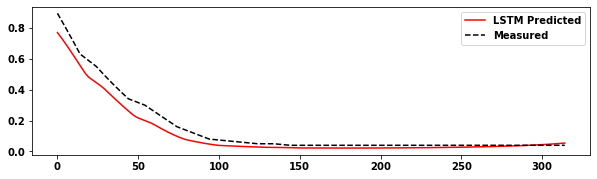

The R2 score of the Training set of  predicted values to predict is :	0.9156
The R2 score of the Testing set predicted values to predict is :	0.8293
Epoch 1/500
89/89 [==============================] - 5s 54ms/step - loss: 0.0973 - accuracy: 0.0000e+00 - val_loss: 0.0330 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0408 - accuracy: 0.0000e+00 - val_loss: 0.0309 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 28ms/step - loss: 0.0367 - accuracy: 0.0000e+00 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0325 - accuracy: 0.0000e+00 - val_loss: 0.0277 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0290 - accuracy: 0.0000e+00 - val_loss: 0.0365 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0293 - accuracy: 0.0000e+

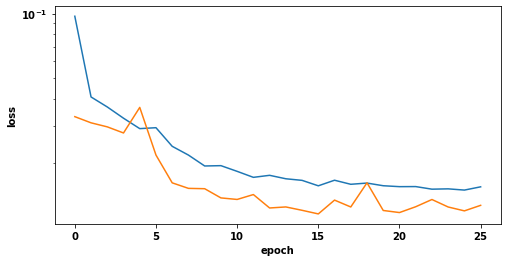

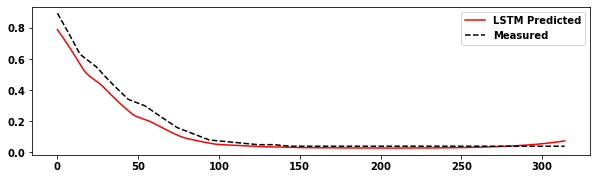

The R2 score of the Training set is :	0.9200
The R2 score of the Testing set is :	0.9562
2 6 60 0.9199550635499318
2 6 60 0.9561598418590943


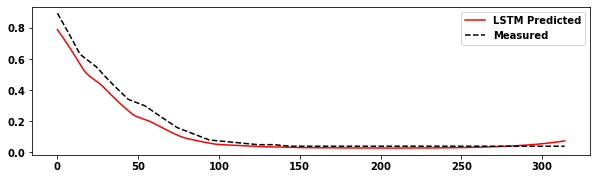

The R2 score of the Training set of  predicted values to predict is :	0.9200
The R2 score of the Testing set predicted values to predict is :	0.9043
Epoch 1/500
89/89 [==============================] - 6s 72ms/step - loss: 0.1272 - accuracy: 0.0000e+00 - val_loss: 0.0436 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0459 - accuracy: 0.0000e+00 - val_loss: 0.0336 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0429 - accuracy: 0.0000e+00 - val_loss: 0.0340 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0377 - accuracy: 0.0000e+00 - val_loss: 0.0303 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0337 - accuracy: 0.0000e+00 - val_loss: 0.0461 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0395 - accuracy: 0.0000e+

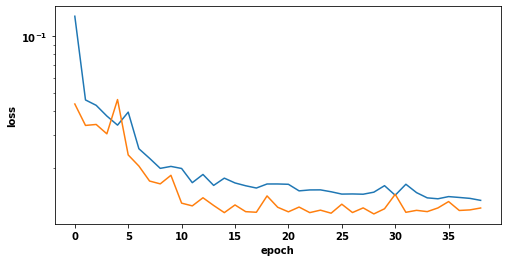

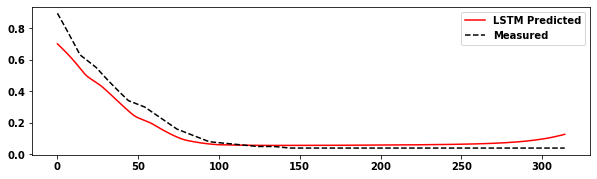

The R2 score of the Training set is :	0.9264
The R2 score of the Testing set is :	0.9292
3 6 60 0.9264136189951806
3 6 60 0.929165783830614


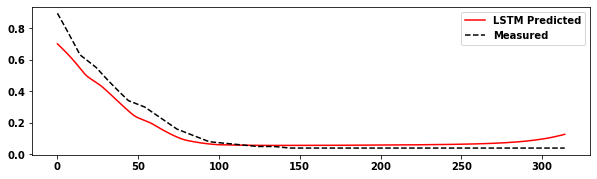

The R2 score of the Training set of  predicted values to predict is :	0.9264
The R2 score of the Testing set predicted values to predict is :	0.7892
Epoch 1/500
89/89 [==============================] - 8s 87ms/step - loss: 0.1497 - accuracy: 0.0000e+00 - val_loss: 0.0441 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 41ms/step - loss: 0.0484 - accuracy: 0.0000e+00 - val_loss: 0.0353 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 41ms/step - loss: 0.0453 - accuracy: 0.0000e+00 - val_loss: 0.0335 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 41ms/step - loss: 0.0391 - accuracy: 0.0000e+00 - val_loss: 0.0304 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 43ms/step - loss: 0.0326 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0325 - accuracy: 0.0000e+

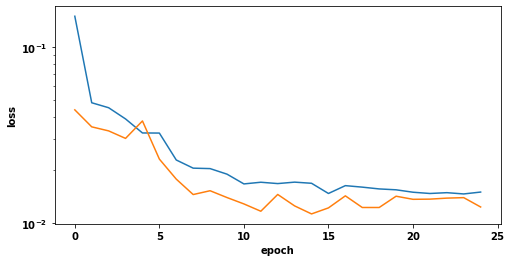

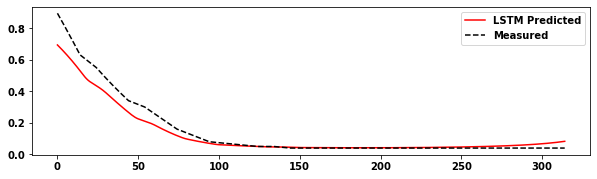

The R2 score of the Training set is :	0.9274
The R2 score of the Testing set is :	0.9308
4 6 60 0.9273521026609289
4 6 60 0.9308149796939245


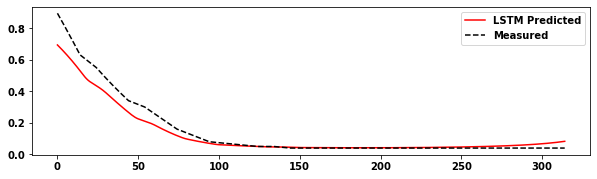

The R2 score of the Training set of  predicted values to predict is :	0.9274
The R2 score of the Testing set predicted values to predict is :	0.8045
Epoch 1/500
89/89 [==============================] - 10s 116ms/step - loss: 0.1522 - accuracy: 0.0000e+00 - val_loss: 0.0418 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 62ms/step - loss: 0.0516 - accuracy: 0.0000e+00 - val_loss: 0.0385 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0475 - accuracy: 0.0000e+00 - val_loss: 0.0347 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0410 - accuracy: 0.0000e+00 - val_loss: 0.0314 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0345 - accuracy: 0.0000e+00 - val_loss: 0.0369 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0340 - accuracy: 0.0000

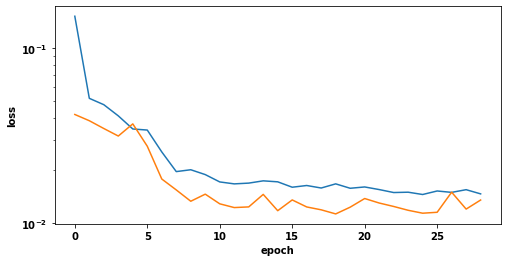

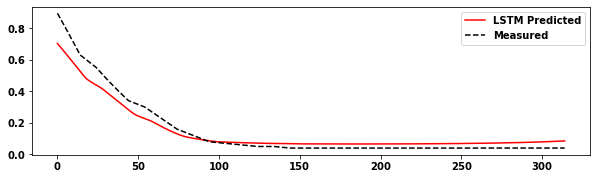

The R2 score of the Training set is :	0.9197
The R2 score of the Testing set is :	0.9291
5 6 60 0.9196570445460479
5 6 60 0.9290755161254917


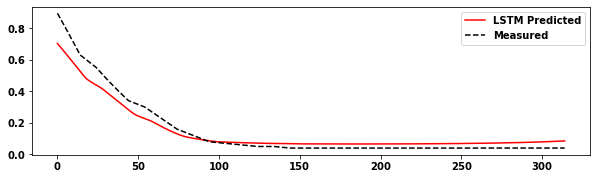

The R2 score of the Training set of  predicted values to predict is :	0.9197
The R2 score of the Testing set predicted values to predict is :	0.8247
Epoch 1/500
89/89 [==============================] - 5s 60ms/step - loss: 0.1161 - accuracy: 0.0000e+00 - val_loss: 0.0351 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0404 - accuracy: 0.0000e+00 - val_loss: 0.0309 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 28ms/step - loss: 0.0364 - accuracy: 0.0000e+00 - val_loss: 0.0278 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0311 - accuracy: 0.0000e+00 - val_loss: 0.0237 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0254 - accuracy: 0.0000e+00 - val_loss: 0.0316 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0292 - accuracy: 0.0000e+

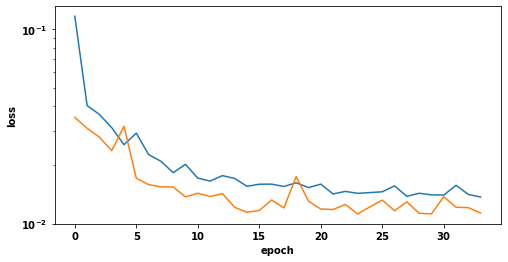

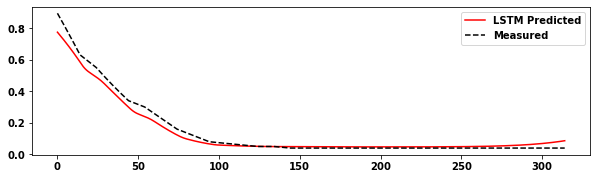

The R2 score of the Training set is :	0.9285
The R2 score of the Testing set is :	0.9736
2 6 70 0.9284901083001044
2 6 70 0.973586374664253


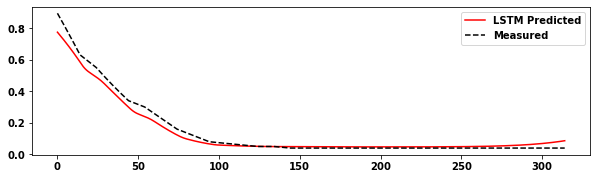

The R2 score of the Training set of  predicted values to predict is :	0.9285
The R2 score of the Testing set predicted values to predict is :	0.8812
Epoch 1/500
89/89 [==============================] - 7s 75ms/step - loss: 0.1185 - accuracy: 0.0000e+00 - val_loss: 0.0361 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0444 - accuracy: 0.0000e+00 - val_loss: 0.0342 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 35ms/step - loss: 0.0420 - accuracy: 0.0000e+00 - val_loss: 0.0312 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0359 - accuracy: 0.0000e+00 - val_loss: 0.0278 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 35ms/step - loss: 0.0299 - accuracy: 0.0000e+00 - val_loss: 0.0229 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0336 - accuracy: 0.0000e+

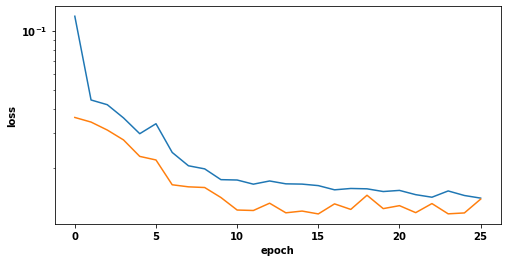

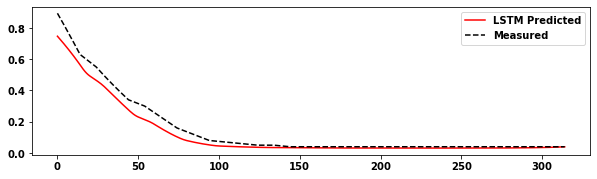

The R2 score of the Training set is :	0.9153
The R2 score of the Testing set is :	0.9526
3 6 70 0.9152635231764353
3 6 70 0.9525933330625251


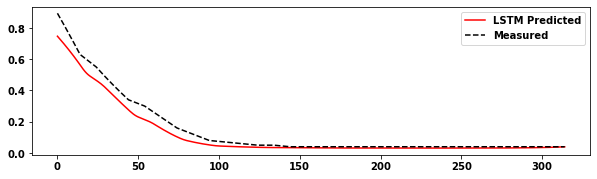

The R2 score of the Training set of  predicted values to predict is :	0.9153
The R2 score of the Testing set predicted values to predict is :	0.8384
Epoch 1/500
89/89 [==============================] - 9s 98ms/step - loss: 0.1372 - accuracy: 0.0000e+00 - val_loss: 0.0414 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0485 - accuracy: 0.0000e+00 - val_loss: 0.0358 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 53ms/step - loss: 0.0457 - accuracy: 0.0000e+00 - val_loss: 0.0338 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 53ms/step - loss: 0.0405 - accuracy: 0.0000e+00 - val_loss: 0.0342 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0347 - accuracy: 0.0000e+00 - val_loss: 0.0308 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 53ms/step - loss: 0.0355 - accuracy: 0.0000e+

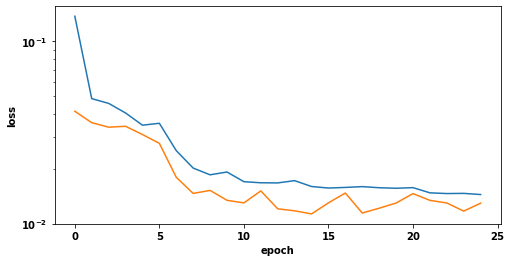

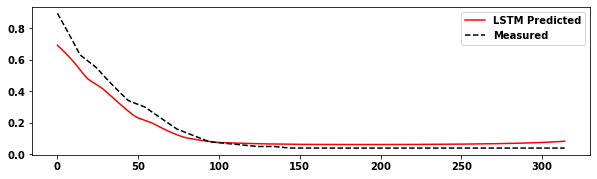

The R2 score of the Training set is :	0.9239
The R2 score of the Testing set is :	0.9298
4 6 70 0.9238705289966194
4 6 70 0.9297906753952591


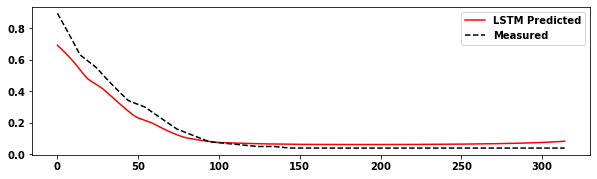

The R2 score of the Training set of  predicted values to predict is :	0.9239
The R2 score of the Testing set predicted values to predict is :	0.8115
Epoch 1/500
89/89 [==============================] - 11s 119ms/step - loss: 0.1467 - accuracy: 0.0000e+00 - val_loss: 0.0480 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 6s 67ms/step - loss: 0.0512 - accuracy: 0.0000e+00 - val_loss: 0.0367 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 6s 62ms/step - loss: 0.0469 - accuracy: 0.0000e+00 - val_loss: 0.0374 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 6s 64ms/step - loss: 0.0395 - accuracy: 0.0000e+00 - val_loss: 0.0262 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 58ms/step - loss: 0.0288 - accuracy: 0.0000e+00 - val_loss: 0.0447 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 61ms/step - loss: 0.0326 - accuracy: 0.0000

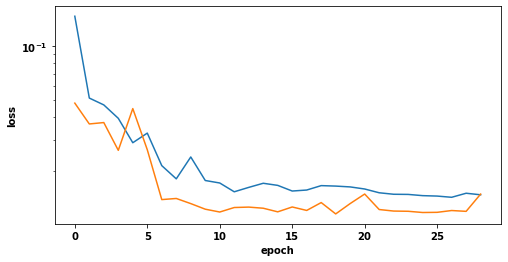

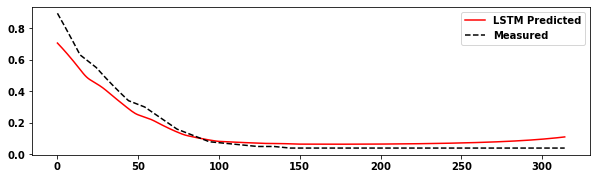

The R2 score of the Training set is :	0.9147
The R2 score of the Testing set is :	0.9329
5 6 70 0.9146802291835479
5 6 70 0.9328894087451903


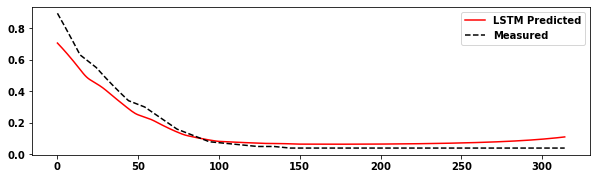

The R2 score of the Training set of  predicted values to predict is :	0.9147
The R2 score of the Testing set predicted values to predict is :	0.8188
Epoch 1/500
89/89 [==============================] - 5s 59ms/step - loss: 0.1058 - accuracy: 0.0000e+00 - val_loss: 0.0332 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0404 - accuracy: 0.0000e+00 - val_loss: 0.0311 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0353 - accuracy: 0.0000e+00 - val_loss: 0.0305 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0298 - accuracy: 0.0000e+00 - val_loss: 0.0225 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0270 - accuracy: 0.0000e+00 - val_loss: 0.0298 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 32ms/step - loss: 0.0310 - accuracy: 0.0000e+

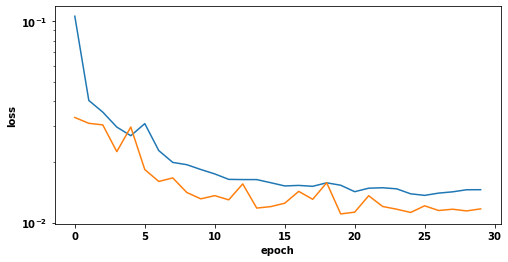

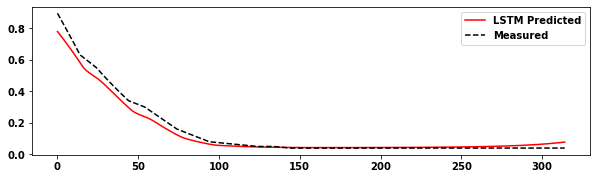

The R2 score of the Training set is :	0.9274
The R2 score of the Testing set is :	0.9737
2 6 80 0.9274392469798477
2 6 80 0.9736943492999419


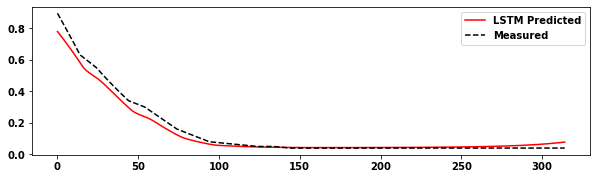

The R2 score of the Training set of  predicted values to predict is :	0.9274
The R2 score of the Testing set predicted values to predict is :	0.8997
Epoch 1/500
89/89 [==============================] - 8s 89ms/step - loss: 0.1119 - accuracy: 0.0000e+00 - val_loss: 0.0387 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0443 - accuracy: 0.0000e+00 - val_loss: 0.0353 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0408 - accuracy: 0.0000e+00 - val_loss: 0.0331 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0351 - accuracy: 0.0000e+00 - val_loss: 0.0275 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0280 - accuracy: 0.0000e+00 - val_loss: 0.0521 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 50ms/step - loss: 0.0377 - accuracy: 0.0000e+

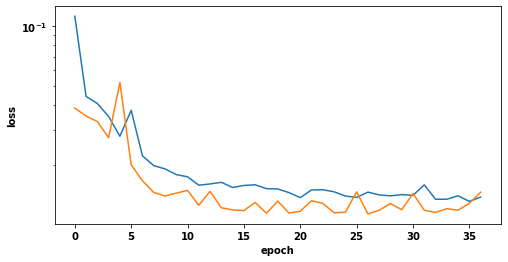

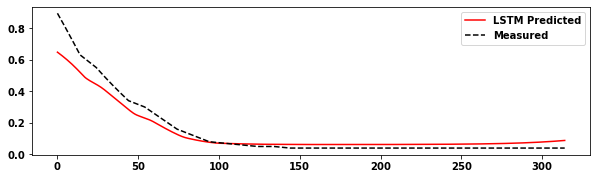

The R2 score of the Training set is :	0.9156
The R2 score of the Testing set is :	0.9207
3 6 80 0.9155992743661507
3 6 80 0.9206985405451643


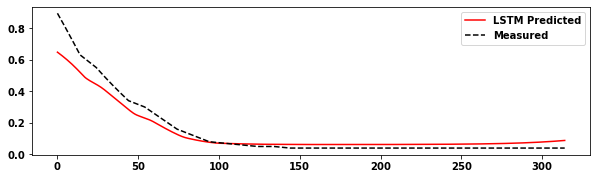

The R2 score of the Training set of  predicted values to predict is :	0.9156
The R2 score of the Testing set predicted values to predict is :	0.7969
Epoch 1/500
89/89 [==============================] - 10s 109ms/step - loss: 0.1243 - accuracy: 0.0000e+00 - val_loss: 0.0383 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 58ms/step - loss: 0.0476 - accuracy: 0.0000e+00 - val_loss: 0.0367 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 57ms/step - loss: 0.0434 - accuracy: 0.0000e+00 - val_loss: 0.0343 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 58ms/step - loss: 0.0394 - accuracy: 0.0000e+00 - val_loss: 0.0327 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 57ms/step - loss: 0.0321 - accuracy: 0.0000e+00 - val_loss: 0.0467 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 57ms/step - loss: 0.0406 - accuracy: 0.0000

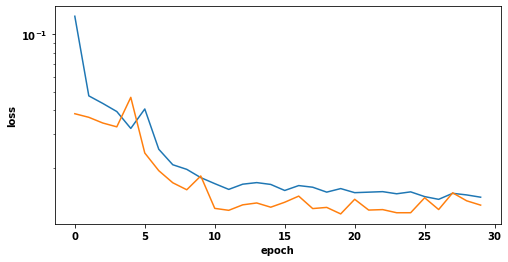

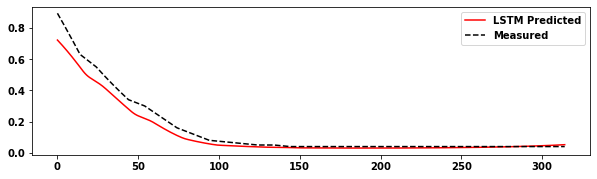

The R2 score of the Training set is :	0.9195
The R2 score of the Testing set is :	0.9483
4 6 80 0.9194727916689613
4 6 80 0.9483060666887215


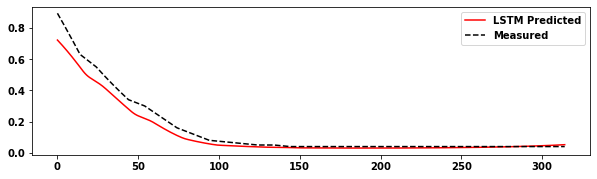

The R2 score of the Training set of  predicted values to predict is :	0.9195
The R2 score of the Testing set predicted values to predict is :	0.8467
Epoch 1/500
89/89 [==============================] - 10s 117ms/step - loss: 0.1364 - accuracy: 0.0000e+00 - val_loss: 0.0434 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 6s 64ms/step - loss: 0.0506 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 6s 63ms/step - loss: 0.0464 - accuracy: 0.0000e+00 - val_loss: 0.0355 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 6s 64ms/step - loss: 0.0414 - accuracy: 0.0000e+00 - val_loss: 0.0344 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 9s 99ms/step - loss: 0.0316 - accuracy: 0.0000e+00 - val_loss: 0.0503 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 6s 66ms/step - loss: 0.0334 - accuracy: 0.0000

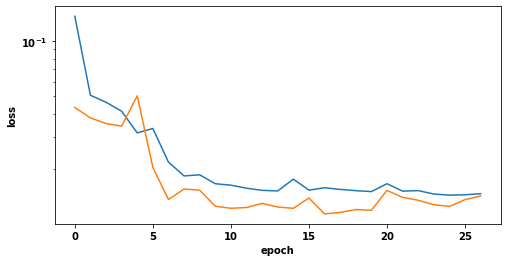

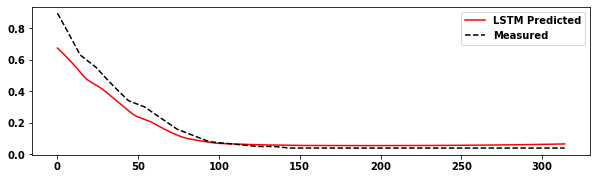

The R2 score of the Training set is :	0.9208
The R2 score of the Testing set is :	0.9280
5 6 80 0.9208097650479686
5 6 80 0.928024514093193


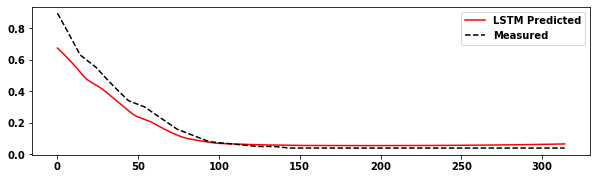

The R2 score of the Training set of  predicted values to predict is :	0.9208
The R2 score of the Testing set predicted values to predict is :	0.7781
Epoch 1/500
89/89 [==============================] - 6s 66ms/step - loss: 0.0885 - accuracy: 0.0000e+00 - val_loss: 0.0325 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0386 - accuracy: 0.0000e+00 - val_loss: 0.0335 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0349 - accuracy: 0.0000e+00 - val_loss: 0.0285 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 41ms/step - loss: 0.0290 - accuracy: 0.0000e+00 - val_loss: 0.0249 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0232 - accuracy: 0.0000e+00 - val_loss: 0.0374 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 36ms/step - loss: 0.0304 - accuracy: 0.0000e+

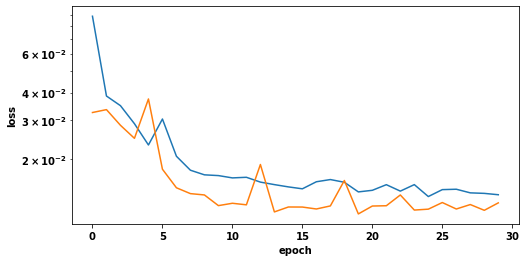

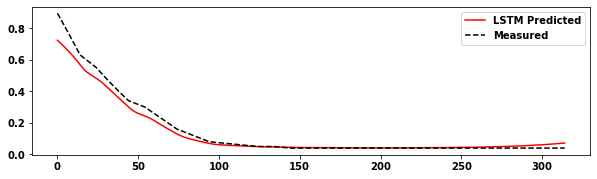

The R2 score of the Training set is :	0.9256
The R2 score of the Testing set is :	0.9671
2 6 90 0.9256183269830237
2 6 90 0.967134717591105


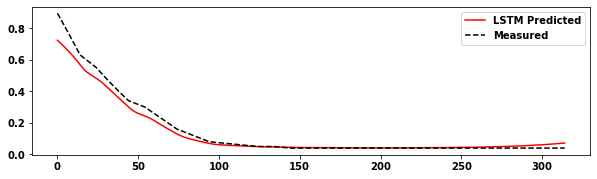

The R2 score of the Training set of  predicted values to predict is :	0.9256
The R2 score of the Testing set predicted values to predict is :	0.8646
Epoch 1/500
89/89 [==============================] - 7s 75ms/step - loss: 0.1065 - accuracy: 0.0000e+00 - val_loss: 0.0390 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 44ms/step - loss: 0.0437 - accuracy: 0.0000e+00 - val_loss: 0.0334 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0389 - accuracy: 0.0000e+00 - val_loss: 0.0298 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0318 - accuracy: 0.0000e+00 - val_loss: 0.0230 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 47ms/step - loss: 0.0262 - accuracy: 0.0000e+00 - val_loss: 0.0523 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0350 - accuracy: 0.0000e+

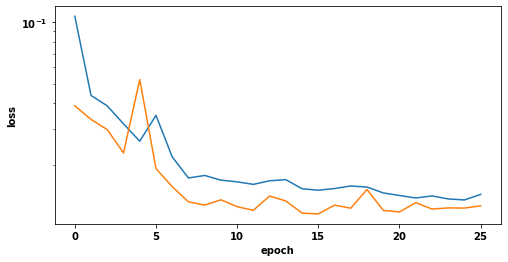

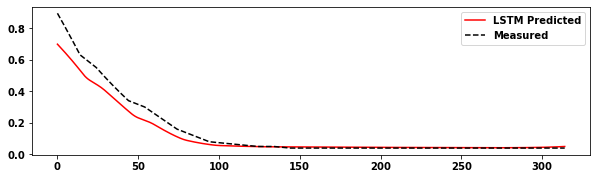

The R2 score of the Training set is :	0.9228
The R2 score of the Testing set is :	0.9374
3 6 90 0.9227777010114716
3 6 90 0.9374220335672985


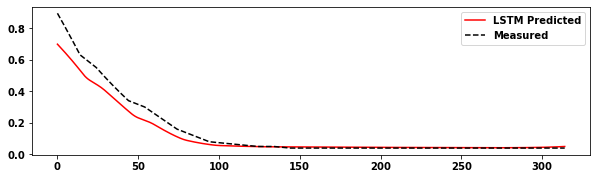

The R2 score of the Training set of  predicted values to predict is :	0.9228
The R2 score of the Testing set predicted values to predict is :	0.8180
Epoch 1/500
89/89 [==============================] - 8s 91ms/step - loss: 0.1289 - accuracy: 0.0000e+00 - val_loss: 0.0415 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 49ms/step - loss: 0.0475 - accuracy: 0.0000e+00 - val_loss: 0.0360 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0436 - accuracy: 0.0000e+00 - val_loss: 0.0342 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 47ms/step - loss: 0.0378 - accuracy: 0.0000e+00 - val_loss: 0.0316 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0324 - accuracy: 0.0000e+00 - val_loss: 0.0436 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0385 - accuracy: 0.0000e+

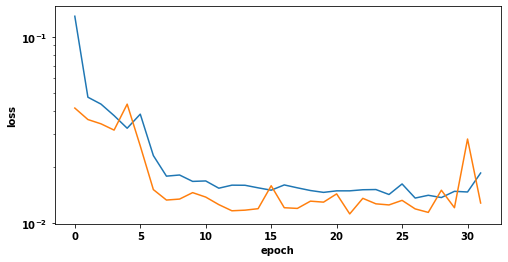

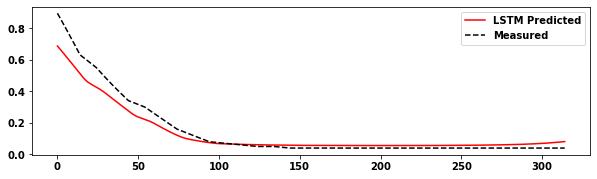

The R2 score of the Training set is :	0.9250
The R2 score of the Testing set is :	0.9225
4 6 90 0.9249611361330756
4 6 90 0.9225153845253743


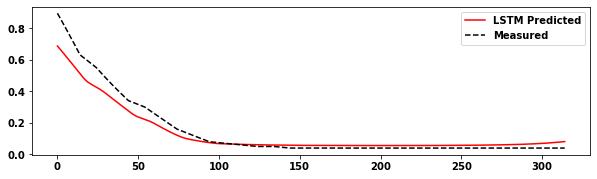

The R2 score of the Training set of  predicted values to predict is :	0.9250
The R2 score of the Testing set predicted values to predict is :	0.8026
Epoch 1/500
89/89 [==============================] - 10s 115ms/step - loss: 0.1392 - accuracy: 0.0000e+00 - val_loss: 0.0491 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 6s 68ms/step - loss: 0.0503 - accuracy: 0.0000e+00 - val_loss: 0.0361 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 6s 68ms/step - loss: 0.0446 - accuracy: 0.0000e+00 - val_loss: 0.0363 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 6s 68ms/step - loss: 0.0379 - accuracy: 0.0000e+00 - val_loss: 0.0246 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 6s 62ms/step - loss: 0.0294 - accuracy: 0.0000e+00 - val_loss: 0.0732 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 6s 62ms/step - loss: 0.0402 - accuracy: 0.0000

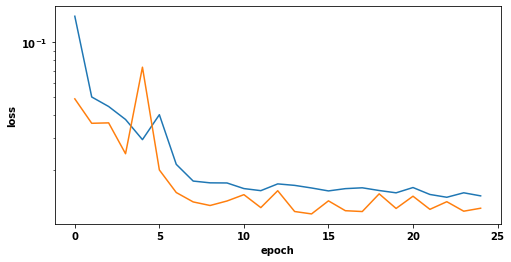

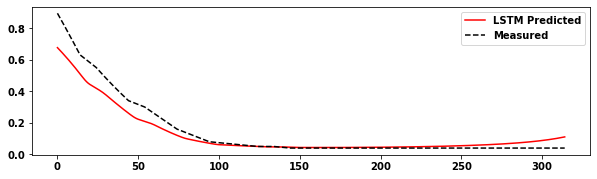

The R2 score of the Training set is :	0.9244
The R2 score of the Testing set is :	0.9109
5 6 90 0.9243682668226405
5 6 90 0.9108533583106982


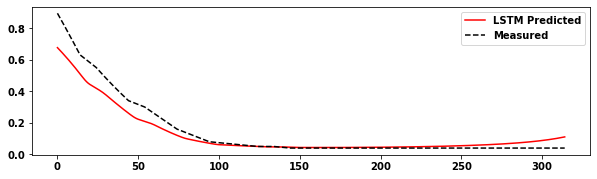

The R2 score of the Training set of  predicted values to predict is :	0.9244
The R2 score of the Testing set predicted values to predict is :	0.7995
Epoch 1/500
89/89 [==============================] - 3s 37ms/step - loss: 0.2226 - accuracy: 0.0000e+00 - val_loss: 0.0505 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0800 - accuracy: 0.0000e+00 - val_loss: 0.0401 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0695 - accuracy: 0.0000e+00 - val_loss: 0.0379 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 12ms/step - loss: 0.0646 - accuracy: 0.0000e+00 - val_loss: 0.0362 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0587 - accuracy: 0.0000e+00 - val_loss: 0.0354 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0562 - accuracy: 0.0000e+

89/89 [==============================] - 1s 13ms/step - loss: 0.0178 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0180 - accuracy: 0.0000e+00 - val_loss: 0.0123 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0161 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0175 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0175 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0172 - accuracy: 0.0000e+00 - val_loss: 0.0124 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 13ms/step - loss: 0.0189 - accuracy: 0.0000e+00 - 

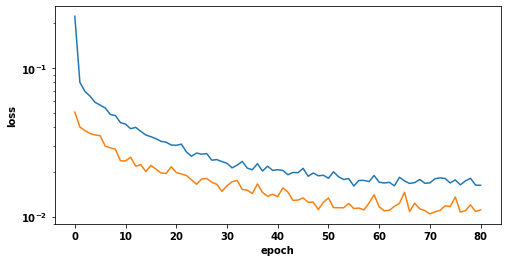

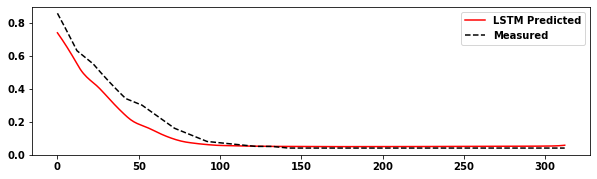

The R2 score of the Training set is :	0.9259
The R2 score of the Testing set is :	0.9244
2 8 10 0.9259087506349472
2 8 10 0.9243968717394492


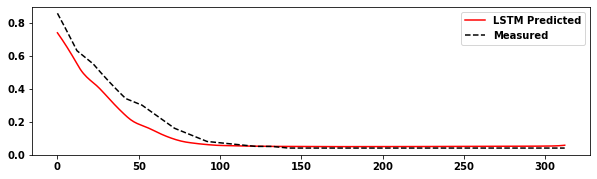

The R2 score of the Training set of  predicted values to predict is :	0.9259
The R2 score of the Testing set predicted values to predict is :	0.8702
Epoch 1/500
89/89 [==============================] - 4s 48ms/step - loss: 0.2869 - accuracy: 0.0000e+00 - val_loss: 0.0707 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 17ms/step - loss: 0.0935 - accuracy: 0.0000e+00 - val_loss: 0.0473 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0750 - accuracy: 0.0000e+00 - val_loss: 0.0407 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0698 - accuracy: 0.0000e+00 - val_loss: 0.0460 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0661 - accuracy: 0.0000e+00 - val_loss: 0.0398 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0648 - accuracy: 0.0000e+

89/89 [==============================] - 2s 18ms/step - loss: 0.0188 - accuracy: 0.0000e+00 - val_loss: 0.0118 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0167 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0166 - accuracy: 0.0000e+00 - val_loss: 0.0122 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0188 - accuracy: 0.0000e+00 - val_loss: 0.0148 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0187 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0161 - accuracy: 0.0000e+00 - val_loss: 0.0137 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0189 - accuracy: 0.0000e+00 - 

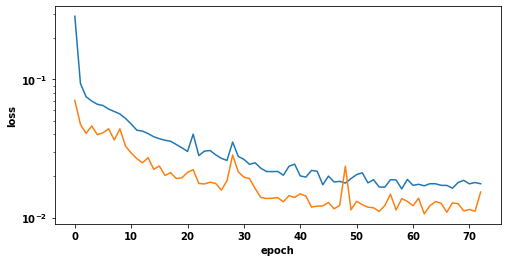

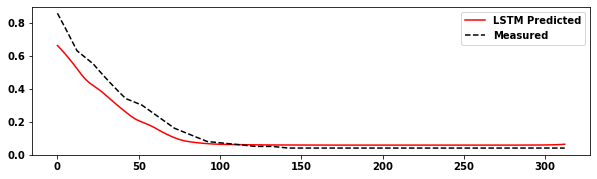

The R2 score of the Training set is :	0.9113
The R2 score of the Testing set is :	0.9123
3 8 10 0.9113355472158687
3 8 10 0.9122948874559522


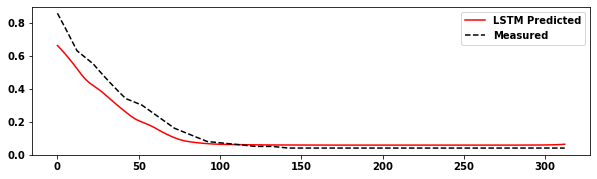

The R2 score of the Training set of  predicted values to predict is :	0.9113
The R2 score of the Testing set predicted values to predict is :	0.7716
Epoch 1/500
89/89 [==============================] - 9s 98ms/step - loss: 0.2859 - accuracy: 0.0000e+00 - val_loss: 0.0503 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 20ms/step - loss: 0.1004 - accuracy: 0.0000e+00 - val_loss: 0.0435 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0790 - accuracy: 0.0000e+00 - val_loss: 0.0415 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0756 - accuracy: 0.0000e+00 - val_loss: 0.0402 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0702 - accuracy: 0.0000e+00 - val_loss: 0.0393 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0671 - accuracy: 0.0000e+

89/89 [==============================] - 2s 22ms/step - loss: 0.0186 - accuracy: 0.0000e+00 - val_loss: 0.0138 - val_accuracy: 0.0000e+00
Epoch 00054: early stopping
Runtime: 126.57 s


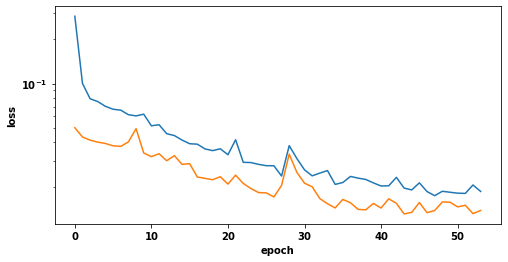

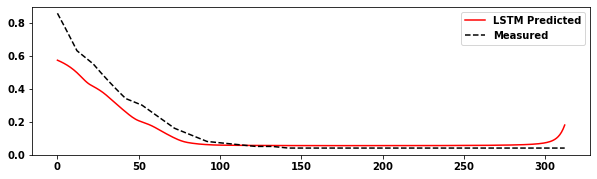

The R2 score of the Training set is :	0.9323
The R2 score of the Testing set is :	0.8798
4 8 10 0.932333537691511
4 8 10 0.8798344143155574


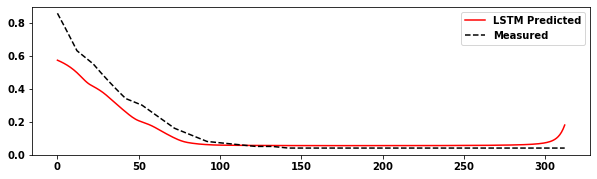

The R2 score of the Training set of  predicted values to predict is :	0.9323
The R2 score of the Testing set predicted values to predict is :	0.7379
Epoch 1/500
89/89 [==============================] - 7s 80ms/step - loss: 0.3064 - accuracy: 0.0000e+00 - val_loss: 0.0637 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 26ms/step - loss: 0.1049 - accuracy: 0.0000e+00 - val_loss: 0.0519 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0937 - accuracy: 0.0000e+00 - val_loss: 0.0441 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0825 - accuracy: 0.0000e+00 - val_loss: 0.0446 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0740 - accuracy: 0.0000e+00 - val_loss: 0.0450 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0669 - accuracy: 0.0000e+

89/89 [==============================] - 2s 24ms/step - loss: 0.0187 - accuracy: 0.0000e+00 - val_loss: 0.0113 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0193 - accuracy: 0.0000e+00 - val_loss: 0.0145 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0188 - accuracy: 0.0000e+00 - val_loss: 0.0122 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0191 - accuracy: 0.0000e+00 - val_loss: 0.0147 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0186 - accuracy: 0.0000e+00 - val_loss: 0.0126 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0184 - accuracy: 0.0000e+00 - val_loss: 0.0137 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0178 - accuracy: 0.0000e+00 - 

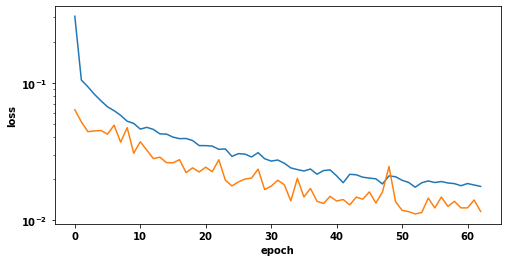

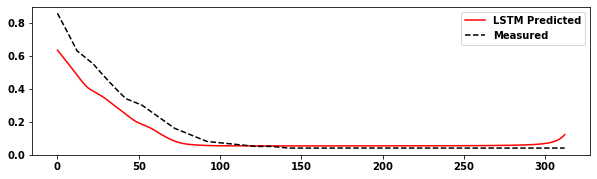

The R2 score of the Training set is :	0.9316
The R2 score of the Testing set is :	0.8690
5 8 10 0.9316051370231196
5 8 10 0.8689930653842157


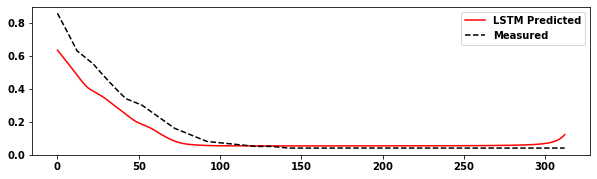

The R2 score of the Training set of  predicted values to predict is :	0.9316
The R2 score of the Testing set predicted values to predict is :	0.7434
Epoch 1/500
89/89 [==============================] - 4s 41ms/step - loss: 0.1632 - accuracy: 0.0000e+00 - val_loss: 0.0362 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0563 - accuracy: 0.0000e+00 - val_loss: 0.0386 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0525 - accuracy: 0.0000e+00 - val_loss: 0.0338 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 1s 14ms/step - loss: 0.0488 - accuracy: 0.0000e+00 - val_loss: 0.0322 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0439 - accuracy: 0.0000e+00 - val_loss: 0.0312 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0414 - accuracy: 0.0000e+

89/89 [==============================] - 1s 16ms/step - loss: 0.0147 - accuracy: 0.0000e+00 - val_loss: 0.0105 - val_accuracy: 0.0000e+00
Epoch 55/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0146 - accuracy: 0.0000e+00 - val_loss: 0.0105 - val_accuracy: 0.0000e+00
Epoch 56/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0145 - accuracy: 0.0000e+00 - val_loss: 0.0107 - val_accuracy: 0.0000e+00
Epoch 57/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0131 - accuracy: 0.0000e+00 - val_loss: 0.0106 - val_accuracy: 0.0000e+00
Epoch 58/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0160 - accuracy: 0.0000e+00 - val_loss: 0.0109 - val_accuracy: 0.0000e+00
Epoch 59/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0138 - accuracy: 0.0000e+00 - val_loss: 0.0114 - val_accuracy: 0.0000e+00
Epoch 60/500
89/89 [==============================] - 1s 15ms/step - loss: 0.0152 - accuracy: 0.0000e+00 - 

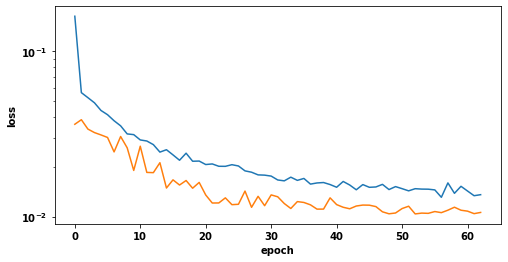

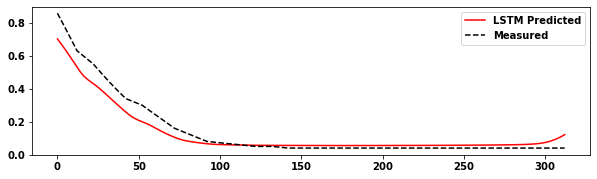

The R2 score of the Training set is :	0.9334
The R2 score of the Testing set is :	0.9228
2 8 20 0.9333915649578061
2 8 20 0.9227961214262168


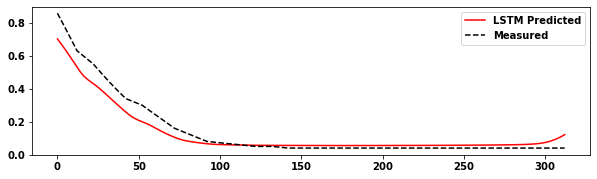

The R2 score of the Training set of  predicted values to predict is :	0.9334
The R2 score of the Testing set predicted values to predict is :	0.8211
Epoch 1/500
89/89 [==============================] - 4s 50ms/step - loss: 0.1741 - accuracy: 0.0000e+00 - val_loss: 0.0432 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0624 - accuracy: 0.0000e+00 - val_loss: 0.0387 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0583 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 18ms/step - loss: 0.0568 - accuracy: 0.0000e+00 - val_loss: 0.0362 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0527 - accuracy: 0.0000e+00 - val_loss: 0.0350 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0485 - accuracy: 0.0000e+

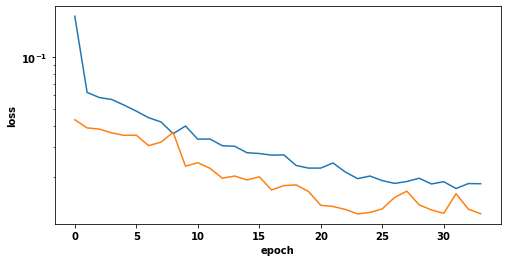

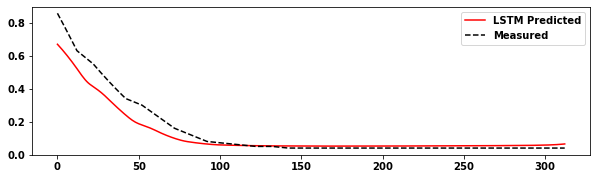

The R2 score of the Training set is :	0.9253
The R2 score of the Testing set is :	0.9030
3 8 20 0.9253133951966545
3 8 20 0.902970518790619


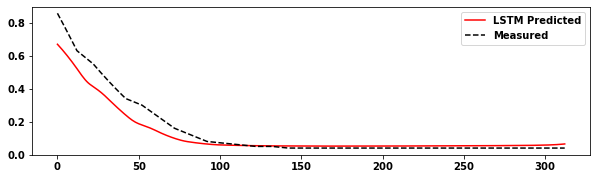

The R2 score of the Training set of  predicted values to predict is :	0.9253
The R2 score of the Testing set predicted values to predict is :	0.7929
Epoch 1/500
89/89 [==============================] - 5s 58ms/step - loss: 0.2165 - accuracy: 0.0000e+00 - val_loss: 0.0453 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0690 - accuracy: 0.0000e+00 - val_loss: 0.0407 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0623 - accuracy: 0.0000e+00 - val_loss: 0.0486 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0606 - accuracy: 0.0000e+00 - val_loss: 0.0375 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0559 - accuracy: 0.0000e+00 - val_loss: 0.0383 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0479 - accuracy: 0.0000e+

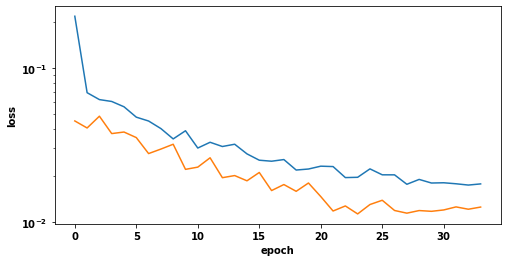

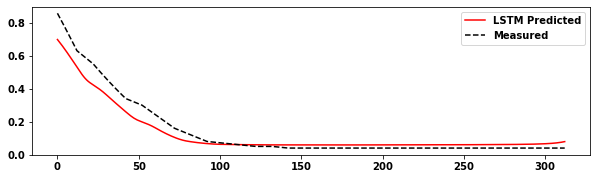

The R2 score of the Training set is :	0.9271
The R2 score of the Testing set is :	0.9212
4 8 20 0.9271281951760995
4 8 20 0.9212252057487252


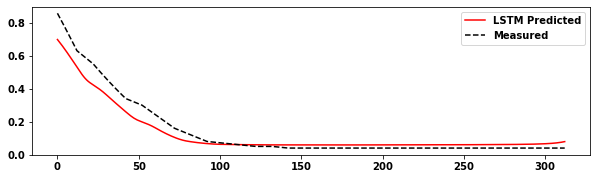

The R2 score of the Training set of  predicted values to predict is :	0.9271
The R2 score of the Testing set predicted values to predict is :	0.8096
Epoch 1/500
89/89 [==============================] - 7s 80ms/step - loss: 0.2270 - accuracy: 0.0000e+00 - val_loss: 0.0544 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0801 - accuracy: 0.0000e+00 - val_loss: 0.0443 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0682 - accuracy: 0.0000e+00 - val_loss: 0.0412 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 28ms/step - loss: 0.0636 - accuracy: 0.0000e+00 - val_loss: 0.0421 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0579 - accuracy: 0.0000e+00 - val_loss: 0.0375 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0519 - accuracy: 0.0000e+

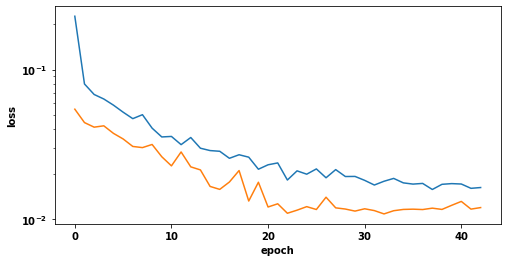

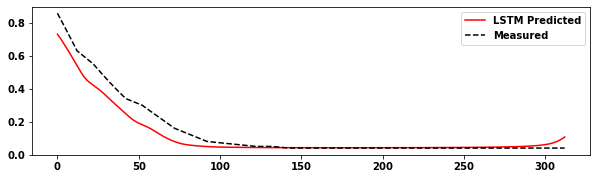

The R2 score of the Training set is :	0.9235
The R2 score of the Testing set is :	0.9152
5 8 20 0.9234621194029077
5 8 20 0.9152498088738971


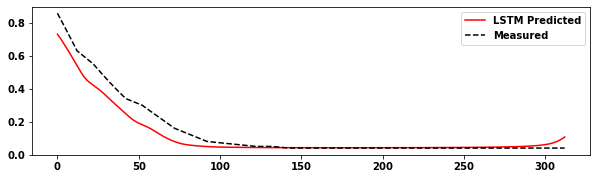

The R2 score of the Training set of  predicted values to predict is :	0.9235
The R2 score of the Testing set predicted values to predict is :	0.8392
Epoch 1/500
89/89 [==============================] - 4s 40ms/step - loss: 0.1370 - accuracy: 0.0000e+00 - val_loss: 0.0368 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0543 - accuracy: 0.0000e+00 - val_loss: 0.0422 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 1s 16ms/step - loss: 0.0485 - accuracy: 0.0000e+00 - val_loss: 0.0371 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0462 - accuracy: 0.0000e+00 - val_loss: 0.0296 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 1s 17ms/step - loss: 0.0402 - accuracy: 0.0000e+00 - val_loss: 0.0273 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 17ms/step - loss: 0.0349 - accuracy: 0.0000e+

89/89 [==============================] - 2s 19ms/step - loss: 0.0141 - accuracy: 0.0000e+00 - val_loss: 0.0118 - val_accuracy: 0.0000e+00
Epoch 00054: early stopping
Runtime: 94.48 s


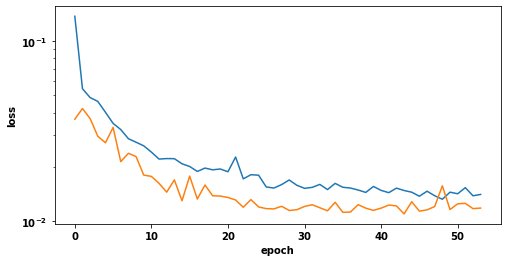

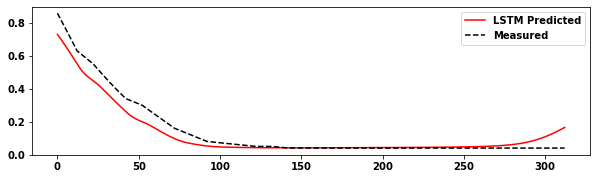

The R2 score of the Training set is :	0.9274
The R2 score of the Testing set is :	0.9262
2 8 30 0.9273961473411589
2 8 30 0.9261608471623204


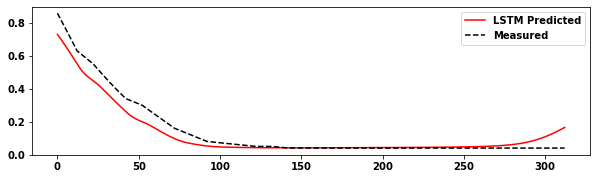

The R2 score of the Training set of  predicted values to predict is :	0.9274
The R2 score of the Testing set predicted values to predict is :	0.8166
Epoch 1/500
89/89 [==============================] - 5s 57ms/step - loss: 0.1555 - accuracy: 0.0000e+00 - val_loss: 0.0438 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 19ms/step - loss: 0.0626 - accuracy: 0.0000e+00 - val_loss: 0.0406 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 22ms/step - loss: 0.0571 - accuracy: 0.0000e+00 - val_loss: 0.0393 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0506 - accuracy: 0.0000e+00 - val_loss: 0.0359 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 21ms/step - loss: 0.0459 - accuracy: 0.0000e+00 - val_loss: 0.0308 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 20ms/step - loss: 0.0372 - accuracy: 0.0000e+

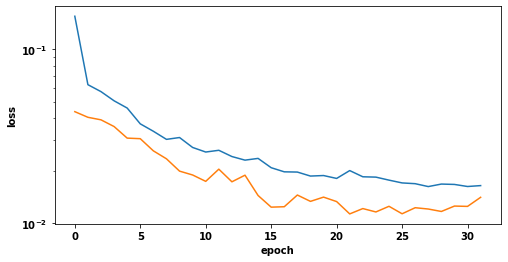

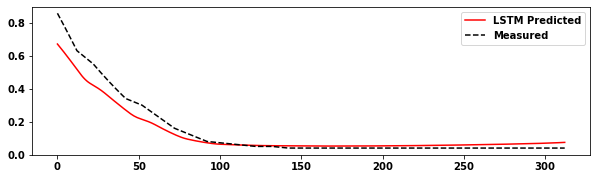

The R2 score of the Training set is :	0.9200
The R2 score of the Testing set is :	0.9231
3 8 30 0.9199747572034848
3 8 30 0.9230728928341086


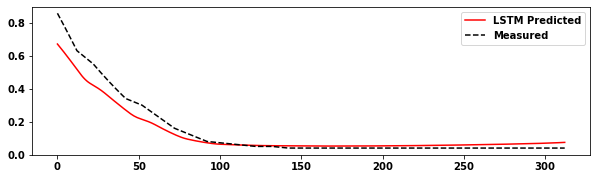

The R2 score of the Training set of  predicted values to predict is :	0.9200
The R2 score of the Testing set predicted values to predict is :	0.8182
Epoch 1/500
89/89 [==============================] - 6s 66ms/step - loss: 0.1621 - accuracy: 0.0000e+00 - val_loss: 0.0447 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0638 - accuracy: 0.0000e+00 - val_loss: 0.0413 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 29ms/step - loss: 0.0585 - accuracy: 0.0000e+00 - val_loss: 0.0456 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 26ms/step - loss: 0.0542 - accuracy: 0.0000e+00 - val_loss: 0.0452 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 28ms/step - loss: 0.0525 - accuracy: 0.0000e+00 - val_loss: 0.0357 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 27ms/step - loss: 0.0415 - accuracy: 0.0000e+

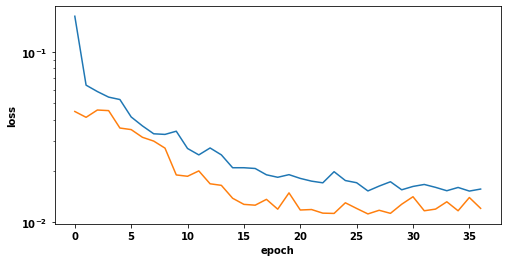

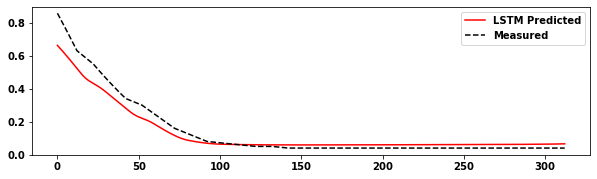

The R2 score of the Training set is :	0.9242
The R2 score of the Testing set is :	0.9280
4 8 30 0.9242125668972193
4 8 30 0.9279785370531977


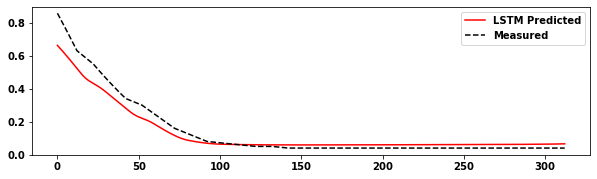

The R2 score of the Training set of  predicted values to predict is :	0.9242
The R2 score of the Testing set predicted values to predict is :	0.8113
Epoch 1/500
89/89 [==============================] - 7s 78ms/step - loss: 0.1866 - accuracy: 0.0000e+00 - val_loss: 0.0472 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0693 - accuracy: 0.0000e+00 - val_loss: 0.0417 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0606 - accuracy: 0.0000e+00 - val_loss: 0.0435 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 32ms/step - loss: 0.0530 - accuracy: 0.0000e+00 - val_loss: 0.0391 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 31ms/step - loss: 0.0486 - accuracy: 0.0000e+00 - val_loss: 0.0301 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 32ms/step - loss: 0.0407 - accuracy: 0.0000e+

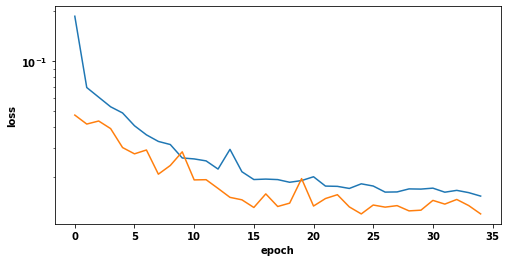

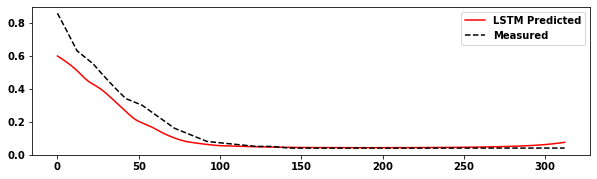

The R2 score of the Training set is :	0.9281
The R2 score of the Testing set is :	0.9014
5 8 30 0.9280561673127457
5 8 30 0.9014133057203244


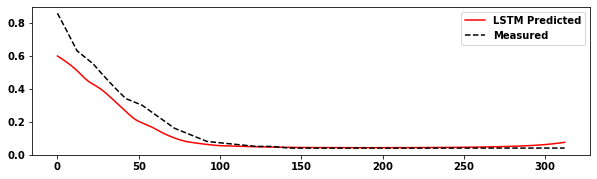

The R2 score of the Training set of  predicted values to predict is :	0.9281
The R2 score of the Testing set predicted values to predict is :	0.7491
Epoch 1/500
89/89 [==============================] - 4s 47ms/step - loss: 0.1164 - accuracy: 0.0000e+00 - val_loss: 0.0384 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0502 - accuracy: 0.0000e+00 - val_loss: 0.0375 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 23ms/step - loss: 0.0434 - accuracy: 0.0000e+00 - val_loss: 0.0350 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0400 - accuracy: 0.0000e+00 - val_loss: 0.0278 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0361 - accuracy: 0.0000e+00 - val_loss: 0.0262 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0310 - accuracy: 0.0000e+

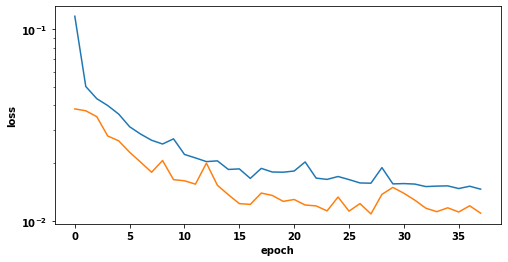

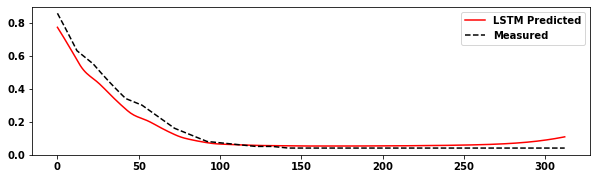

The R2 score of the Training set is :	0.9288
The R2 score of the Testing set is :	0.9559
2 8 40 0.9287590243874077
2 8 40 0.9558577264177293


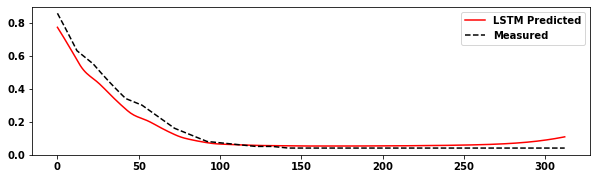

The R2 score of the Training set of  predicted values to predict is :	0.9288
The R2 score of the Testing set predicted values to predict is :	0.8992
Epoch 1/500
89/89 [==============================] - 5s 59ms/step - loss: 0.1433 - accuracy: 0.0000e+00 - val_loss: 0.0394 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0552 - accuracy: 0.0000e+00 - val_loss: 0.0385 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 30ms/step - loss: 0.0494 - accuracy: 0.0000e+00 - val_loss: 0.0375 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 33ms/step - loss: 0.0431 - accuracy: 0.0000e+00 - val_loss: 0.0301 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0375 - accuracy: 0.0000e+00 - val_loss: 0.0277 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0306 - accuracy: 0.0000e+

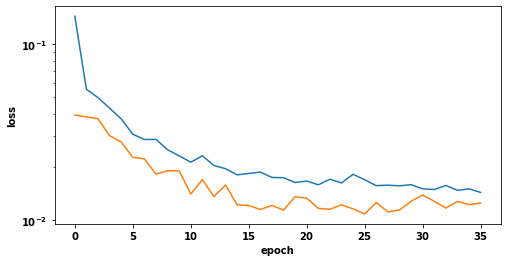

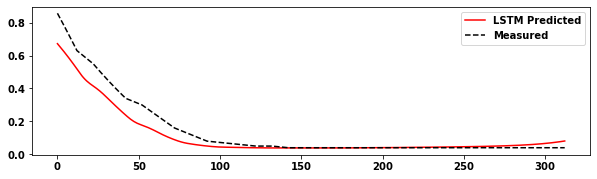

The R2 score of the Training set is :	0.9209
The R2 score of the Testing set is :	0.8979
3 8 40 0.92091245491774
3 8 40 0.8978611492485482


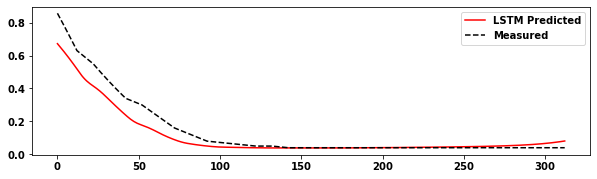

The R2 score of the Training set of  predicted values to predict is :	0.9209
The R2 score of the Testing set predicted values to predict is :	0.7752
Epoch 1/500
89/89 [==============================] - 7s 80ms/step - loss: 0.1542 - accuracy: 0.0000e+00 - val_loss: 0.0415 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 43ms/step - loss: 0.0592 - accuracy: 0.0000e+00 - val_loss: 0.0396 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0539 - accuracy: 0.0000e+00 - val_loss: 0.0395 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0511 - accuracy: 0.0000e+00 - val_loss: 0.0389 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0446 - accuracy: 0.0000e+00 - val_loss: 0.0340 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 41ms/step - loss: 0.0336 - accuracy: 0.0000e+

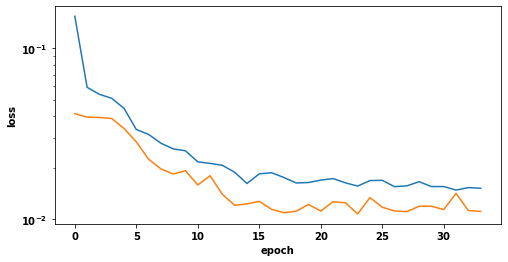

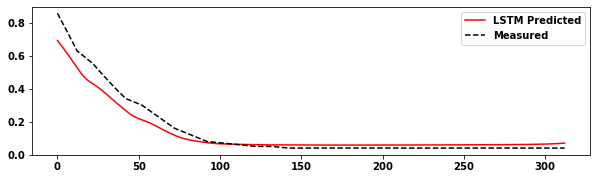

The R2 score of the Training set is :	0.9278
The R2 score of the Testing set is :	0.9291
4 8 40 0.9277683365370253
4 8 40 0.9290788283264078


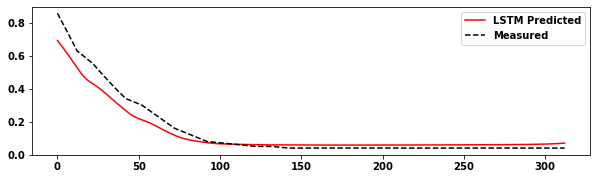

The R2 score of the Training set of  predicted values to predict is :	0.9278
The R2 score of the Testing set predicted values to predict is :	0.8386
Epoch 1/500
89/89 [==============================] - 8s 95ms/step - loss: 0.1663 - accuracy: 0.0000e+00 - val_loss: 0.0476 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0629 - accuracy: 0.0000e+00 - val_loss: 0.0450 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0582 - accuracy: 0.0000e+00 - val_loss: 0.0473 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0525 - accuracy: 0.0000e+00 - val_loss: 0.0419 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0451 - accuracy: 0.0000e+00 - val_loss: 0.0284 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0354 - accuracy: 0.0000e+

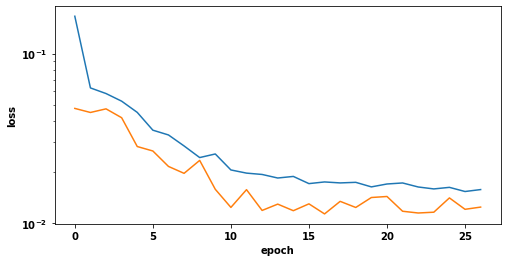

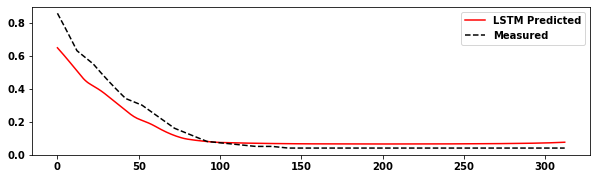

The R2 score of the Training set is :	0.9232
The R2 score of the Testing set is :	0.9061
5 8 40 0.9231880554436127
5 8 40 0.9061102136405579


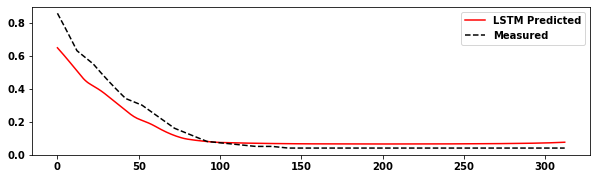

The R2 score of the Training set of  predicted values to predict is :	0.9232
The R2 score of the Testing set predicted values to predict is :	0.7865
Epoch 1/500
89/89 [==============================] - 4s 48ms/step - loss: 0.1173 - accuracy: 0.0000e+00 - val_loss: 0.0412 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0464 - accuracy: 0.0000e+00 - val_loss: 0.0387 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0423 - accuracy: 0.0000e+00 - val_loss: 0.0318 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0358 - accuracy: 0.0000e+00 - val_loss: 0.0261 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 2s 25ms/step - loss: 0.0313 - accuracy: 0.0000e+00 - val_loss: 0.0221 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 2s 24ms/step - loss: 0.0276 - accuracy: 0.0000e+

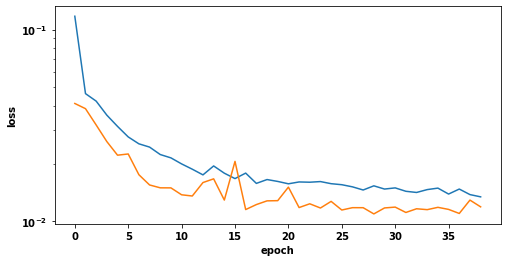

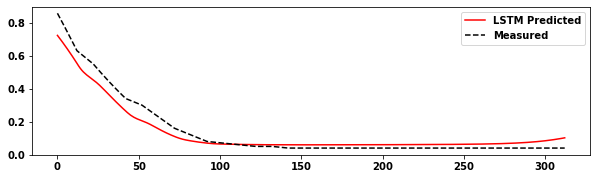

The R2 score of the Training set is :	0.9275
The R2 score of the Testing set is :	0.9364
2 8 50 0.9275428591882099
2 8 50 0.9364231497847231


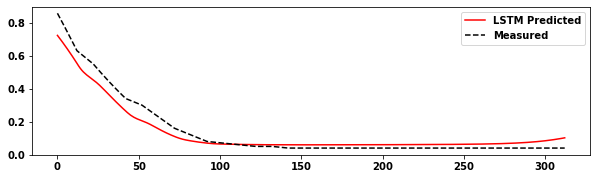

The R2 score of the Training set of  predicted values to predict is :	0.9275
The R2 score of the Testing set predicted values to predict is :	0.8530
Epoch 1/500
89/89 [==============================] - 7s 82ms/step - loss: 0.1365 - accuracy: 0.0000e+00 - val_loss: 0.0443 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0531 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0476 - accuracy: 0.0000e+00 - val_loss: 0.0413 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0420 - accuracy: 0.0000e+00 - val_loss: 0.0401 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0342 - accuracy: 0.0000e+00 - val_loss: 0.0282 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0309 - accuracy: 0.0000e+

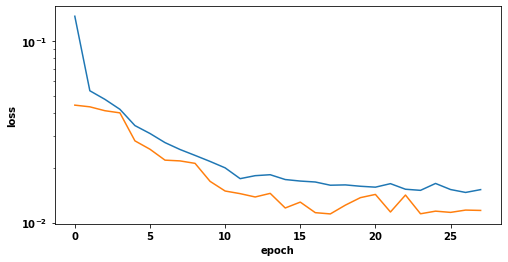

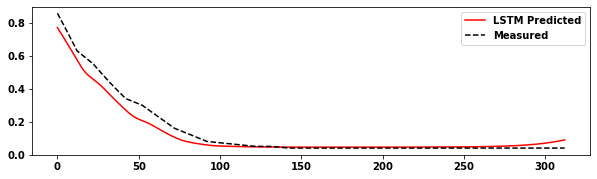

The R2 score of the Training set is :	0.9245
The R2 score of the Testing set is :	0.9538
3 8 50 0.9244605293136575
3 8 50 0.9538224316629709


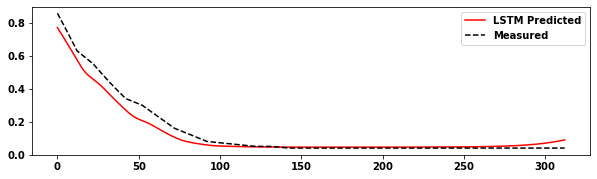

The R2 score of the Training set of  predicted values to predict is :	0.9245
The R2 score of the Testing set predicted values to predict is :	0.8339
Epoch 1/500
89/89 [==============================] - 9s 102ms/step - loss: 0.1441 - accuracy: 0.0000e+00 - val_loss: 0.0423 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 54ms/step - loss: 0.0585 - accuracy: 0.0000e+00 - val_loss: 0.0519 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0536 - accuracy: 0.0000e+00 - val_loss: 0.0480 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 55ms/step - loss: 0.0462 - accuracy: 0.0000e+00 - val_loss: 0.0371 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 54ms/step - loss: 0.0359 - accuracy: 0.0000e+00 - val_loss: 0.0322 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 55ms/step - loss: 0.0336 - accuracy: 0.0000e

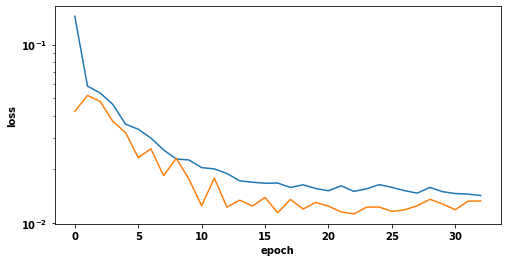

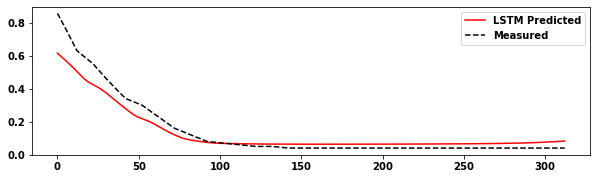

The R2 score of the Training set is :	0.9237
The R2 score of the Testing set is :	0.9061
4 8 50 0.9237460335523888
4 8 50 0.9060736228904126


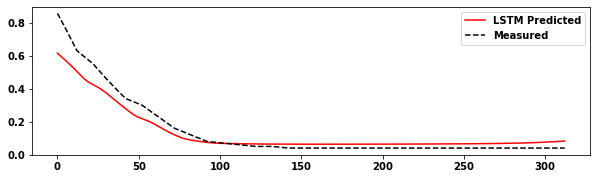

The R2 score of the Training set of  predicted values to predict is :	0.9237
The R2 score of the Testing set predicted values to predict is :	0.7729
Epoch 1/500
89/89 [==============================] - 10s 108ms/step - loss: 0.1566 - accuracy: 0.0000e+00 - val_loss: 0.0439 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 60ms/step - loss: 0.0618 - accuracy: 0.0000e+00 - val_loss: 0.0500 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0552 - accuracy: 0.0000e+00 - val_loss: 0.0419 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 51ms/step - loss: 0.0490 - accuracy: 0.0000e+00 - val_loss: 0.0432 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 51ms/step - loss: 0.0440 - accuracy: 0.0000e+00 - val_loss: 0.0301 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 54ms/step - loss: 0.0357 - accuracy: 0.0000

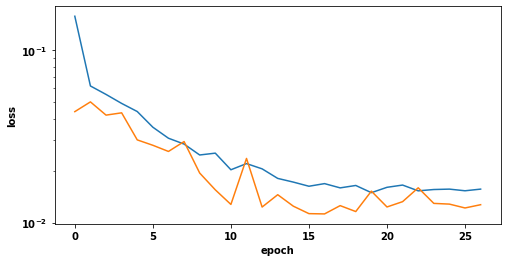

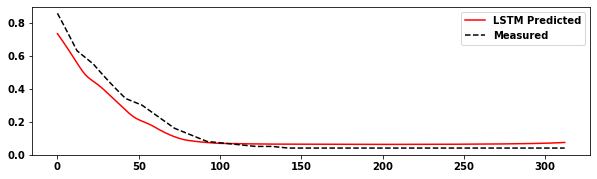

The R2 score of the Training set is :	0.9218
The R2 score of the Testing set is :	0.9390
5 8 50 0.9217941008993447
5 8 50 0.9390114772234524


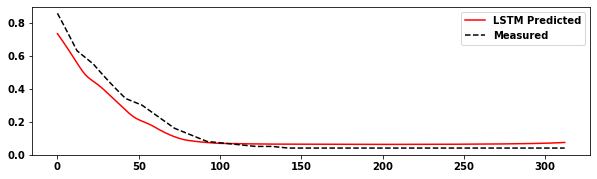

The R2 score of the Training set of  predicted values to predict is :	0.9218
The R2 score of the Testing set predicted values to predict is :	0.8037
Epoch 1/500
89/89 [==============================] - 6s 65ms/step - loss: 0.1027 - accuracy: 0.0000e+00 - val_loss: 0.0382 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 35ms/step - loss: 0.0435 - accuracy: 0.0000e+00 - val_loss: 0.0425 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 36ms/step - loss: 0.0378 - accuracy: 0.0000e+00 - val_loss: 0.0302 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 36ms/step - loss: 0.0321 - accuracy: 0.0000e+00 - val_loss: 0.0348 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 36ms/step - loss: 0.0276 - accuracy: 0.0000e+00 - val_loss: 0.0209 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 35ms/step - loss: 0.0247 - accuracy: 0.0000e+

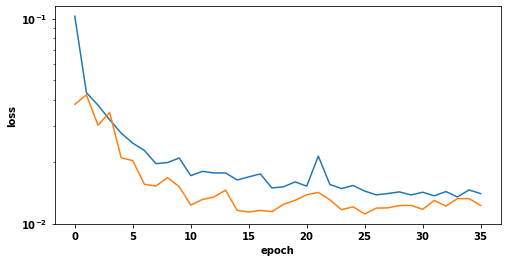

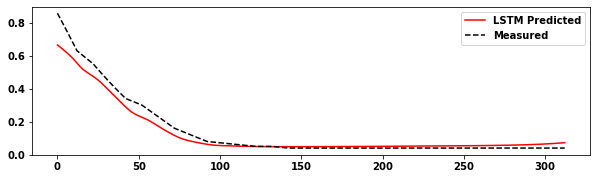

The R2 score of the Training set is :	0.9257
The R2 score of the Testing set is :	0.9510
2 8 60 0.9256893826151493
2 8 60 0.9510105497434103


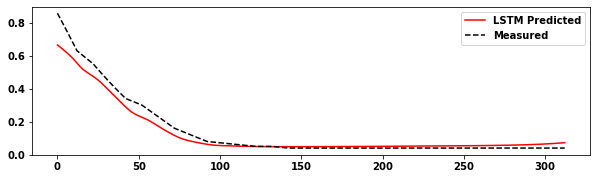

The R2 score of the Training set of  predicted values to predict is :	0.9257
The R2 score of the Testing set predicted values to predict is :	0.8508
Epoch 1/500
89/89 [==============================] - 7s 78ms/step - loss: 0.1218 - accuracy: 0.0000e+00 - val_loss: 0.0410 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0531 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0459 - accuracy: 0.0000e+00 - val_loss: 0.0414 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0362 - accuracy: 0.0000e+00 - val_loss: 0.0465 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0310 - accuracy: 0.0000e+00 - val_loss: 0.0227 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0285 - accuracy: 0.0000e+

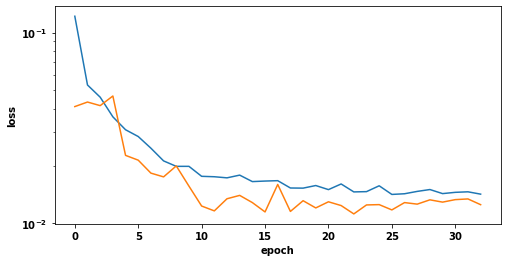

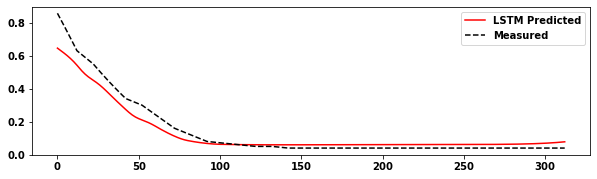

The R2 score of the Training set is :	0.9262
The R2 score of the Testing set is :	0.9292
3 8 60 0.9262121370609145
3 8 60 0.9291553380210963


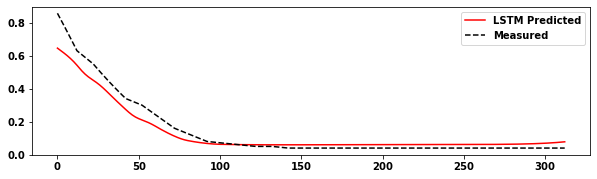

The R2 score of the Training set of  predicted values to predict is :	0.9262
The R2 score of the Testing set predicted values to predict is :	0.7968
Epoch 1/500
89/89 [==============================] - 8s 90ms/step - loss: 0.1300 - accuracy: 0.0000e+00 - val_loss: 0.0412 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 55ms/step - loss: 0.0568 - accuracy: 0.0000e+00 - val_loss: 0.0444 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 55ms/step - loss: 0.0508 - accuracy: 0.0000e+00 - val_loss: 0.0387 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0438 - accuracy: 0.0000e+00 - val_loss: 0.0412 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 56ms/step - loss: 0.0358 - accuracy: 0.0000e+00 - val_loss: 0.0244 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 55ms/step - loss: 0.0321 - accuracy: 0.0000e+

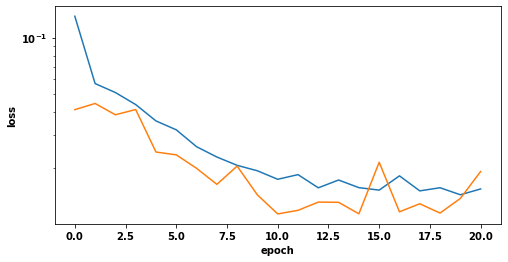

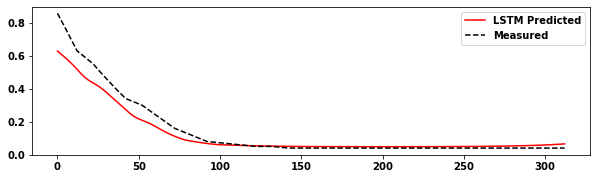

The R2 score of the Training set is :	0.9079
The R2 score of the Testing set is :	0.9207
4 8 60 0.9079330053579777
4 8 60 0.9207362689706461


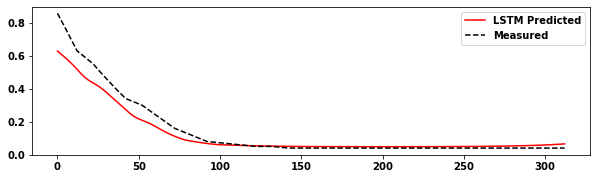

The R2 score of the Training set of  predicted values to predict is :	0.9079
The R2 score of the Testing set predicted values to predict is :	0.7825
Epoch 1/500
89/89 [==============================] - 9s 96ms/step - loss: 0.1432 - accuracy: 0.0000e+00 - val_loss: 0.0471 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 51ms/step - loss: 0.0600 - accuracy: 0.0000e+00 - val_loss: 0.0423 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 60ms/step - loss: 0.0528 - accuracy: 0.0000e+00 - val_loss: 0.0395 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 60ms/step - loss: 0.0419 - accuracy: 0.0000e+00 - val_loss: 0.0572 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 59ms/step - loss: 0.0369 - accuracy: 0.0000e+00 - val_loss: 0.0264 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 60ms/step - loss: 0.0307 - accuracy: 0.0000e+

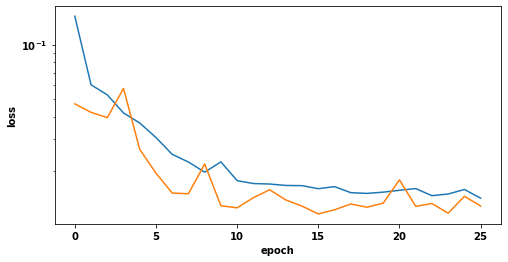

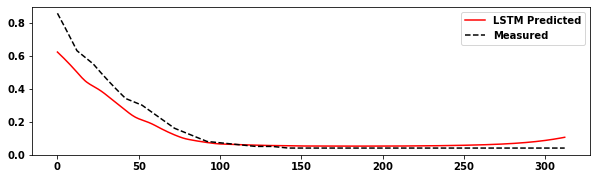

The R2 score of the Training set is :	0.9253
The R2 score of the Testing set is :	0.9023
5 8 60 0.9253020977304641
5 8 60 0.9022660476510509


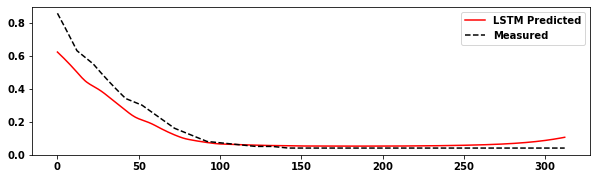

The R2 score of the Training set of  predicted values to predict is :	0.9253
The R2 score of the Testing set predicted values to predict is :	0.7810
Epoch 1/500
89/89 [==============================] - 5s 62ms/step - loss: 0.1052 - accuracy: 0.0000e+00 - val_loss: 0.0367 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 37ms/step - loss: 0.0448 - accuracy: 0.0000e+00 - val_loss: 0.0416 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0362 - accuracy: 0.0000e+00 - val_loss: 0.0274 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0313 - accuracy: 0.0000e+00 - val_loss: 0.0263 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0278 - accuracy: 0.0000e+00 - val_loss: 0.0208 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 38ms/step - loss: 0.0234 - accuracy: 0.0000e+

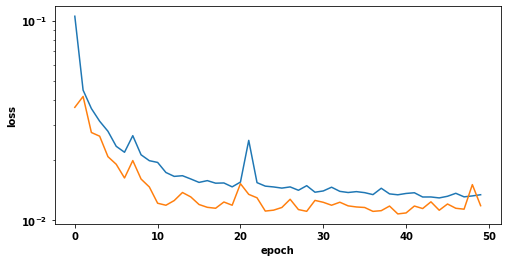

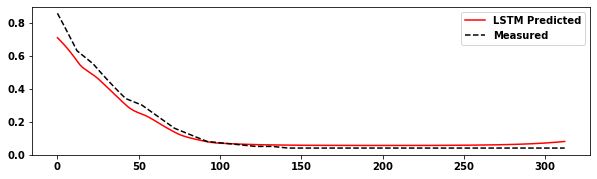

The R2 score of the Training set is :	0.9270
The R2 score of the Testing set is :	0.9669
2 8 70 0.9269688294936667
2 8 70 0.9668676047850451


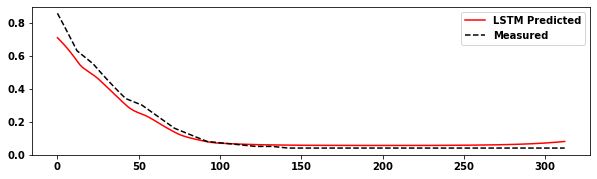

The R2 score of the Training set of  predicted values to predict is :	0.9270
The R2 score of the Testing set predicted values to predict is :	0.8799
Epoch 1/500
89/89 [==============================] - 8s 88ms/step - loss: 0.1111 - accuracy: 0.0000e+00 - val_loss: 0.0390 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 49ms/step - loss: 0.0506 - accuracy: 0.0000e+00 - val_loss: 0.0429 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 50ms/step - loss: 0.0469 - accuracy: 0.0000e+00 - val_loss: 0.0367 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0397 - accuracy: 0.0000e+00 - val_loss: 0.0449 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 5s 52ms/step - loss: 0.0312 - accuracy: 0.0000e+00 - val_loss: 0.0271 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 50ms/step - loss: 0.0293 - accuracy: 0.0000e+

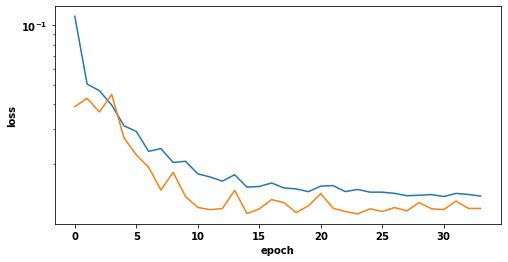

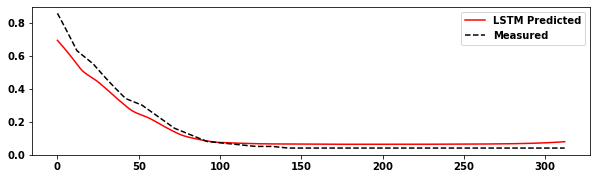

The R2 score of the Training set is :	0.9250
The R2 score of the Testing set is :	0.9511
3 8 70 0.9250069235365077
3 8 70 0.9510632851858523


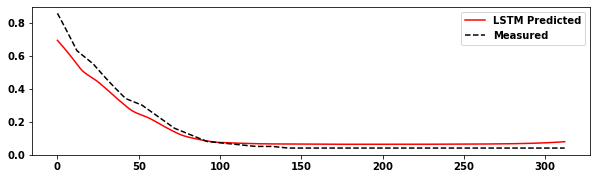

The R2 score of the Training set of  predicted values to predict is :	0.9250
The R2 score of the Testing set predicted values to predict is :	0.8549
Epoch 1/500
89/89 [==============================] - 9s 96ms/step - loss: 0.1244 - accuracy: 0.0000e+00 - val_loss: 0.0432 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 5s 58ms/step - loss: 0.0561 - accuracy: 0.0000e+00 - val_loss: 0.0552 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 59ms/step - loss: 0.0505 - accuracy: 0.0000e+00 - val_loss: 0.0371 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 5s 57ms/step - loss: 0.0427 - accuracy: 0.0000e+00 - val_loss: 0.0430 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 6s 62ms/step - loss: 0.0344 - accuracy: 0.0000e+00 - val_loss: 0.0279 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 5s 58ms/step - loss: 0.0295 - accuracy: 0.0000e+

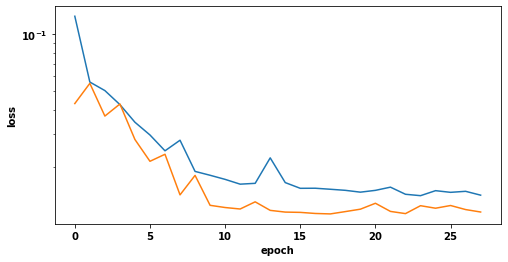

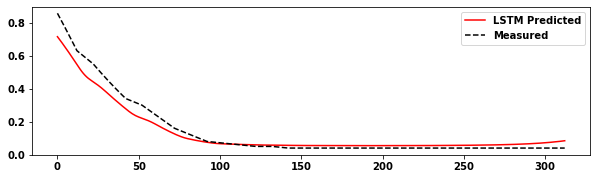

The R2 score of the Training set is :	0.9276
The R2 score of the Testing set is :	0.9455
4 8 70 0.9276371120391151
4 8 70 0.9455318412566683


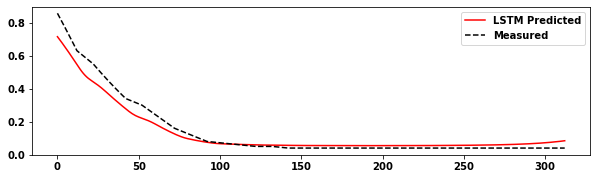

The R2 score of the Training set of  predicted values to predict is :	0.9276
The R2 score of the Testing set predicted values to predict is :	0.8195
Epoch 1/500
89/89 [==============================] - 10s 109ms/step - loss: 0.1343 - accuracy: 0.0000e+00 - val_loss: 0.0467 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 6s 64ms/step - loss: 0.0589 - accuracy: 0.0000e+00 - val_loss: 0.0447 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 6s 66ms/step - loss: 0.0525 - accuracy: 0.0000e+00 - val_loss: 0.0503 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 6s 65ms/step - loss: 0.0446 - accuracy: 0.0000e+00 - val_loss: 0.0486 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 6s 66ms/step - loss: 0.0367 - accuracy: 0.0000e+00 - val_loss: 0.0321 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 6s 65ms/step - loss: 0.0320 - accuracy: 0.0000

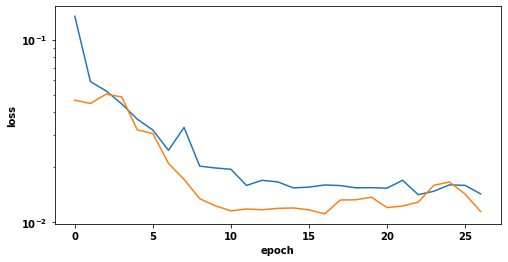

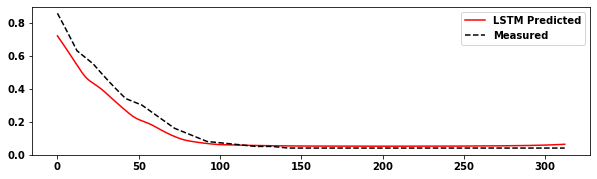

The R2 score of the Training set is :	0.9225
The R2 score of the Testing set is :	0.9383
5 8 70 0.9225004332055914
5 8 70 0.9382909015545707


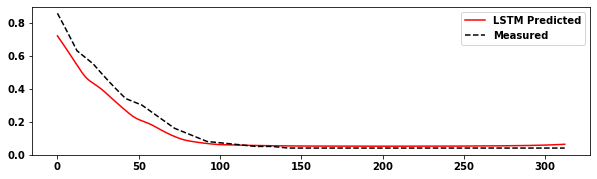

The R2 score of the Training set of  predicted values to predict is :	0.9225
The R2 score of the Testing set predicted values to predict is :	0.8084
Epoch 1/500
89/89 [==============================] - 6s 69ms/step - loss: 0.0964 - accuracy: 0.0000e+00 - val_loss: 0.0370 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0437 - accuracy: 0.0000e+00 - val_loss: 0.0370 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0374 - accuracy: 0.0000e+00 - val_loss: 0.0277 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0298 - accuracy: 0.0000e+00 - val_loss: 0.0311 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0275 - accuracy: 0.0000e+00 - val_loss: 0.0206 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0238 - accuracy: 0.0000e+

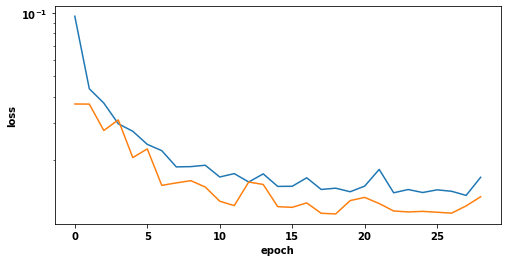

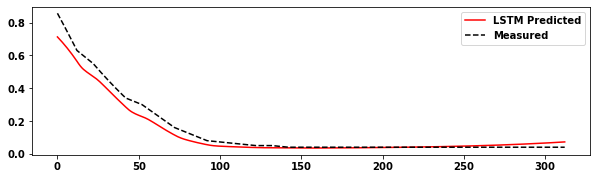

The R2 score of the Training set is :	0.9170
The R2 score of the Testing set is :	0.9581
2 8 80 0.9169881265699453
2 8 80 0.9580504626045474


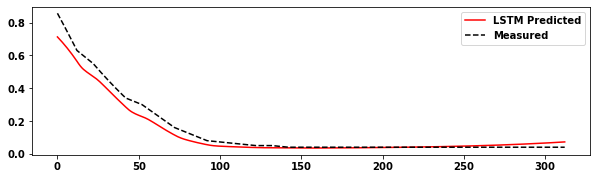

The R2 score of the Training set of  predicted values to predict is :	0.9170
The R2 score of the Testing set predicted values to predict is :	0.8732
Epoch 1/500
89/89 [==============================] - 4s 48ms/step - loss: 0.1120 - accuracy: 0.0000e+00 - val_loss: 0.0391 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0504 - accuracy: 0.0000e+00 - val_loss: 0.0442 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0451 - accuracy: 0.0000e+00 - val_loss: 0.0310 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0348 - accuracy: 0.0000e+00 - val_loss: 0.0318 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0285 - accuracy: 0.0000e+00 - val_loss: 0.0200 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 34ms/step - loss: 0.0252 - accuracy: 0.0000e+

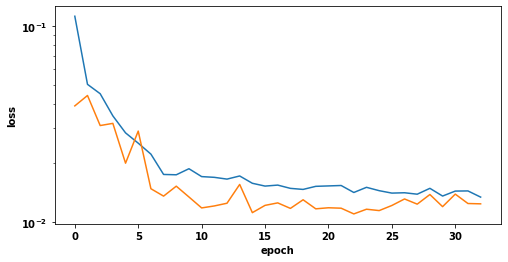

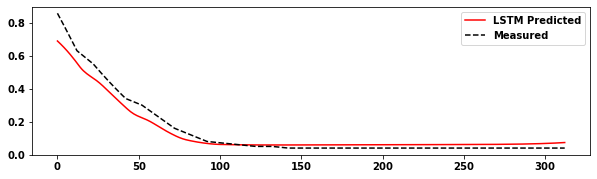

The R2 score of the Training set is :	0.9249
The R2 score of the Testing set is :	0.9480
3 8 80 0.9249490945424187
3 8 80 0.9480493939174498


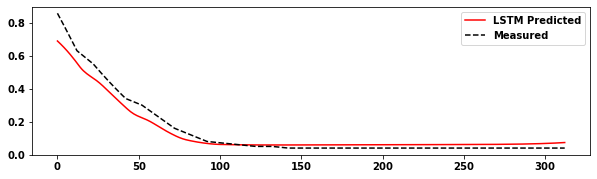

The R2 score of the Training set of  predicted values to predict is :	0.9249
The R2 score of the Testing set predicted values to predict is :	0.8373
Epoch 1/500
89/89 [==============================] - 5s 59ms/step - loss: 0.1225 - accuracy: 0.0000e+00 - val_loss: 0.0441 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 44ms/step - loss: 0.0554 - accuracy: 0.0000e+00 - val_loss: 0.0430 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 43ms/step - loss: 0.0500 - accuracy: 0.0000e+00 - val_loss: 0.0427 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0406 - accuracy: 0.0000e+00 - val_loss: 0.0459 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 41ms/step - loss: 0.0355 - accuracy: 0.0000e+00 - val_loss: 0.0247 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0286 - accuracy: 0.0000e+

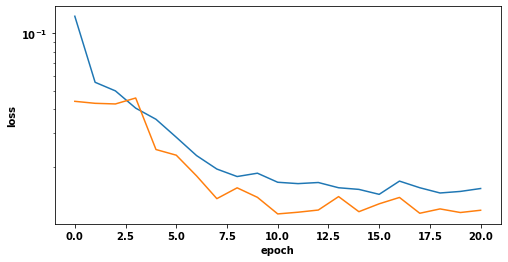

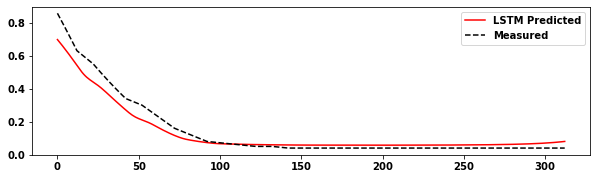

The R2 score of the Training set is :	0.9251
The R2 score of the Testing set is :	0.9360
4 8 80 0.9251282976769793
4 8 80 0.936025578253303


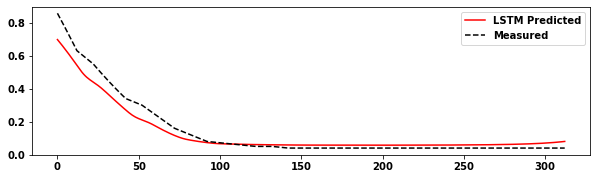

The R2 score of the Training set of  predicted values to predict is :	0.9251
The R2 score of the Testing set predicted values to predict is :	0.8274
Epoch 1/500
89/89 [==============================] - 7s 77ms/step - loss: 0.1318 - accuracy: 0.0000e+00 - val_loss: 0.0441 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 50ms/step - loss: 0.0587 - accuracy: 0.0000e+00 - val_loss: 0.0407 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0523 - accuracy: 0.0000e+00 - val_loss: 0.0456 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0450 - accuracy: 0.0000e+00 - val_loss: 0.0438 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0363 - accuracy: 0.0000e+00 - val_loss: 0.0316 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0316 - accuracy: 0.0000e+

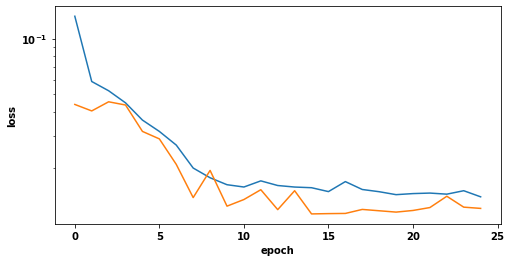

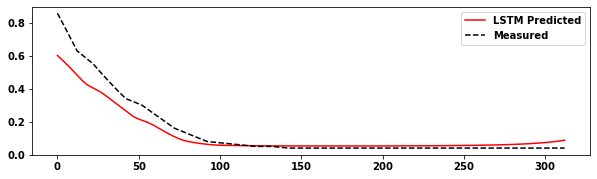

The R2 score of the Training set is :	0.9243
The R2 score of the Testing set is :	0.8878
5 8 80 0.9242554615597234
5 8 80 0.887836870257986


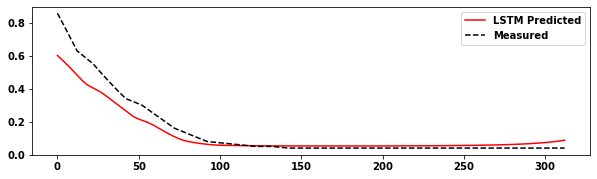

The R2 score of the Training set of  predicted values to predict is :	0.9243
The R2 score of the Testing set predicted values to predict is :	0.7621
Epoch 1/500
89/89 [==============================] - 6s 67ms/step - loss: 0.0973 - accuracy: 0.0000e+00 - val_loss: 0.0359 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0420 - accuracy: 0.0000e+00 - val_loss: 0.0461 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0359 - accuracy: 0.0000e+00 - val_loss: 0.0254 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0282 - accuracy: 0.0000e+00 - val_loss: 0.0306 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 39ms/step - loss: 0.0239 - accuracy: 0.0000e+00 - val_loss: 0.0175 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0223 - accuracy: 0.0000e+

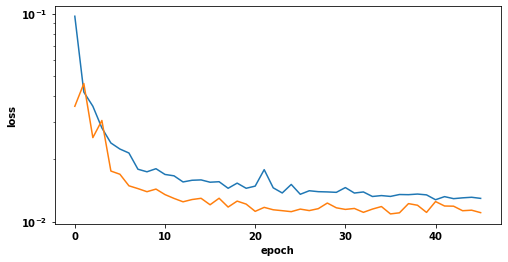

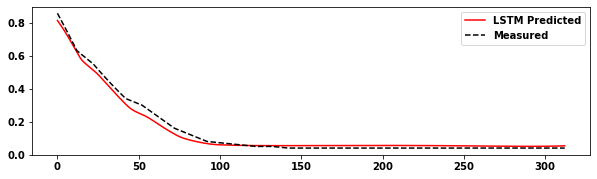

The R2 score of the Training set is :	0.9258
The R2 score of the Testing set is :	0.9854
2 8 90 0.9257574136430424
2 8 90 0.9854252253931146


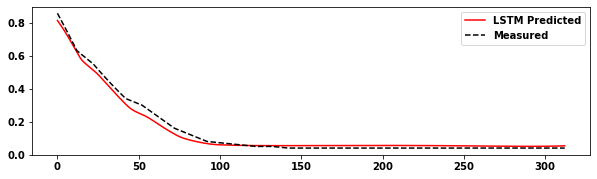

The R2 score of the Training set of  predicted values to predict is :	0.9258
The R2 score of the Testing set predicted values to predict is :	0.9416
Epoch 1/500
89/89 [==============================] - 5s 58ms/step - loss: 0.1052 - accuracy: 0.0000e+00 - val_loss: 0.0388 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0490 - accuracy: 0.0000e+00 - val_loss: 0.0448 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 4s 42ms/step - loss: 0.0436 - accuracy: 0.0000e+00 - val_loss: 0.0358 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 45ms/step - loss: 0.0359 - accuracy: 0.0000e+00 - val_loss: 0.0309 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 40ms/step - loss: 0.0277 - accuracy: 0.0000e+00 - val_loss: 0.0213 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 3s 39ms/step - loss: 0.0244 - accuracy: 0.0000e+

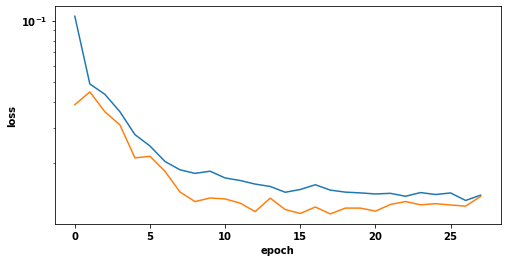

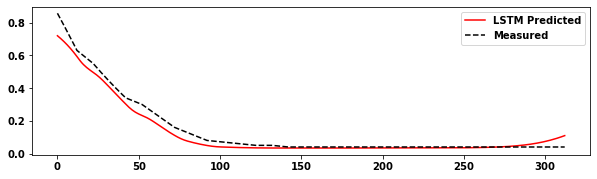

The R2 score of the Training set is :	0.9190
The R2 score of the Testing set is :	0.9668
3 8 90 0.9190285974046244
3 8 90 0.9668144435993085


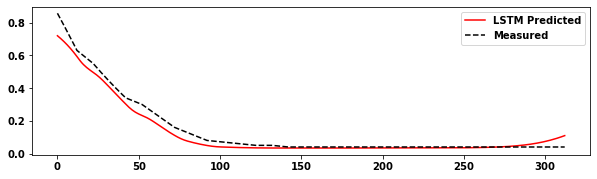

The R2 score of the Training set of  predicted values to predict is :	0.9190
The R2 score of the Testing set predicted values to predict is :	0.8420
Epoch 1/500
89/89 [==============================] - 6s 68ms/step - loss: 0.1147 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 4s 49ms/step - loss: 0.0529 - accuracy: 0.0000e+00 - val_loss: 0.0394 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 5s 51ms/step - loss: 0.0474 - accuracy: 0.0000e+00 - val_loss: 0.0349 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 4s 48ms/step - loss: 0.0383 - accuracy: 0.0000e+00 - val_loss: 0.0396 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 4s 46ms/step - loss: 0.0293 - accuracy: 0.0000e+00 - val_loss: 0.0225 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 4s 49ms/step - loss: 0.0296 - accuracy: 0.0000e+

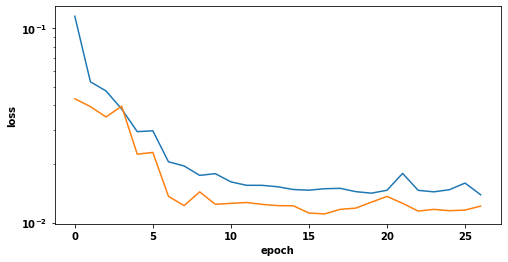

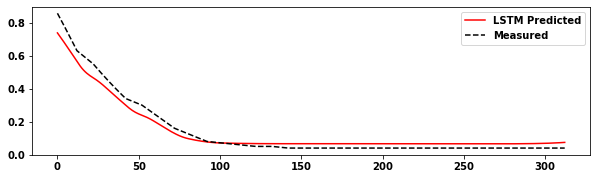

The R2 score of the Training set is :	0.9242
The R2 score of the Testing set is :	0.9591
4 8 90 0.9242012802287357
4 8 90 0.959076976515812


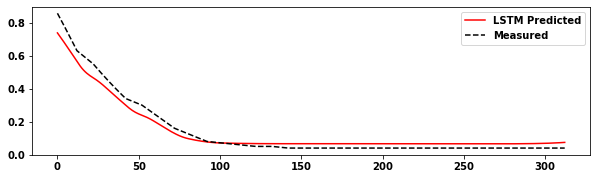

The R2 score of the Training set of  predicted values to predict is :	0.9242
The R2 score of the Testing set predicted values to predict is :	0.8434
Epoch 1/500
89/89 [==============================] - 10s 112ms/step - loss: 0.1330 - accuracy: 0.0000e+00 - val_loss: 0.0435 - val_accuracy: 0.0000e+00
Epoch 2/500
89/89 [==============================] - 6s 67ms/step - loss: 0.0571 - accuracy: 0.0000e+00 - val_loss: 0.0427 - val_accuracy: 0.0000e+00
Epoch 3/500
89/89 [==============================] - 6s 66ms/step - loss: 0.0515 - accuracy: 0.0000e+00 - val_loss: 0.0473 - val_accuracy: 0.0000e+00
Epoch 4/500
89/89 [==============================] - 6s 67ms/step - loss: 0.0410 - accuracy: 0.0000e+00 - val_loss: 0.0460 - val_accuracy: 0.0000e+00
Epoch 5/500
89/89 [==============================] - 7s 75ms/step - loss: 0.0319 - accuracy: 0.0000e+00 - val_loss: 0.0244 - val_accuracy: 0.0000e+00
Epoch 6/500
89/89 [==============================] - 7s 76ms/step - loss: 0.0294 - accuracy: 0.0000

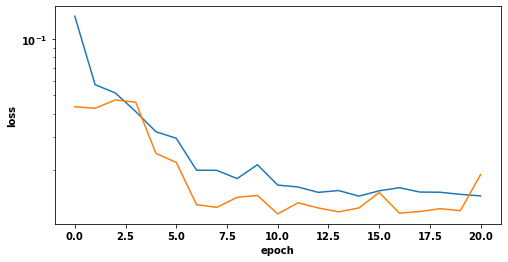

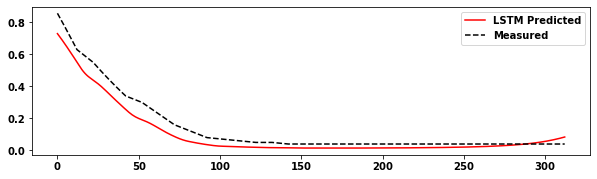

The R2 score of the Training set is :	0.8894
The R2 score of the Testing set is :	0.9187
5 8 90 0.8894301566932414
5 8 90 0.9186867096437227


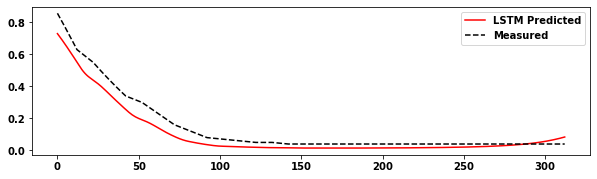

The R2 score of the Training set of  predicted values to predict is :	0.8894
The R2 score of the Testing set predicted values to predict is :	0.8046
Epoch 1/500
88/88 [==============================] - 3s 33ms/step - loss: 0.3104 - accuracy: 0.0000e+00 - val_loss: 0.0458 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0862 - accuracy: 0.0000e+00 - val_loss: 0.0439 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0741 - accuracy: 0.0000e+00 - val_loss: 0.0428 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0675 - accuracy: 0.0000e+00 - val_loss: 0.0406 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0656 - accuracy: 0.0000e+00 - val_loss: 0.0363 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0618 - accuracy: 0.0000e+

88/88 [==============================] - 1s 10ms/step - loss: 0.0170 - accuracy: 0.0000e+00 - val_loss: 0.0123 - val_accuracy: 0.0000e+00
Epoch 55/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0138 - val_accuracy: 0.0000e+00
Epoch 56/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0166 - accuracy: 0.0000e+00 - val_loss: 0.0125 - val_accuracy: 0.0000e+00
Epoch 57/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0138 - val_accuracy: 0.0000e+00
Epoch 58/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0179 - accuracy: 0.0000e+00 - val_loss: 0.0135 - val_accuracy: 0.0000e+00
Epoch 59/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0176 - accuracy: 0.0000e+00 - val_loss: 0.0140 - val_accuracy: 0.0000e+00
Epoch 60/500
88/88 [==============================] - 1s 10ms/step - loss: 0.0178 - accuracy: 0.0000e+00 - 

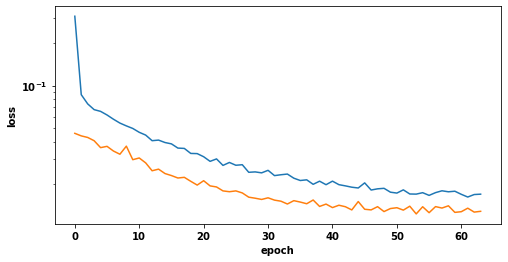

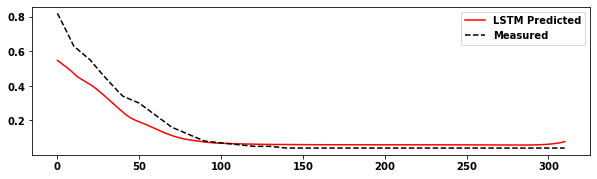

The R2 score of the Training set is :	0.9214
The R2 score of the Testing set is :	0.8705
2 10 10 0.9213503428034807
2 10 10 0.870477284628028


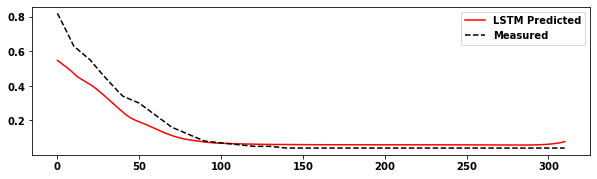

The R2 score of the Training set of  predicted values to predict is :	0.9214
The R2 score of the Testing set predicted values to predict is :	0.7662
Epoch 1/500
88/88 [==============================] - 4s 44ms/step - loss: 0.2485 - accuracy: 0.0000e+00 - val_loss: 0.0514 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0840 - accuracy: 0.0000e+00 - val_loss: 0.0409 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0714 - accuracy: 0.0000e+00 - val_loss: 0.0395 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0665 - accuracy: 0.0000e+00 - val_loss: 0.0363 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0654 - accuracy: 0.0000e+00 - val_loss: 0.0359 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0571 - accuracy: 0.0000e+

88/88 [==============================] - 1s 13ms/step - loss: 0.0173 - accuracy: 0.0000e+00 - val_loss: 0.0127 - val_accuracy: 0.0000e+00
Epoch 55/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0108 - val_accuracy: 0.0000e+00
Epoch 56/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0188 - accuracy: 0.0000e+00 - val_loss: 0.0112 - val_accuracy: 0.0000e+00
Epoch 57/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0186 - accuracy: 0.0000e+00 - val_loss: 0.0125 - val_accuracy: 0.0000e+00
Epoch 58/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0165 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 59/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0165 - accuracy: 0.0000e+00 - val_loss: 0.0111 - val_accuracy: 0.0000e+00
Epoch 60/500
88/88 [==============================] - 1s 13ms/step - loss: 0.0155 - accuracy: 0.0000e+00 - 

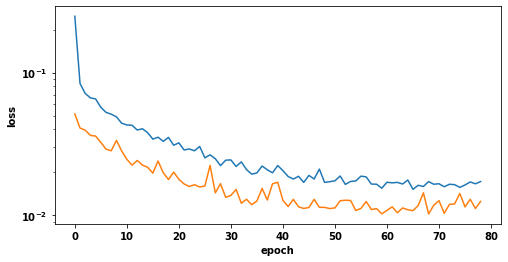

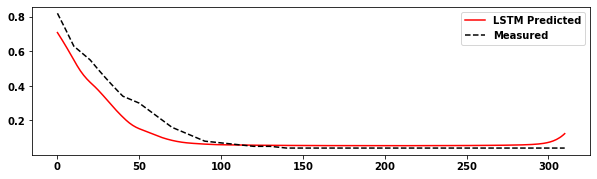

The R2 score of the Training set is :	0.9309
The R2 score of the Testing set is :	0.8910
3 10 10 0.9308767739352194
3 10 10 0.8910123256718828


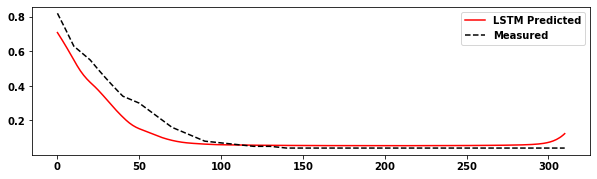

The R2 score of the Training set of  predicted values to predict is :	0.9309
The R2 score of the Testing set predicted values to predict is :	0.7520
Epoch 1/500
88/88 [==============================] - 4s 50ms/step - loss: 0.2523 - accuracy: 0.0000e+00 - val_loss: 0.0512 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 1s 14ms/step - loss: 0.0857 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 1s 16ms/step - loss: 0.0767 - accuracy: 0.0000e+00 - val_loss: 0.0440 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0745 - accuracy: 0.0000e+00 - val_loss: 0.0419 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0737 - accuracy: 0.0000e+00 - val_loss: 0.0405 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 1s 16ms/step - loss: 0.0686 - accuracy: 0.0000e+

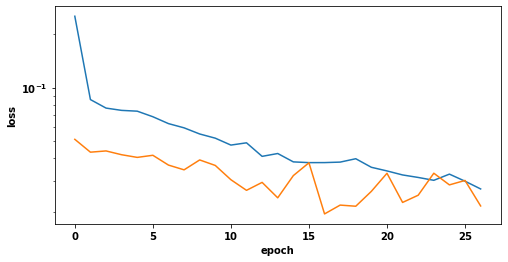

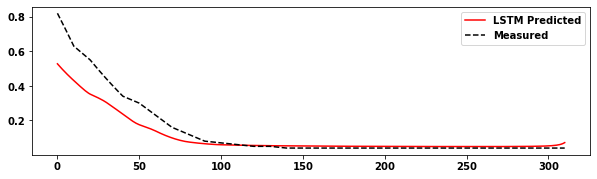

The R2 score of the Training set is :	0.8987
The R2 score of the Testing set is :	0.8168
4 10 10 0.8986647665382772
4 10 10 0.8168345787028013


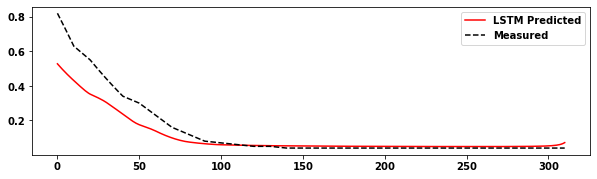

The R2 score of the Training set of  predicted values to predict is :	0.8987
The R2 score of the Testing set predicted values to predict is :	0.6865
Epoch 1/500
88/88 [==============================] - 6s 65ms/step - loss: 0.2585 - accuracy: 0.0000e+00 - val_loss: 0.0590 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0963 - accuracy: 0.0000e+00 - val_loss: 0.0503 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0836 - accuracy: 0.0000e+00 - val_loss: 0.0495 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0771 - accuracy: 0.0000e+00 - val_loss: 0.0464 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0732 - accuracy: 0.0000e+00 - val_loss: 0.0448 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0677 - accuracy: 0.0000e+

88/88 [==============================] - 2s 18ms/step - loss: 0.0187 - accuracy: 0.0000e+00 - val_loss: 0.0254 - val_accuracy: 0.0000e+00
Epoch 55/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0192 - accuracy: 0.0000e+00 - val_loss: 0.0119 - val_accuracy: 0.0000e+00
Epoch 56/500
88/88 [==============================] - 2s 17ms/step - loss: 0.0175 - accuracy: 0.0000e+00 - val_loss: 0.0154 - val_accuracy: 0.0000e+00
Epoch 57/500
88/88 [==============================] - 2s 19ms/step - loss: 0.0174 - accuracy: 0.0000e+00 - val_loss: 0.0307 - val_accuracy: 0.0000e+00
Epoch 58/500
88/88 [==============================] - 2s 19ms/step - loss: 0.0192 - accuracy: 0.0000e+00 - val_loss: 0.0120 - val_accuracy: 0.0000e+00
Epoch 59/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0171 - accuracy: 0.0000e+00 - val_loss: 0.0105 - val_accuracy: 0.0000e+00
Epoch 60/500
88/88 [==============================] - 2s 19ms/step - loss: 0.0194 - accuracy: 0.0000e+00 - 

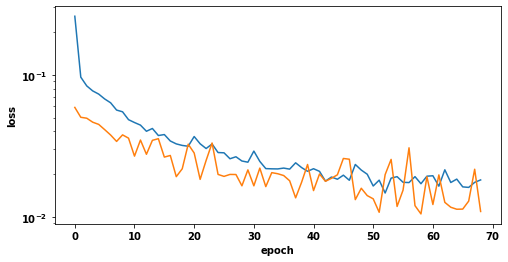

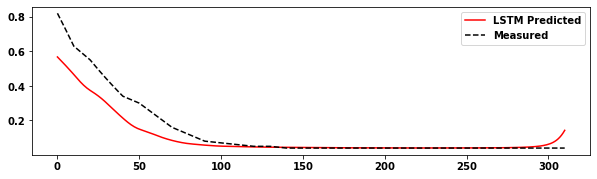

The R2 score of the Training set is :	0.9373
The R2 score of the Testing set is :	0.8260
5 10 10 0.9372553584912329
5 10 10 0.8259731218446061


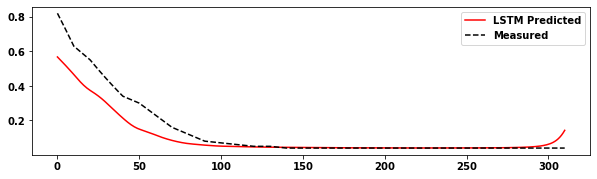

The R2 score of the Training set of  predicted values to predict is :	0.9373
The R2 score of the Testing set predicted values to predict is :	0.7114
Epoch 1/500
88/88 [==============================] - 3s 36ms/step - loss: 0.1674 - accuracy: 0.0000e+00 - val_loss: 0.0406 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0661 - accuracy: 0.0000e+00 - val_loss: 0.0375 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0594 - accuracy: 0.0000e+00 - val_loss: 0.0374 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 1s 12ms/step - loss: 0.0492 - accuracy: 0.0000e+00 - val_loss: 0.0302 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0449 - accuracy: 0.0000e+00 - val_loss: 0.0270 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0402 - accuracy: 0.0000e+

88/88 [==============================] - 1s 12ms/step - loss: 0.0147 - accuracy: 0.0000e+00 - val_loss: 0.0115 - val_accuracy: 0.0000e+00
Epoch 55/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0135 - accuracy: 0.0000e+00 - val_loss: 0.0106 - val_accuracy: 0.0000e+00
Epoch 56/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0141 - accuracy: 0.0000e+00 - val_loss: 0.0104 - val_accuracy: 0.0000e+00
Epoch 57/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0150 - accuracy: 0.0000e+00 - val_loss: 0.0122 - val_accuracy: 0.0000e+00
Epoch 58/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0144 - accuracy: 0.0000e+00 - val_loss: 0.0110 - val_accuracy: 0.0000e+00
Epoch 59/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0140 - accuracy: 0.0000e+00 - val_loss: 0.0130 - val_accuracy: 0.0000e+00
Epoch 60/500
88/88 [==============================] - 1s 11ms/step - loss: 0.0150 - accuracy: 0.0000e+00 - 

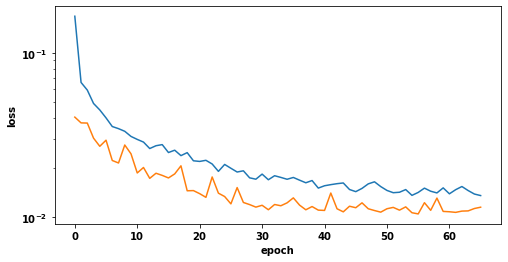

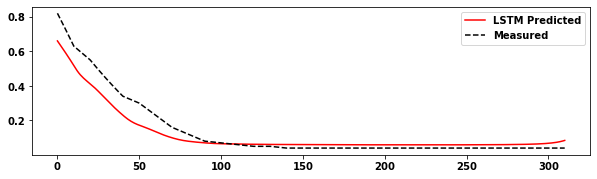

The R2 score of the Training set is :	0.9287
The R2 score of the Testing set is :	0.8898
2 10 20 0.9287374429988531
2 10 20 0.8897938919717894


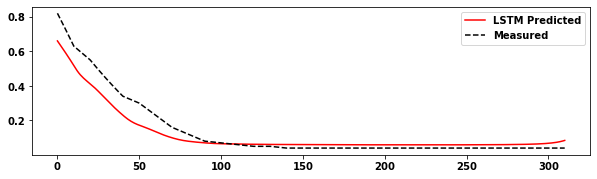

The R2 score of the Training set of  predicted values to predict is :	0.9287
The R2 score of the Testing set predicted values to predict is :	0.7853
Epoch 1/500
88/88 [==============================] - 8s 94ms/step - loss: 0.1783 - accuracy: 0.0000e+00 - val_loss: 0.0477 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0710 - accuracy: 0.0000e+00 - val_loss: 0.0447 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0640 - accuracy: 0.0000e+00 - val_loss: 0.0443 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 1s 14ms/step - loss: 0.0590 - accuracy: 0.0000e+00 - val_loss: 0.0392 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0554 - accuracy: 0.0000e+00 - val_loss: 0.0377 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0451 - accuracy: 0.0000e+

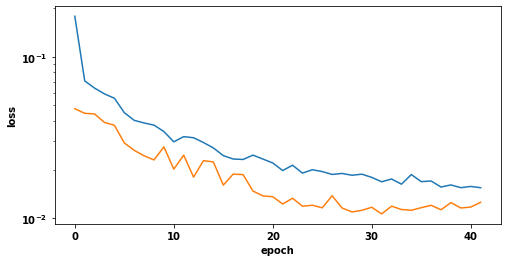

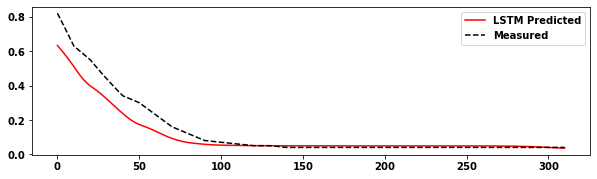

The R2 score of the Training set is :	0.9179
The R2 score of the Testing set is :	0.8868
3 10 20 0.9179485336951996
3 10 20 0.8867811029898522


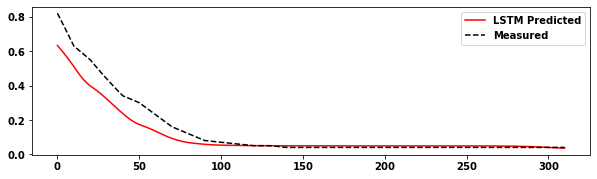

The R2 score of the Training set of  predicted values to predict is :	0.9179
The R2 score of the Testing set predicted values to predict is :	0.7860
Epoch 1/500
88/88 [==============================] - 5s 57ms/step - loss: 0.2030 - accuracy: 0.0000e+00 - val_loss: 0.0486 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0748 - accuracy: 0.0000e+00 - val_loss: 0.0457 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0681 - accuracy: 0.0000e+00 - val_loss: 0.0426 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 2s 17ms/step - loss: 0.0602 - accuracy: 0.0000e+00 - val_loss: 0.0381 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0552 - accuracy: 0.0000e+00 - val_loss: 0.0372 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 2s 18ms/step - loss: 0.0475 - accuracy: 0.0000e+

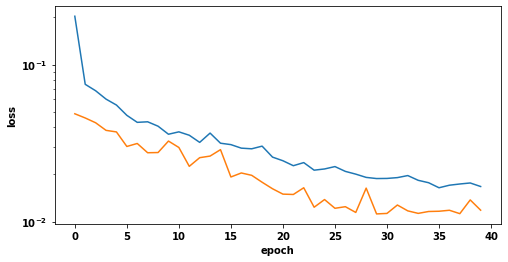

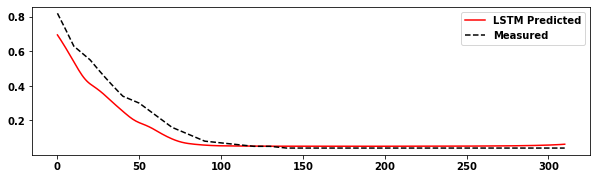

The R2 score of the Training set is :	0.9241
The R2 score of the Testing set is :	0.9154
4 10 20 0.9240515507754691
4 10 20 0.9154132344947404


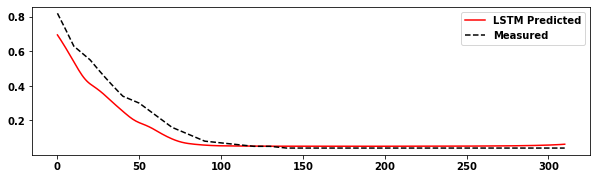

The R2 score of the Training set of  predicted values to predict is :	0.9241
The R2 score of the Testing set predicted values to predict is :	0.8258
Epoch 1/500
88/88 [==============================] - 6s 68ms/step - loss: 0.1769 - accuracy: 0.0000e+00 - val_loss: 0.0543 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 2s 22ms/step - loss: 0.0791 - accuracy: 0.0000e+00 - val_loss: 0.0448 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 2s 21ms/step - loss: 0.0685 - accuracy: 0.0000e+00 - val_loss: 0.0453 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 2s 21ms/step - loss: 0.0640 - accuracy: 0.0000e+00 - val_loss: 0.0393 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 2s 22ms/step - loss: 0.0571 - accuracy: 0.0000e+00 - val_loss: 0.0361 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 2s 21ms/step - loss: 0.0493 - accuracy: 0.0000e+

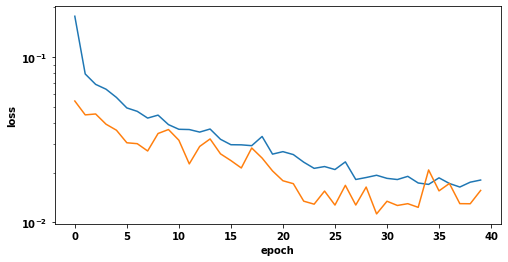

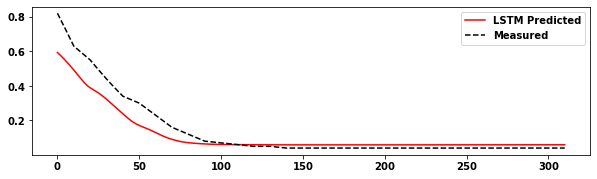

The R2 score of the Training set is :	0.9149
The R2 score of the Testing set is :	0.8658
5 10 20 0.9149247123340235
5 10 20 0.8657891089598503


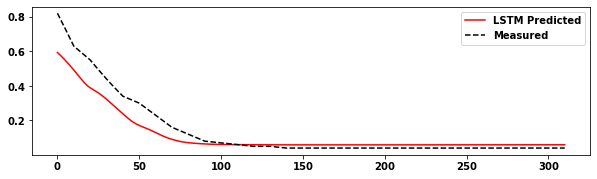

The R2 score of the Training set of  predicted values to predict is :	0.9149
The R2 score of the Testing set predicted values to predict is :	0.7340
Epoch 1/500
88/88 [==============================] - 4s 40ms/step - loss: 0.1254 - accuracy: 0.0000e+00 - val_loss: 0.0460 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0549 - accuracy: 0.0000e+00 - val_loss: 0.0395 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0503 - accuracy: 0.0000e+00 - val_loss: 0.0338 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 1s 15ms/step - loss: 0.0426 - accuracy: 0.0000e+00 - val_loss: 0.0290 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 1s 16ms/step - loss: 0.0377 - accuracy: 0.0000e+00 - val_loss: 0.0273 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 1s 17ms/step - loss: 0.0328 - accuracy: 0.0000e+

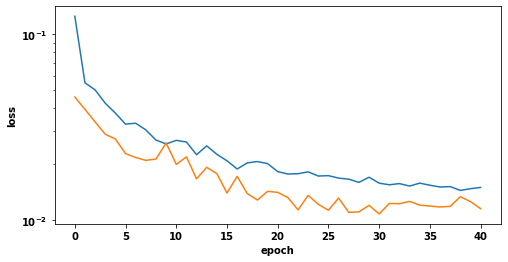

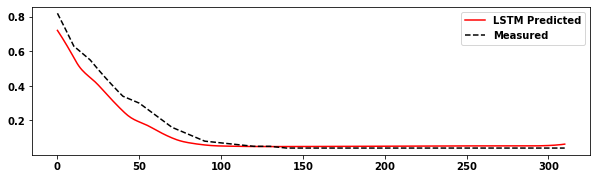

The R2 score of the Training set is :	0.9273
The R2 score of the Testing set is :	0.9367
2 10 30 0.927272925935898
2 10 30 0.9366896695863847


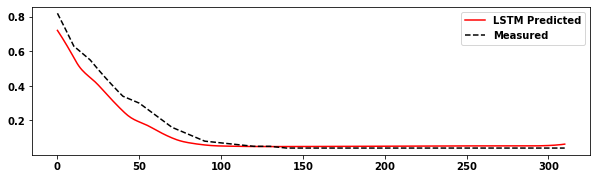

The R2 score of the Training set of  predicted values to predict is :	0.9273
The R2 score of the Testing set predicted values to predict is :	0.8646
Epoch 1/500
88/88 [==============================] - 5s 52ms/step - loss: 0.1428 - accuracy: 0.0000e+00 - val_loss: 0.0488 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 2s 20ms/step - loss: 0.0626 - accuracy: 0.0000e+00 - val_loss: 0.0414 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 2s 20ms/step - loss: 0.0578 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 2s 20ms/step - loss: 0.0504 - accuracy: 0.0000e+00 - val_loss: 0.0347 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 2s 20ms/step - loss: 0.0432 - accuracy: 0.0000e+00 - val_loss: 0.0343 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 2s 20ms/step - loss: 0.0383 - accuracy: 0.0000e+

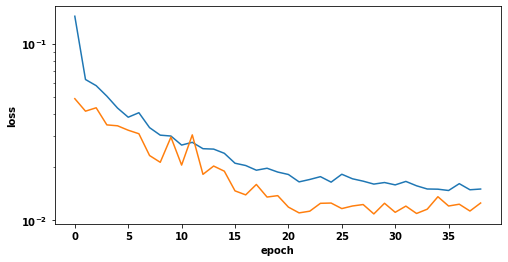

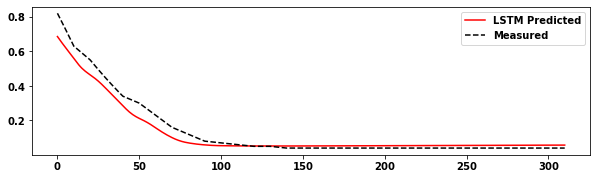

The R2 score of the Training set is :	0.9227
The R2 score of the Testing set is :	0.9480
3 10 30 0.9226627969976663
3 10 30 0.947992215106043


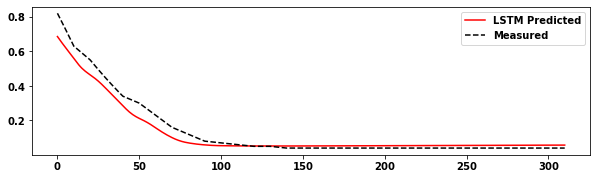

The R2 score of the Training set of  predicted values to predict is :	0.9227
The R2 score of the Testing set predicted values to predict is :	0.8382
Epoch 1/500
88/88 [==============================] - 6s 64ms/step - loss: 0.1496 - accuracy: 0.0000e+00 - val_loss: 0.0466 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 2s 27ms/step - loss: 0.0665 - accuracy: 0.0000e+00 - val_loss: 0.0415 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 2s 26ms/step - loss: 0.0605 - accuracy: 0.0000e+00 - val_loss: 0.0394 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 2s 27ms/step - loss: 0.0498 - accuracy: 0.0000e+00 - val_loss: 0.0350 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 2s 26ms/step - loss: 0.0396 - accuracy: 0.0000e+00 - val_loss: 0.0321 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 2s 27ms/step - loss: 0.0366 - accuracy: 0.0000e+

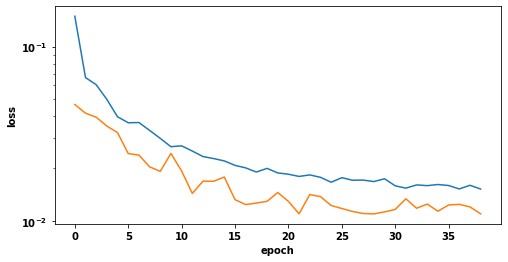

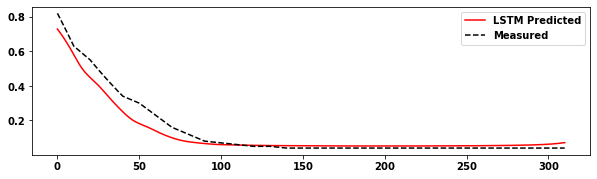

The R2 score of the Training set is :	0.9281
The R2 score of the Testing set is :	0.9355
4 10 30 0.9281185659127614
4 10 30 0.9354721462601738


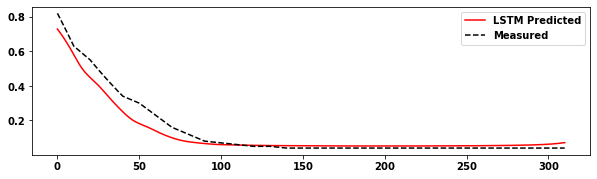

The R2 score of the Training set of  predicted values to predict is :	0.9281
The R2 score of the Testing set predicted values to predict is :	0.8155
Epoch 1/500
88/88 [==============================] - 7s 78ms/step - loss: 0.1714 - accuracy: 0.0000e+00 - val_loss: 0.0506 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 3s 31ms/step - loss: 0.0727 - accuracy: 0.0000e+00 - val_loss: 0.0457 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 3s 32ms/step - loss: 0.0660 - accuracy: 0.0000e+00 - val_loss: 0.0547 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 3s 33ms/step - loss: 0.0604 - accuracy: 0.0000e+00 - val_loss: 0.0430 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 3s 32ms/step - loss: 0.0466 - accuracy: 0.0000e+00 - val_loss: 0.0377 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 3s 33ms/step - loss: 0.0424 - accuracy: 0.0000e+

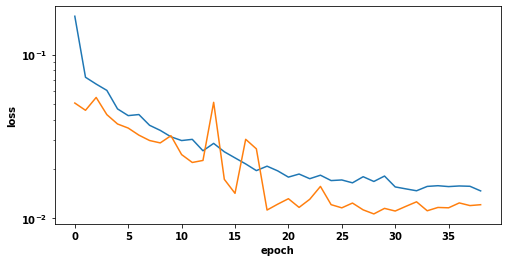

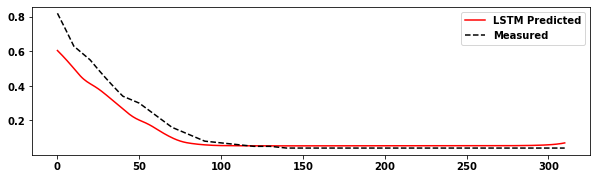

The R2 score of the Training set is :	0.9249
The R2 score of the Testing set is :	0.9014
5 10 30 0.9248973149265552
5 10 30 0.9013562259114359


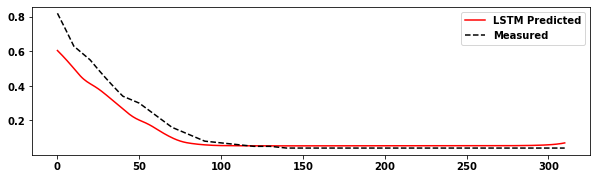

The R2 score of the Training set of  predicted values to predict is :	0.9249
The R2 score of the Testing set predicted values to predict is :	0.7740
Epoch 1/500
88/88 [==============================] - 5s 52ms/step - loss: 0.1110 - accuracy: 0.0000e+00 - val_loss: 0.0473 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 2s 26ms/step - loss: 0.0548 - accuracy: 0.0000e+00 - val_loss: 0.0376 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 2s 25ms/step - loss: 0.0445 - accuracy: 0.0000e+00 - val_loss: 0.0314 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 2s 26ms/step - loss: 0.0397 - accuracy: 0.0000e+00 - val_loss: 0.0319 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 2s 26ms/step - loss: 0.0346 - accuracy: 0.0000e+00 - val_loss: 0.0312 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 2s 26ms/step - loss: 0.0308 - accuracy: 0.0000e+

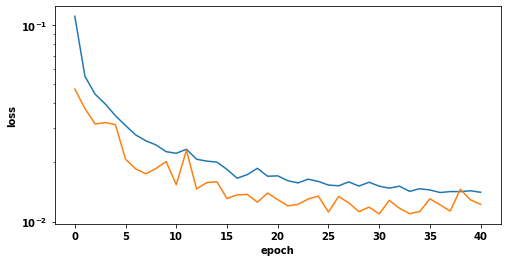

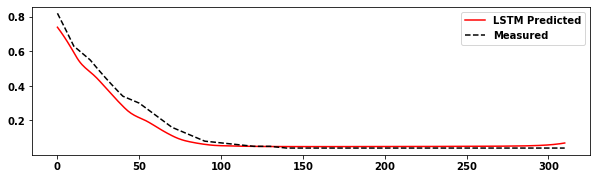

The R2 score of the Training set is :	0.9273
The R2 score of the Testing set is :	0.9658
2 10 40 0.9272652163761106
2 10 40 0.9657556282578847


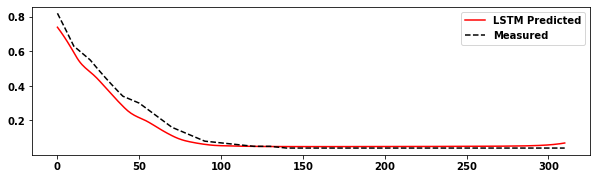

The R2 score of the Training set of  predicted values to predict is :	0.9273
The R2 score of the Testing set predicted values to predict is :	0.8825
Epoch 1/500
88/88 [==============================] - 6s 64ms/step - loss: 0.1200 - accuracy: 0.0000e+00 - val_loss: 0.0429 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 3s 33ms/step - loss: 0.0585 - accuracy: 0.0000e+00 - val_loss: 0.0398 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 3s 33ms/step - loss: 0.0505 - accuracy: 0.0000e+00 - val_loss: 0.0345 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 3s 33ms/step - loss: 0.0441 - accuracy: 0.0000e+00 - val_loss: 0.0339 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 3s 34ms/step - loss: 0.0367 - accuracy: 0.0000e+00 - val_loss: 0.0336 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 3s 33ms/step - loss: 0.0327 - accuracy: 0.0000e+

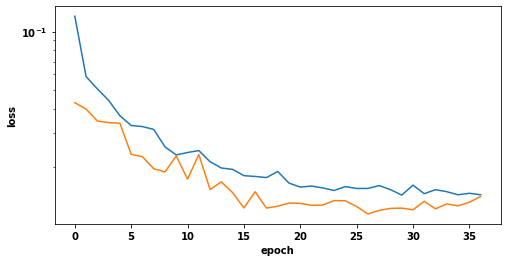

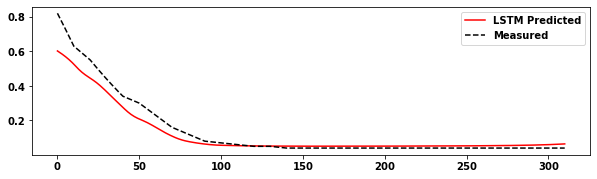

The R2 score of the Training set is :	0.9206
The R2 score of the Testing set is :	0.9248
3 10 40 0.9205617378626989
3 10 40 0.9248008461014048


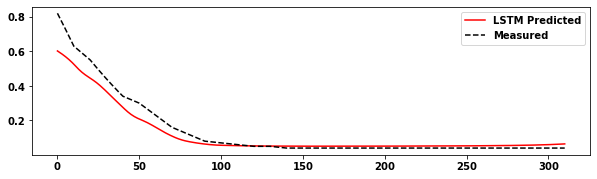

The R2 score of the Training set of  predicted values to predict is :	0.9206
The R2 score of the Testing set predicted values to predict is :	0.7998
Epoch 1/500
88/88 [==============================] - 7s 78ms/step - loss: 0.1469 - accuracy: 0.0000e+00 - val_loss: 0.0511 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 3s 37ms/step - loss: 0.0656 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 3s 37ms/step - loss: 0.0583 - accuracy: 0.0000e+00 - val_loss: 0.0386 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 3s 37ms/step - loss: 0.0478 - accuracy: 0.0000e+00 - val_loss: 0.0327 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 3s 37ms/step - loss: 0.0407 - accuracy: 0.0000e+00 - val_loss: 0.0305 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 3s 37ms/step - loss: 0.0329 - accuracy: 0.0000e+

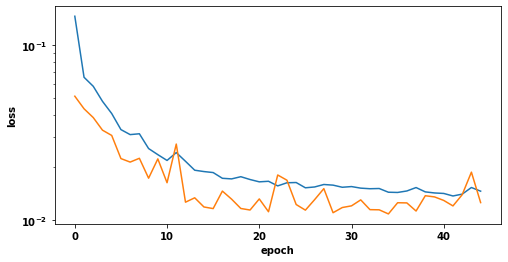

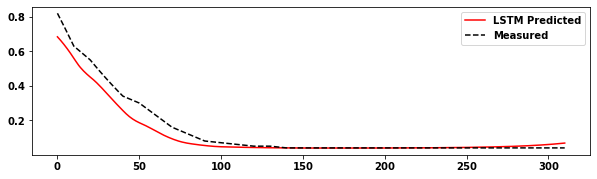

The R2 score of the Training set is :	0.9211
The R2 score of the Testing set is :	0.9312
4 10 40 0.9210989948372964
4 10 40 0.93118473177543


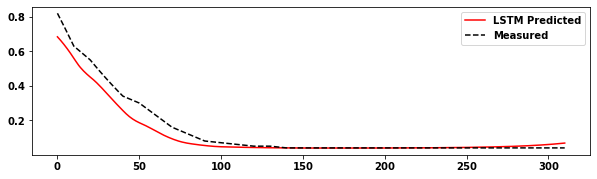

The R2 score of the Training set of  predicted values to predict is :	0.9211
The R2 score of the Testing set predicted values to predict is :	0.7838
Epoch 1/500
88/88 [==============================] - 9s 105ms/step - loss: 0.1602 - accuracy: 0.0000e+00 - val_loss: 0.0521 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 4s 50ms/step - loss: 0.0695 - accuracy: 0.0000e+00 - val_loss: 0.0437 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 4s 50ms/step - loss: 0.0611 - accuracy: 0.0000e+00 - val_loss: 0.0384 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0464 - accuracy: 0.0000e+00 - val_loss: 0.0355 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0374 - accuracy: 0.0000e+00 - val_loss: 0.0359 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0366 - accuracy: 0.0000e

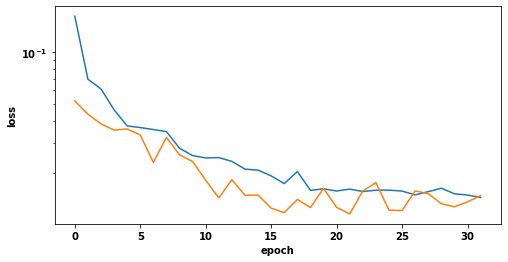

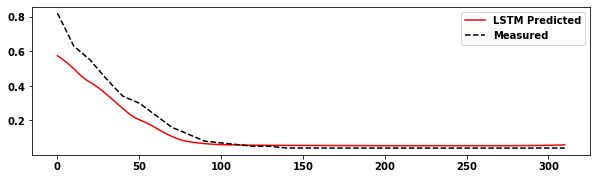

The R2 score of the Training set is :	0.9192
The R2 score of the Testing set is :	0.9011
5 10 40 0.9192155321662978
5 10 40 0.9010685543146089


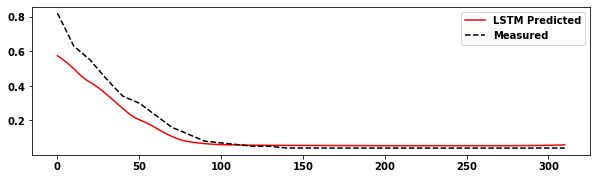

The R2 score of the Training set of  predicted values to predict is :	0.9192
The R2 score of the Testing set predicted values to predict is :	0.7705
Epoch 1/500
88/88 [==============================] - 5s 60ms/step - loss: 0.1102 - accuracy: 0.0000e+00 - val_loss: 0.0481 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 3s 30ms/step - loss: 0.0520 - accuracy: 0.0000e+00 - val_loss: 0.0432 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 3s 30ms/step - loss: 0.0410 - accuracy: 0.0000e+00 - val_loss: 0.0284 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 3s 30ms/step - loss: 0.0340 - accuracy: 0.0000e+00 - val_loss: 0.0259 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 3s 30ms/step - loss: 0.0301 - accuracy: 0.0000e+00 - val_loss: 0.0285 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 3s 32ms/step - loss: 0.0271 - accuracy: 0.0000e+

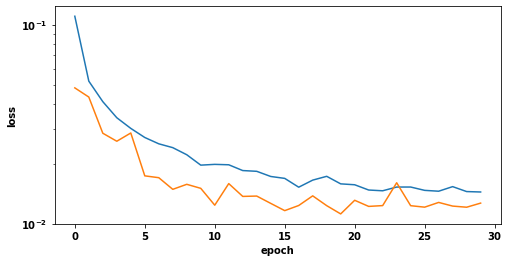

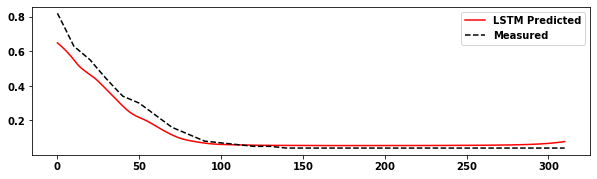

The R2 score of the Training set is :	0.9248
The R2 score of the Testing set is :	0.9461
2 10 50 0.92482441686716
2 10 50 0.9461433874894012


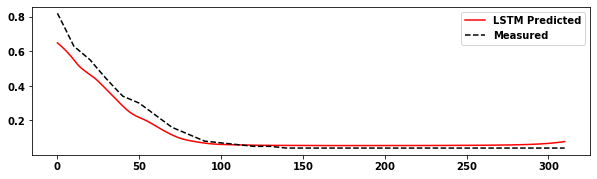

The R2 score of the Training set of  predicted values to predict is :	0.9248
The R2 score of the Testing set predicted values to predict is :	0.8571
Epoch 1/500
88/88 [==============================] - 6s 71ms/step - loss: 0.1177 - accuracy: 0.0000e+00 - val_loss: 0.0425 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 4s 40ms/step - loss: 0.0568 - accuracy: 0.0000e+00 - val_loss: 0.0421 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 4s 40ms/step - loss: 0.0467 - accuracy: 0.0000e+00 - val_loss: 0.0320 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 4s 40ms/step - loss: 0.0392 - accuracy: 0.0000e+00 - val_loss: 0.0323 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 4s 40ms/step - loss: 0.0330 - accuracy: 0.0000e+00 - val_loss: 0.0309 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 3s 40ms/step - loss: 0.0304 - accuracy: 0.0000e+

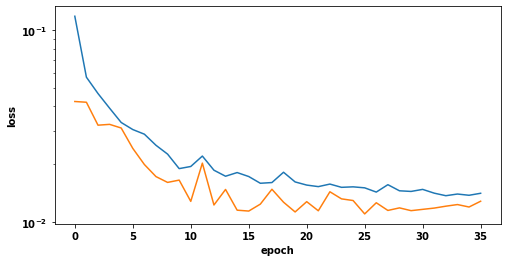

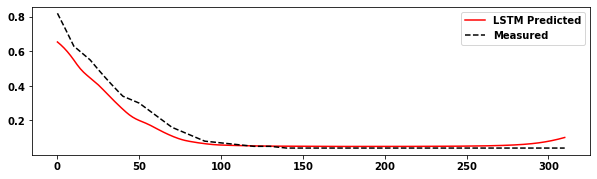

The R2 score of the Training set is :	0.9273
The R2 score of the Testing set is :	0.9317
3 10 50 0.9273037154393994
3 10 50 0.9317318305368775


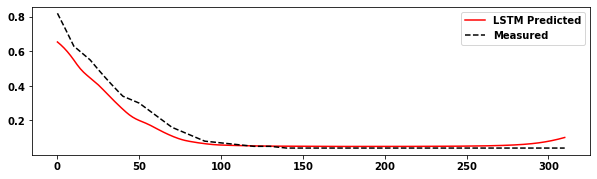

The R2 score of the Training set of  predicted values to predict is :	0.9273
The R2 score of the Testing set predicted values to predict is :	0.8194
Epoch 1/500
88/88 [==============================] - 8s 88ms/step - loss: 0.1236 - accuracy: 0.0000e+00 - val_loss: 0.0447 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 4s 48ms/step - loss: 0.0625 - accuracy: 0.0000e+00 - val_loss: 0.0413 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0533 - accuracy: 0.0000e+00 - val_loss: 0.0402 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 4s 48ms/step - loss: 0.0437 - accuracy: 0.0000e+00 - val_loss: 0.0315 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 4s 48ms/step - loss: 0.0348 - accuracy: 0.0000e+00 - val_loss: 0.0360 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 4s 48ms/step - loss: 0.0318 - accuracy: 0.0000e+

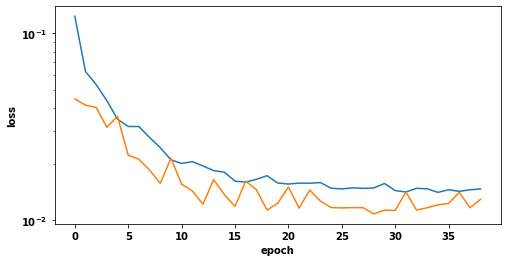

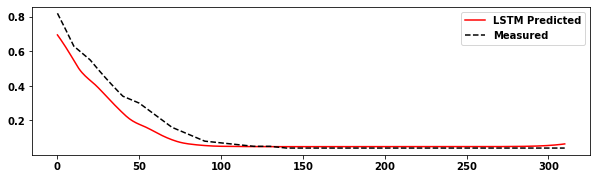

The R2 score of the Training set is :	0.9231
The R2 score of the Testing set is :	0.9158
4 10 50 0.9231454780606774
4 10 50 0.9157856832421626


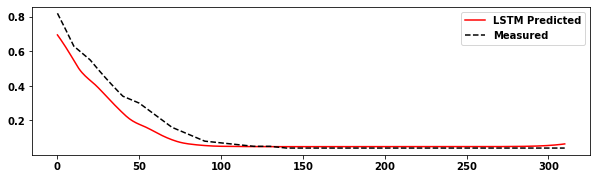

The R2 score of the Training set of  predicted values to predict is :	0.9231
The R2 score of the Testing set predicted values to predict is :	0.7971
Epoch 1/500
88/88 [==============================] - 9s 103ms/step - loss: 0.1341 - accuracy: 0.0000e+00 - val_loss: 0.0465 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 5s 53ms/step - loss: 0.0678 - accuracy: 0.0000e+00 - val_loss: 0.0442 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 5s 53ms/step - loss: 0.0588 - accuracy: 0.0000e+00 - val_loss: 0.0428 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 5s 53ms/step - loss: 0.0478 - accuracy: 0.0000e+00 - val_loss: 0.0377 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 5s 54ms/step - loss: 0.0405 - accuracy: 0.0000e+00 - val_loss: 0.0334 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 5s 54ms/step - loss: 0.0367 - accuracy: 0.0000e

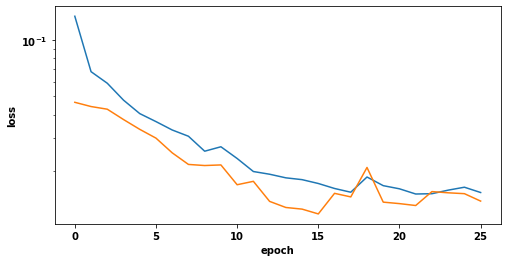

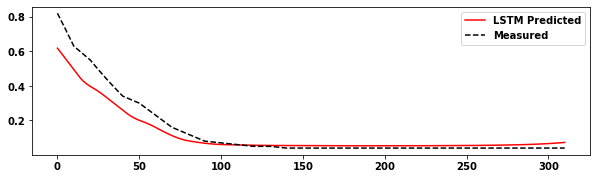

The R2 score of the Training set is :	0.9227
The R2 score of the Testing set is :	0.8956
5 10 50 0.9227380978700817
5 10 50 0.8956015001432002


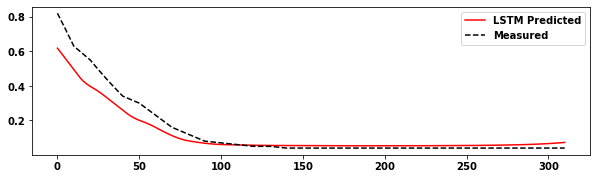

The R2 score of the Training set of  predicted values to predict is :	0.9227
The R2 score of the Testing set predicted values to predict is :	0.7644
Epoch 1/500
88/88 [==============================] - 6s 66ms/step - loss: 0.0936 - accuracy: 0.0000e+00 - val_loss: 0.0373 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 3s 39ms/step - loss: 0.0472 - accuracy: 0.0000e+00 - val_loss: 0.0338 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 3s 39ms/step - loss: 0.0388 - accuracy: 0.0000e+00 - val_loss: 0.0261 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 3s 39ms/step - loss: 0.0323 - accuracy: 0.0000e+00 - val_loss: 0.0274 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 3s 39ms/step - loss: 0.0277 - accuracy: 0.0000e+00 - val_loss: 0.0251 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 3s 39ms/step - loss: 0.0261 - accuracy: 0.0000e+

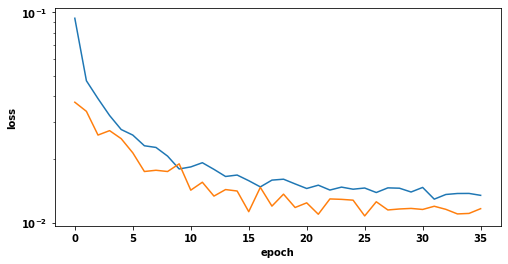

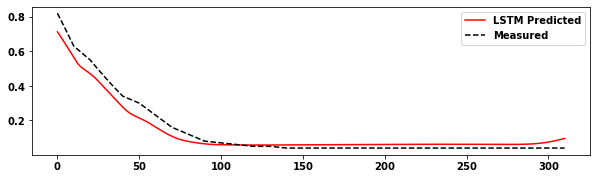

The R2 score of the Training set is :	0.9252
The R2 score of the Testing set is :	0.9484
2 10 60 0.9251966810242855
2 10 60 0.9483568424676158


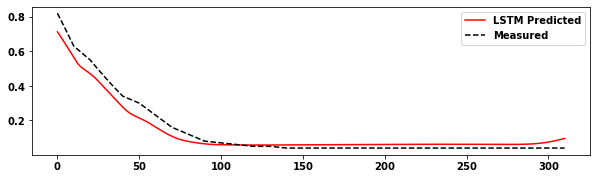

The R2 score of the Training set of  predicted values to predict is :	0.9252
The R2 score of the Testing set predicted values to predict is :	0.8805
Epoch 1/500
88/88 [==============================] - 7s 84ms/step - loss: 0.1015 - accuracy: 0.0000e+00 - val_loss: 0.0412 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 5s 52ms/step - loss: 0.0550 - accuracy: 0.0000e+00 - val_loss: 0.0385 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0450 - accuracy: 0.0000e+00 - val_loss: 0.0280 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 4s 50ms/step - loss: 0.0356 - accuracy: 0.0000e+00 - val_loss: 0.0304 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0300 - accuracy: 0.0000e+00 - val_loss: 0.0266 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 4s 50ms/step - loss: 0.0270 - accuracy: 0.0000e+

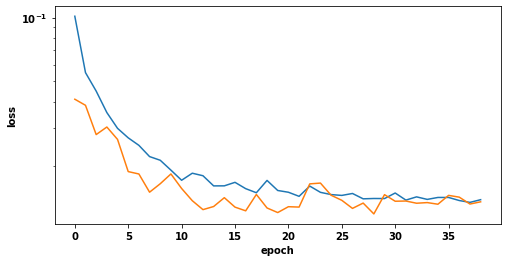

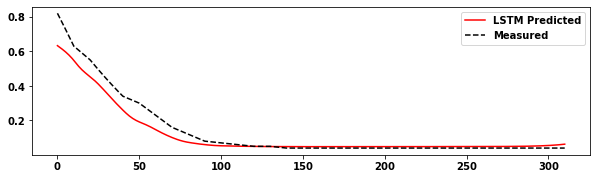

The R2 score of the Training set is :	0.9222
The R2 score of the Testing set is :	0.9278
3 10 60 0.9221787853543117
3 10 60 0.9278377167288502


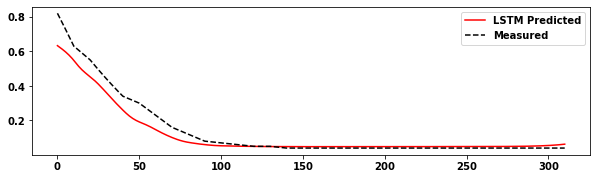

The R2 score of the Training set of  predicted values to predict is :	0.9222
The R2 score of the Testing set predicted values to predict is :	0.7769
Epoch 1/500
88/88 [==============================] - 9s 103ms/step - loss: 0.1249 - accuracy: 0.0000e+00 - val_loss: 0.0445 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0600 - accuracy: 0.0000e+00 - val_loss: 0.0412 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 5s 61ms/step - loss: 0.0505 - accuracy: 0.0000e+00 - val_loss: 0.0379 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 5s 61ms/step - loss: 0.0421 - accuracy: 0.0000e+00 - val_loss: 0.0295 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0316 - accuracy: 0.0000e+00 - val_loss: 0.0347 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0310 - accuracy: 0.0000e

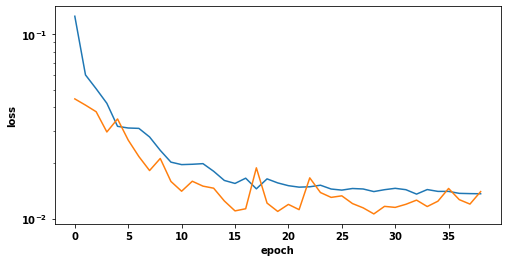

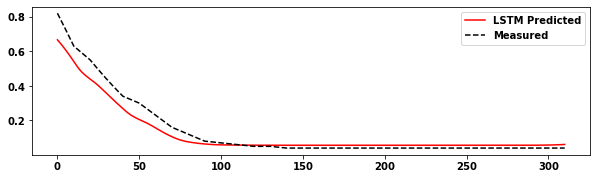

The R2 score of the Training set is :	0.9220
The R2 score of the Testing set is :	0.9316
4 10 60 0.9219940380348068
4 10 60 0.9316116375594533


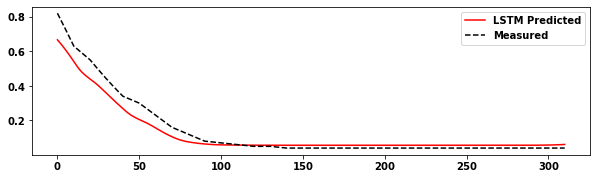

The R2 score of the Training set of  predicted values to predict is :	0.9220
The R2 score of the Testing set predicted values to predict is :	0.8111
Epoch 1/500
88/88 [==============================] - 11s 120ms/step - loss: 0.1352 - accuracy: 0.0000e+00 - val_loss: 0.0476 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 6s 71ms/step - loss: 0.0672 - accuracy: 0.0000e+00 - val_loss: 0.0435 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 6s 71ms/step - loss: 0.0545 - accuracy: 0.0000e+00 - val_loss: 0.0407 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 6s 71ms/step - loss: 0.0441 - accuracy: 0.0000e+00 - val_loss: 0.0433 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 6s 70ms/step - loss: 0.0387 - accuracy: 0.0000e+00 - val_loss: 0.0317 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 6s 70ms/step - loss: 0.0336 - accuracy: 0.0000

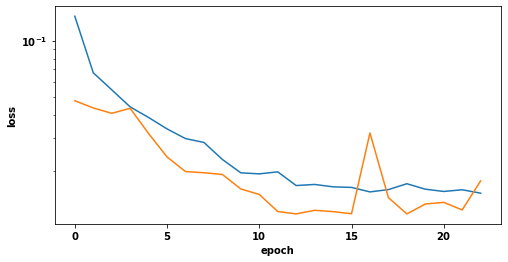

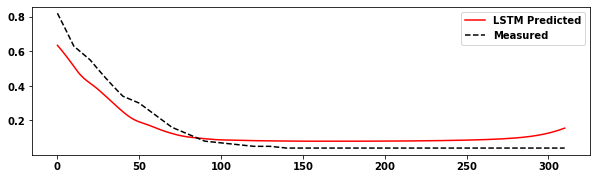

The R2 score of the Training set is :	0.8960
The R2 score of the Testing set is :	0.8635
5 10 60 0.8959722430038262
5 10 60 0.8635162900772193


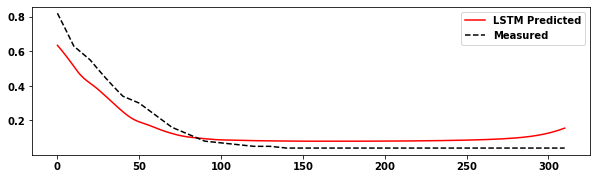

The R2 score of the Training set of  predicted values to predict is :	0.8960
The R2 score of the Testing set predicted values to predict is :	0.7376
Epoch 1/500
88/88 [==============================] - 6s 63ms/step - loss: 0.0878 - accuracy: 0.0000e+00 - val_loss: 0.0368 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 3s 34ms/step - loss: 0.0457 - accuracy: 0.0000e+00 - val_loss: 0.0336 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 3s 35ms/step - loss: 0.0356 - accuracy: 0.0000e+00 - val_loss: 0.0232 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 3s 35ms/step - loss: 0.0286 - accuracy: 0.0000e+00 - val_loss: 0.0255 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 3s 35ms/step - loss: 0.0246 - accuracy: 0.0000e+00 - val_loss: 0.0257 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 3s 35ms/step - loss: 0.0271 - accuracy: 0.0000e+

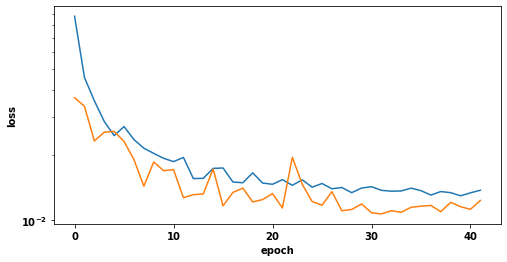

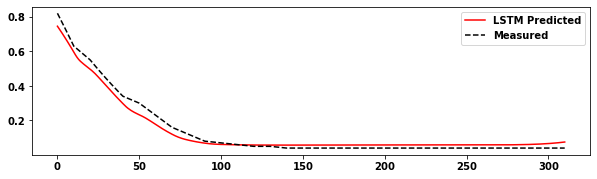

The R2 score of the Training set is :	0.9248
The R2 score of the Testing set is :	0.9724
2 10 70 0.9248269958792765
2 10 70 0.9724325113396537


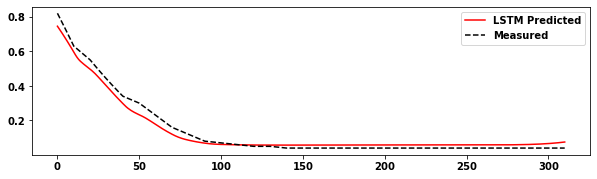

The R2 score of the Training set of  predicted values to predict is :	0.9248
The R2 score of the Testing set predicted values to predict is :	0.9185
Epoch 1/500
88/88 [==============================] - 8s 93ms/step - loss: 0.1091 - accuracy: 0.0000e+00 - val_loss: 0.0412 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 5s 61ms/step - loss: 0.0562 - accuracy: 0.0000e+00 - val_loss: 0.0406 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0449 - accuracy: 0.0000e+00 - val_loss: 0.0267 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 5s 60ms/step - loss: 0.0348 - accuracy: 0.0000e+00 - val_loss: 0.0303 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 5s 61ms/step - loss: 0.0290 - accuracy: 0.0000e+00 - val_loss: 0.0258 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 5s 60ms/step - loss: 0.0276 - accuracy: 0.0000e+

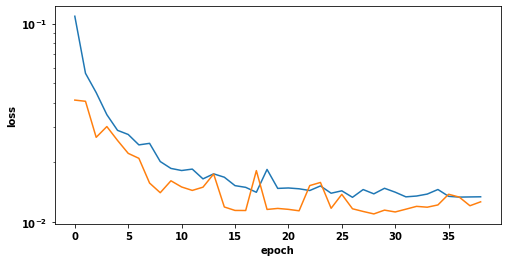

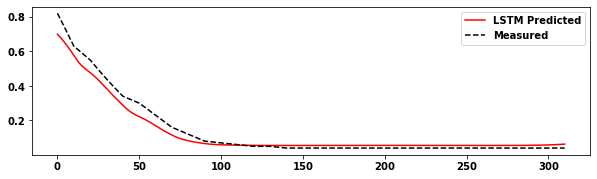

The R2 score of the Training set is :	0.9243
The R2 score of the Testing set is :	0.9610
3 10 70 0.9243409042068251
3 10 70 0.9609547091392424


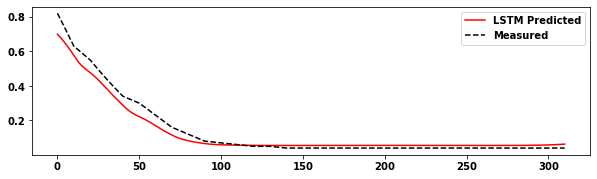

The R2 score of the Training set of  predicted values to predict is :	0.9243
The R2 score of the Testing set predicted values to predict is :	0.8592
Epoch 1/500
88/88 [==============================] - 10s 117ms/step - loss: 0.1111 - accuracy: 0.0000e+00 - val_loss: 0.0440 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 7s 77ms/step - loss: 0.0594 - accuracy: 0.0000e+00 - val_loss: 0.0450 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 7s 74ms/step - loss: 0.0492 - accuracy: 0.0000e+00 - val_loss: 0.0310 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 7s 75ms/step - loss: 0.0388 - accuracy: 0.0000e+00 - val_loss: 0.0305 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 7s 75ms/step - loss: 0.0338 - accuracy: 0.0000e+00 - val_loss: 0.0295 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 7s 75ms/step - loss: 0.0304 - accuracy: 0.0000

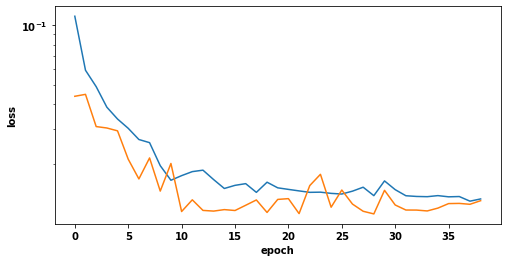

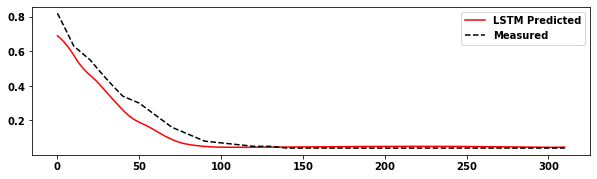

The R2 score of the Training set is :	0.9194
The R2 score of the Testing set is :	0.9380
4 10 70 0.9193557220419166
4 10 70 0.9380456491659042


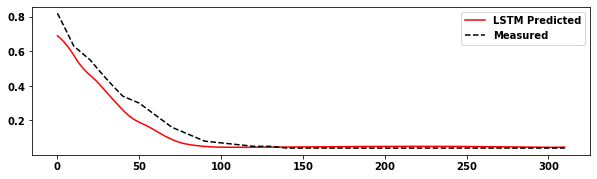

The R2 score of the Training set of  predicted values to predict is :	0.9194
The R2 score of the Testing set predicted values to predict is :	0.8064
Epoch 1/500
88/88 [==============================] - 12s 131ms/step - loss: 0.1223 - accuracy: 0.0000e+00 - val_loss: 0.0473 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 7s 84ms/step - loss: 0.0651 - accuracy: 0.0000e+00 - val_loss: 0.0431 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 7s 83ms/step - loss: 0.0535 - accuracy: 0.0000e+00 - val_loss: 0.0586 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 7s 84ms/step - loss: 0.0477 - accuracy: 0.0000e+00 - val_loss: 0.0324 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 7s 84ms/step - loss: 0.0339 - accuracy: 0.0000e+00 - val_loss: 0.0314 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 8s 91ms/step - loss: 0.0308 - accuracy: 0.0000

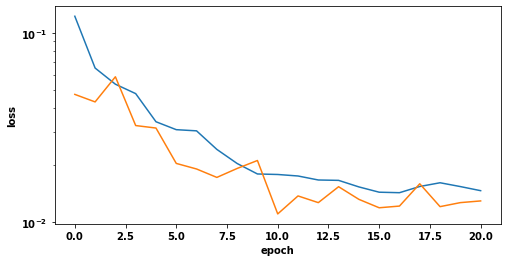

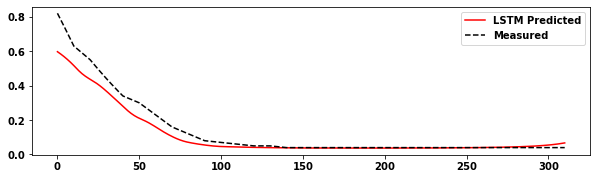

The R2 score of the Training set is :	0.9195
The R2 score of the Testing set is :	0.9210
5 10 70 0.9194626148890137
5 10 70 0.9210020476526498


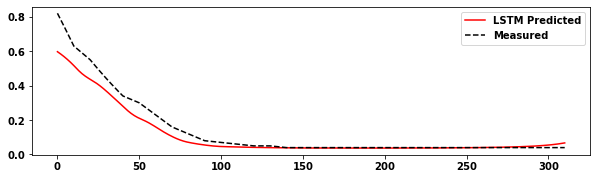

The R2 score of the Training set of  predicted values to predict is :	0.9195
The R2 score of the Testing set predicted values to predict is :	0.7984
Epoch 1/500
88/88 [==============================] - 6s 67ms/step - loss: 0.0908 - accuracy: 0.0000e+00 - val_loss: 0.0372 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 4s 41ms/step - loss: 0.0455 - accuracy: 0.0000e+00 - val_loss: 0.0331 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 4s 41ms/step - loss: 0.0348 - accuracy: 0.0000e+00 - val_loss: 0.0245 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 4s 41ms/step - loss: 0.0286 - accuracy: 0.0000e+00 - val_loss: 0.0265 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 4s 41ms/step - loss: 0.0253 - accuracy: 0.0000e+00 - val_loss: 0.0209 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 4s 40ms/step - loss: 0.0235 - accuracy: 0.0000e+

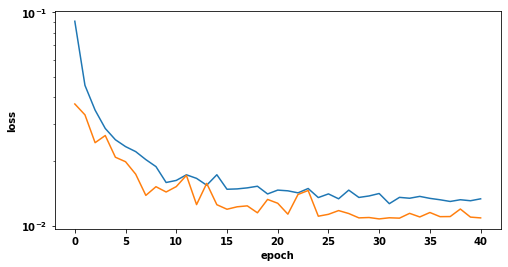

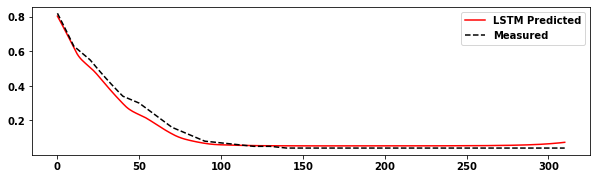

The R2 score of the Training set is :	0.9289
The R2 score of the Testing set is :	0.9803
2 10 80 0.9289332724406704
2 10 80 0.9803428572418348


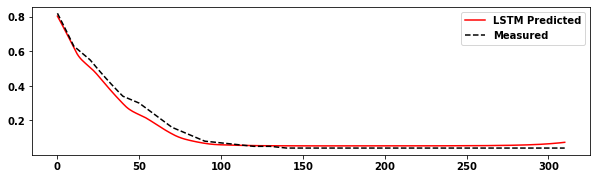

The R2 score of the Training set of  predicted values to predict is :	0.9289
The R2 score of the Testing set predicted values to predict is :	0.9500
Epoch 1/500
88/88 [==============================] - 7s 83ms/step - loss: 0.0904 - accuracy: 0.0000e+00 - val_loss: 0.0415 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 5s 51ms/step - loss: 0.0537 - accuracy: 0.0000e+00 - val_loss: 0.0355 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 5s 54ms/step - loss: 0.0421 - accuracy: 0.0000e+00 - val_loss: 0.0271 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 5s 53ms/step - loss: 0.0337 - accuracy: 0.0000e+00 - val_loss: 0.0288 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 5s 53ms/step - loss: 0.0280 - accuracy: 0.0000e+00 - val_loss: 0.0248 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 5s 55ms/step - loss: 0.0244 - accuracy: 0.0000e+

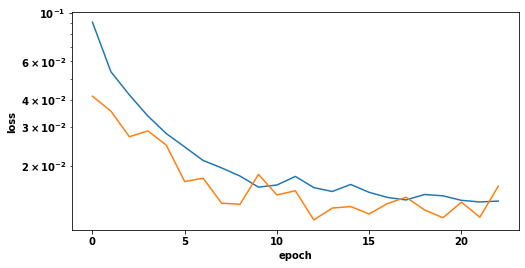

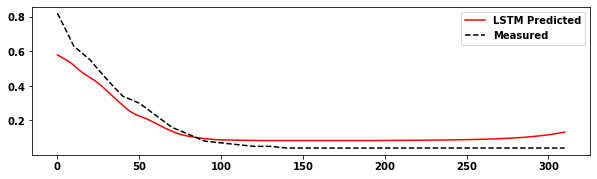

The R2 score of the Training set is :	0.9056
The R2 score of the Testing set is :	0.8845
3 10 80 0.9056410099015273
3 10 80 0.8844744926630344


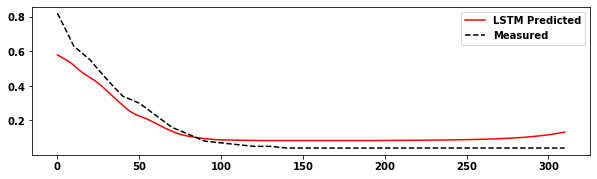

The R2 score of the Training set of  predicted values to predict is :	0.9056
The R2 score of the Testing set predicted values to predict is :	0.7742
Epoch 1/500
88/88 [==============================] - 9s 101ms/step - loss: 0.1069 - accuracy: 0.0000e+00 - val_loss: 0.0447 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0613 - accuracy: 0.0000e+00 - val_loss: 0.0423 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0473 - accuracy: 0.0000e+00 - val_loss: 0.0346 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0421 - accuracy: 0.0000e+00 - val_loss: 0.0302 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 6s 63ms/step - loss: 0.0334 - accuracy: 0.0000e+00 - val_loss: 0.0276 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 6s 64ms/step - loss: 0.0278 - accuracy: 0.0000e

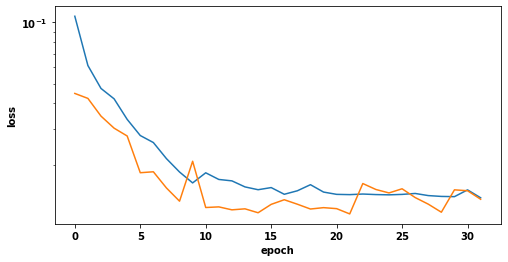

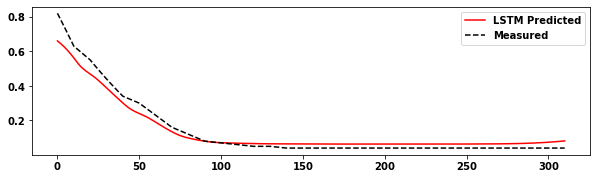

The R2 score of the Training set is :	0.9220
The R2 score of the Testing set is :	0.9549
4 10 80 0.922042970924171
4 10 80 0.9549458111252592


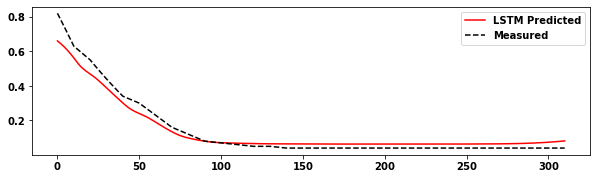

The R2 score of the Training set of  predicted values to predict is :	0.9220
The R2 score of the Testing set predicted values to predict is :	0.8340
Epoch 1/500
88/88 [==============================] - 13s 145ms/step - loss: 0.1215 - accuracy: 0.0000e+00 - val_loss: 0.0464 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 9s 98ms/step - loss: 0.0641 - accuracy: 0.0000e+00 - val_loss: 0.0448 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 9s 97ms/step - loss: 0.0555 - accuracy: 0.0000e+00 - val_loss: 0.0392 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 9s 99ms/step - loss: 0.0469 - accuracy: 0.0000e+00 - val_loss: 0.0307 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 9s 98ms/step - loss: 0.0325 - accuracy: 0.0000e+00 - val_loss: 0.0299 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 9s 98ms/step - loss: 0.0304 - accuracy: 0.0000

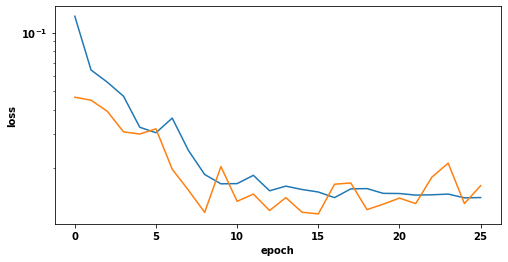

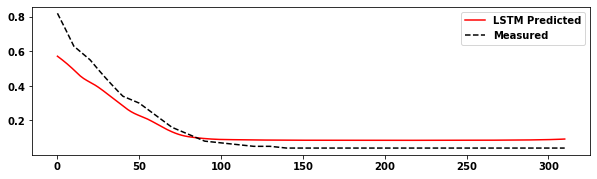

The R2 score of the Training set is :	0.9061
The R2 score of the Testing set is :	0.8762
5 10 80 0.9061361821224345
5 10 80 0.876200211967176


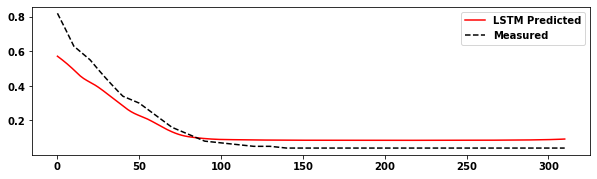

The R2 score of the Training set of  predicted values to predict is :	0.9061
The R2 score of the Testing set predicted values to predict is :	0.7528
Epoch 1/500
88/88 [==============================] - 6s 71ms/step - loss: 0.0845 - accuracy: 0.0000e+00 - val_loss: 0.0389 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 4s 48ms/step - loss: 0.0434 - accuracy: 0.0000e+00 - val_loss: 0.0321 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0337 - accuracy: 0.0000e+00 - val_loss: 0.0235 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 4s 49ms/step - loss: 0.0278 - accuracy: 0.0000e+00 - val_loss: 0.0294 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 4s 48ms/step - loss: 0.0229 - accuracy: 0.0000e+00 - val_loss: 0.0176 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 4s 48ms/step - loss: 0.0225 - accuracy: 0.0000e+

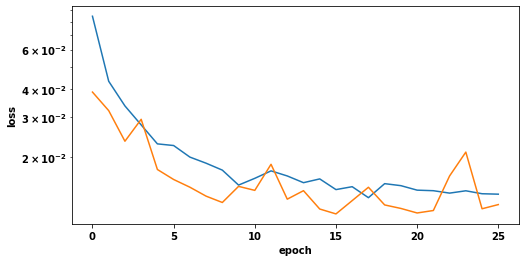

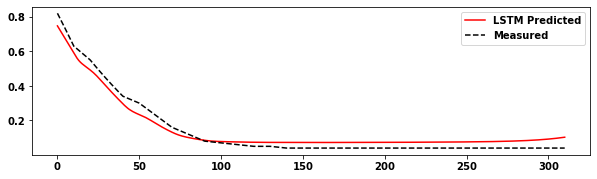

The R2 score of the Training set is :	0.9220
The R2 score of the Testing set is :	0.9549
2 10 90 0.9220195913173859
2 10 90 0.9549014995320265


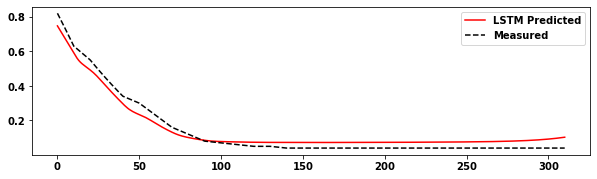

The R2 score of the Training set of  predicted values to predict is :	0.9220
The R2 score of the Testing set predicted values to predict is :	0.9145
Epoch 1/500
88/88 [==============================] - 8s 95ms/step - loss: 0.0947 - accuracy: 0.0000e+00 - val_loss: 0.0421 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 5s 62ms/step - loss: 0.0527 - accuracy: 0.0000e+00 - val_loss: 0.0380 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 6s 63ms/step - loss: 0.0432 - accuracy: 0.0000e+00 - val_loss: 0.0317 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 6s 63ms/step - loss: 0.0331 - accuracy: 0.0000e+00 - val_loss: 0.0322 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 6s 63ms/step - loss: 0.0265 - accuracy: 0.0000e+00 - val_loss: 0.0233 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 6s 63ms/step - loss: 0.0244 - accuracy: 0.0000e+

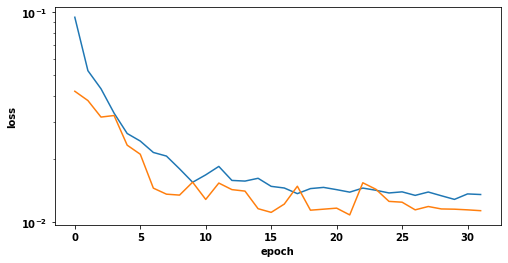

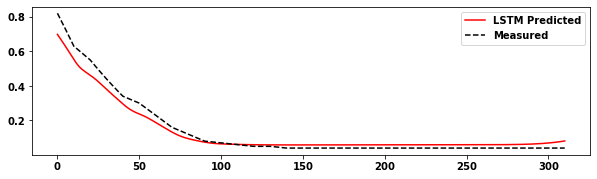

The R2 score of the Training set is :	0.9262
The R2 score of the Testing set is :	0.9580
3 10 90 0.9261543712917999
3 10 90 0.9580142650766729


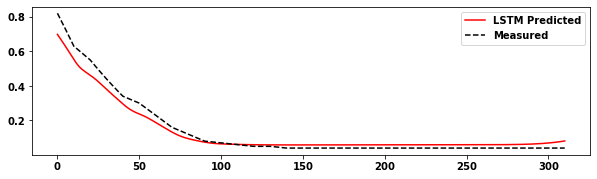

The R2 score of the Training set of  predicted values to predict is :	0.9262
The R2 score of the Testing set predicted values to predict is :	0.8890
Epoch 1/500
88/88 [==============================] - 10s 109ms/step - loss: 0.1038 - accuracy: 0.0000e+00 - val_loss: 0.0442 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 6s 72ms/step - loss: 0.0579 - accuracy: 0.0000e+00 - val_loss: 0.0437 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 6s 74ms/step - loss: 0.0510 - accuracy: 0.0000e+00 - val_loss: 0.0541 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 6s 73ms/step - loss: 0.0383 - accuracy: 0.0000e+00 - val_loss: 0.0400 - val_accuracy: 0.0000e+00 0s - loss: 0.0
Epoch 5/500
88/88 [==============================] - 7s 76ms/step - loss: 0.0286 - accuracy: 0.0000e+00 - val_loss: 0.0248 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 7s 75ms/step - loss: 0.0270 - a

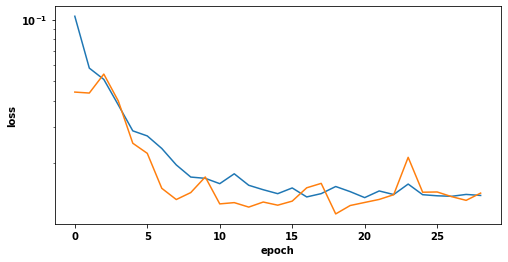

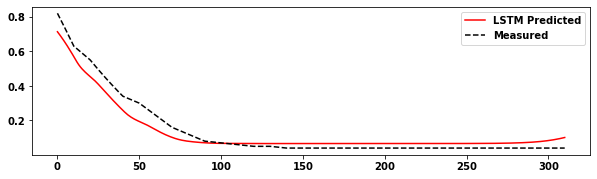

The R2 score of the Training set is :	0.9219
The R2 score of the Testing set is :	0.9286
4 10 90 0.9218821696520907
4 10 90 0.9286449070346569


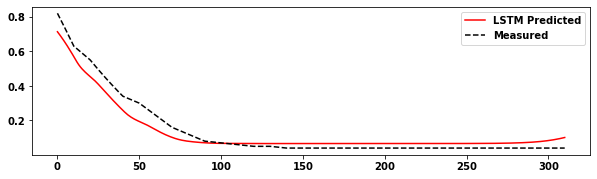

The R2 score of the Training set of  predicted values to predict is :	0.9219
The R2 score of the Testing set predicted values to predict is :	0.8106
Epoch 1/500
88/88 [==============================] - 12s 131ms/step - loss: 0.1210 - accuracy: 0.0000e+00 - val_loss: 0.0459 - val_accuracy: 0.0000e+00
Epoch 2/500
88/88 [==============================] - 7s 84ms/step - loss: 0.0640 - accuracy: 0.0000e+00 - val_loss: 0.0448 - val_accuracy: 0.0000e+00
Epoch 3/500
88/88 [==============================] - 8s 85ms/step - loss: 0.0570 - accuracy: 0.0000e+00 - val_loss: 0.0667 - val_accuracy: 0.0000e+00
Epoch 4/500
88/88 [==============================] - 8s 86ms/step - loss: 0.0456 - accuracy: 0.0000e+00 - val_loss: 0.0312 - val_accuracy: 0.0000e+00
Epoch 5/500
88/88 [==============================] - 8s 87ms/step - loss: 0.0367 - accuracy: 0.0000e+00 - val_loss: 0.0320 - val_accuracy: 0.0000e+00
Epoch 6/500
88/88 [==============================] - 8s 87ms/step - loss: 0.0314 - accuracy: 0.0000

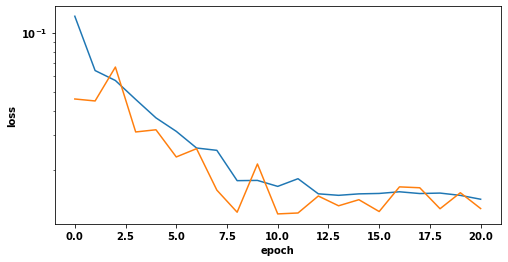

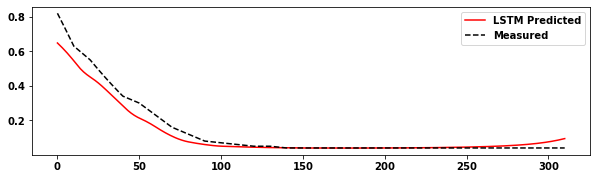

The R2 score of the Training set is :	0.9249
The R2 score of the Testing set is :	0.9398
5 10 90 0.9248660029242817
5 10 90 0.9397729842415942


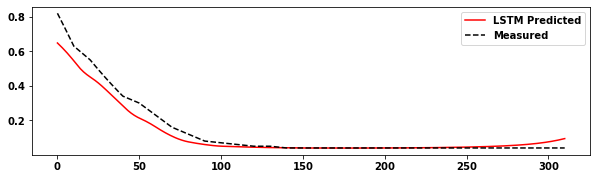

The R2 score of the Training set of  predicted values to predict is :	0.9249
The R2 score of the Testing set predicted values to predict is :	0.8100


In [14]:
seed = 333
import os
import random as rn
import numpy as np
import tensorflow as tf

os.environ['PYTHONHASHSEED']=str(seed)
rn.seed(seed)
np.random.seed(seed)
tf.random.set_seed(seed)

session_conf = tf.compat.v1.ConfigProto(intra_op_parallelism_threads=1, inter_op_parallelism_threads=1)
sess = tf.compat.v1.Session(graph=tf.compat.v1.get_default_graph(), config=session_conf)
tf.compat.v1.keras.backend.set_session(sess)

for window in range(2,11,2):
    X = []
    Y = []
    for i in range(window,len(Xs)):
        X.append(Xs[i-window:i,:])
        Y.append(Ys[i])
# Reshape data to format accepted by LSTM
    X, Y = np.array(X), np.array(Y)
    
    #LSTM model
    for j in range (10,91,10):
        
        def layer2(shape1,shape2):
            model = Sequential()
            model.add(LSTM(units=j, return_sequences=True, \
                  input_shape=(shape1,shape2)))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j, return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j))
            model.add(Dropout(0.2))
            model.add(Dense(units=1))
            model.compile(optimizer = 'adam', loss = 'mean_squared_error',\
                      metrics = ['accuracy'])
            return model
        
        def layer3(shape1,shape2):
            model = Sequential()
            model.add(LSTM(units=j,return_sequences=True, \
                  input_shape=(shape1,shape2)))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j))
            model.add(Dropout(0.2))
            model.add(Dense(units=1))
            model.compile(optimizer = 'adam', loss = 'mean_squared_error',\
                      metrics = ['accuracy'])



            return model 
        
        def layer4(shape1,shape2):
            model = Sequential()
            model.add(LSTM(units=j,return_sequences=True, \
                  input_shape=(shape1,shape2)))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j))
            model.add(Dropout(0.2))
            model.add(Dense(units=1))
            model.compile(optimizer = 'adam', loss = 'mean_squared_error',\
                      metrics = ['accuracy'])
            return model
        
        
        
        def layer5(shape1,shape2):
            model = Sequential()
            model.add(LSTM(units=j,return_sequences=True, \
                  input_shape=(shape1,shape2)))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j,return_sequences=True))
            model.add(Dropout(0.2))
            model.add(LSTM(units=j))
            model.add(Dropout(0.2))
            model.add(Dense(units=1))
            model.compile(optimizer = 'adam', loss = 'mean_squared_error',\
                      metrics = ['accuracy'])
            return model 
        

        
        for k in range (2,6):
            if (k==2):
                model=layer2(X.shape[1],X.shape[2])
            elif (k==3):
                model=layer3(X.shape[1],X.shape[2])
            elif (k==4):
                model=layer4(X.shape[1],X.shape[2])
            elif (k==5):
                model=layer5(X.shape[1],X.shape[2])

        
            # Allow for early exit
            es = EarlyStopping(monitor='val_loss',mode='min',verbose=1,patience=10)

            # Fit (and time) LSTM model
            t0 = time.time()
            #history = model.fit(X, Y, epochs=500, validation_split=0.1, verbose=0)
            history = model.fit(X, Y, epochs = 500, batch_size = 32, callbacks=[es], verbose=1, validation_split=0.2)
            t1 = time.time()
            timeit = t1-t0
            print('Runtime: %.2f s' %(timeit))

            # Plot loss
            plt.figure(figsize=(8,4))
            plt.semilogy(history.history['loss'])
            plt.semilogy(history.history['val_loss'])
            plt.xlabel('epoch'); plt.ylabel('loss')
            plt.savefig('Tdrop_loss.png')
            model.save('model.h5')
            plt.show()

            # Verify the fit of the model
            Yp = model.predict(X)#.flatten().values()
            Yp = Yp.reshape((Yp.shape[0],Yp.shape[1]))

            # un-scale outputs
            Yu = s2.inverse_transform(Yp)
            Ym = s2.inverse_transform(Y)



            Xts = s3.fit_transform(X_test)
            Yts = s4.fit_transform(y_test)

            Xti = []
            Yti = []
            for i in range(window,len(Xts)):
                Xti.append(Xts[i-window:i,:])
                Yti.append(Yts[i])

            # Reshape data to format accepted by LSTM
            Xti, Yti = np.array(Xti), np.array(Yti)

            # Verify the fit of the model
            Ytp = model.predict(Xti)

            # un-scale outputs
            Ytu = s4.inverse_transform(Ytp)
            Ytm = s4.inverse_transform(Yti)

            plt.figure(figsize=(10,6))
            plt.subplot(2,1,1)
            plt.plot(Ytu,'r-',label='LSTM Predicted')
            plt.plot(Ytm,'k--',label='Measured')
            plt.legend()
            plt.show()

            print('The R2 score of the Training set is :\t{:0.4f}'.format(r2_score(Ym, Yu)))
            print('The R2 score of the Testing set is :\t{:0.4f}'.format(r2_score(Ytm, Ytu)))
            R2SCORETRAIN = r2_score(Ym,Yu)
            R2SCORETEST = r2_score(Ytm, Ytu)
            print(k,window,j,R2SCORETRAIN)
            print(k,window, j,R2SCORETEST)

            winn1.append([k,window,j,R2SCORETRAIN,R2SCORETEST,timeit])


            # Using predicted values to predict next step
            Xtsq = Xts.copy()
            for i in range(window,len(Xtsq)):
                Xin = Xtsq[i-window:i].reshape((1, window, 4))
                Xtsq[i][0] = model.predict(Xin)
                Yti[i-window] = Xtsq[i][0]

            Ytn = (Yti - s2.min_[0])/s2.scale_[0]
            Ytn = s4.inverse_transform(Yti)

            #Plots
            plt.figure(figsize=(10,6))
            plt.subplot(2,1,1)
            plt.plot(Ytu,'r-',label='LSTM Predicted')
            plt.plot(Ytm,'k--',label='Measured')
            plt.legend()
            plt.show()
            
#             Xin = Xin.reshape((1,4))
#             Xin = s3.inverse_transform(Xin)

            # calculates and print r_2 score of training and testing
            print('The R2 score of the Training set of  predicted values to predict is :\t{:0.4f}'.format(r2_score(Ym, Yu)))
            print('The R2 score of the Testing set predicted values to predict is :\t{:0.4f}'.format(r2_score(Ytm, Ytn)))
            R2SCOREPRED = r2_score(Ytm, Ytn)            
            predd.append([k,window,j,R2SCORETRAIN,R2SCOREPRED])
            for i in range(0,len(Ytm)):
                data.append([k,window,j,Xval[i+window,0],Xval[i+window,1],Xval[i+window,2],Ytm[i,0],Ytu[i,0],Ytn[i,0]])
    #         for i in range(0,len(Ytm)):
    #             while i < 20:
    #                 data.append([window,j,Ytm[i][0],Ytu[i][0],Ytn[i][0]])
    #                 break

## For Train-Test Evaluation Score Pick

In [15]:
colns = winn1.pop(0)

df_cheeck = pd.DataFrame(winn1, columns=colns)
df_cheeck

,Hidden Layer,Time Step,Neuron,R2SCORETRAIN,R2SCORETEST,Training Time
0,2,2,10,0.924564,0.966973,31.949743
1,3,2,10,0.923956,0.966145,30.468578
2,4,2,10,0.921325,0.957105,37.435013
3,5,2,10,0.917204,0.929764,41.132658
4,2,2,20,0.927991,0.976877,30.159692
...,...,...,...,...,...,...
175,5,10,80,0.906136,0.876200,245.763631
176,2,10,90,0.922020,0.954901,120.976412
177,3,10,90,0.926154,0.958014,193.420638
178,4,10,90,0.921882,0.928645,207.666523


In [18]:
df_cheeck.to_excel("Optimizing neuron10-90 and timestep2-10 unsorted relup10(Test).xlsx")

In [16]:
df_cheeck.sort_values(['R2SCORETEST'],ascending=[False])

,Hidden Layer,Time Step,Neuron,R2SCORETRAIN,R2SCORETEST,Training Time
20,2,2,60,0.927311,0.986569,54.716644
24,2,2,70,0.925852,0.985986,35.389340
140,2,8,90,0.925757,0.985425,170.654524
32,2,2,90,0.926560,0.984817,36.890324
18,4,2,50,0.926279,0.982816,70.461529
...,...,...,...,...,...,...
111,5,8,10,0.931605,0.868993,172.102654
151,5,10,20,0.914925,0.865789,93.500904
167,5,10,60,0.895972,0.863516,163.785895
147,5,10,10,0.937255,0.825973,129.395890


In [19]:
df_sortt = df_cheeck.sort_values(['R2SCORETEST'],ascending=[False])

In [20]:
df_sortt.to_excel("Optimizing neuron10-90 and timestep2-10 relup10(Test).xlsx")

## Dataset Evaluation

In [17]:
clm = data.pop(0)

dat = pd.DataFrame(data, columns=clm)
dat

,Hidden Layer,Time Step,Neuron,Temp,Size,Time,Actual Mc,Predicted Mc,Next Prediction
0,2,2,10,368.0,4.5,2.0,0.96480,0.839265,0.839264
1,2,2,10,368.0,4.5,3.0,0.94705,0.828961,0.809781
2,2,2,10,368.0,4.5,4.0,0.92920,0.818308,0.792702
3,2,2,10,368.0,4.5,5.0,0.91125,0.807296,0.781816
4,2,2,10,368.0,4.5,6.0,0.89320,0.795914,0.770284
...,...,...,...,...,...,...,...,...,...
56695,5,10,90,368.0,4.5,316.0,0.04000,0.085635,0.085896
56696,5,10,90,368.0,4.5,317.0,0.04000,0.087654,0.087957
56697,5,10,90,368.0,4.5,318.0,0.04000,0.089763,0.090110
56698,5,10,90,368.0,4.5,319.0,0.04000,0.091962,0.092358


In [21]:
dat.to_excel("#Dataset neuron10-90 and timestep2-10 relup10.xlsx")

## For Train-Predict Evaluation Score Pick

In [22]:
cols = predd.pop(0)

df_cheeck2 = pd.DataFrame(predd, columns=cols)
df_cheeck2

,Hidden Layer,Time Step,Neuron,R2SCORETRAIN,R2SCOREPRED
0,2,2,10,0.924564,0.952164
1,3,2,10,0.923956,0.948614
2,4,2,10,0.921325,0.933741
3,5,2,10,0.917204,0.867703
4,2,2,20,0.927991,0.941628
...,...,...,...,...,...
175,5,10,80,0.906136,0.752761
176,2,10,90,0.922020,0.914497
177,3,10,90,0.926154,0.888981
178,4,10,90,0.921882,0.810565


In [23]:
df_cheeck2.to_excel("Optimizing neuron10-90 and timestep2-10 unsorted relup10(Pred).xlsx")

In [24]:
df_predd = df_cheeck2.sort_values(['R2SCOREPRED'],ascending=[False])
df_predd

,Hidden Layer,Time Step,Neuron,R2SCORETRAIN,R2SCOREPRED
32,2,2,90,0.926560,0.973834
24,2,2,70,0.925852,0.972667
20,2,2,60,0.927311,0.970826
29,3,2,80,0.925825,0.966338
36,2,4,10,0.925560,0.963599
...,...,...,...,...,...
110,4,8,10,0.932334,0.737869
167,5,10,60,0.895972,0.737628
151,5,10,20,0.914925,0.734018
147,5,10,10,0.937255,0.711379


In [25]:
df_predd.to_excel("Optimizing neuron10-90 and timestep2-10 relup10(Pred).xlsx")